In [1]:
import rpy2
%load_ext rpy2.ipython
%R library(lme4)
%R library(sjPlot)
%R library(ggplot2)
%R library(readr)

import ast
import os
import sys
import math
#import fminbnd
import pandas as pd
from joblib import Parallel, delayed
import scipy.stats as stats
import matplotlib.pyplot as plt
import matplotlib.lines as mlines
import matplotlib.patches as ptch
import multiprocessing
import seaborn as sns
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import scipy
from scipy.stats import norm
from scipy.signal import fftconvolve
import pickle
import datetime
from statistics import mean
import brewer2mpl as b2mpl


/Users/alicexue/anaconda2/lib/python2.7/site-packages/rpy2/rinterface/__init__.py:186: RRuntimeWarning: Loading required package: Matrix

  warnings.warn(x, RRuntimeWarning)


## Compile Food csv

In [2]:
expId = 'MDMRTST'

_thisDir = os.path.dirname(os.path.abspath('__file__')).decode(sys.getfilesystemencoding())

_dataDir = os.path.dirname(_thisDir) # move one directory up
_dataDir = _dataDir + '/data/' + expId + '/' # move to data folder

auctionFileEnd = '_AuctionData2.csv'
choiceFileEnd = '_SceneChoiceTaskData.csv'
familiarityRatingsFileEnd = '_FamiliarityData.csv'

def get_all_subjects():
    subjects = []
    dataDir = _thisDir + '/' + expId + '/'
    
    subjectInfoFile = _dataDir + expId + '_subject_assignment_info.csv'
    df = pd.read_csv(subjectInfoFile)
    subjects = df['subjectId'].values
    return subjects

# get subjects who completed up to familiarity task
def get_subjects_w_full_data():
    subjectInfoFile = _dataDir + expId + '_subject_assignment_info.csv'
    all_subjects = get_all_subjects()
    print "total number of people who accepted the HIT",len(all_subjects)
    subjects = []
    
    subjects_to_exclude = ['MDMRTST_0013']
    
    if os.path.exists(subjectInfoFile):
        df = pd.read_csv(subjectInfoFile)
        for subject in all_subjects:
            fromMTurk = df.loc[df['subjectId'] == subject]['turkSubmitTo'] == 'https://www.mturk.com'
            completedAuction = df.loc[df['subjectId'] == subject]['completedAuction2'] 
            completedChoiceTask = df.loc[df['subjectId'] == subject]['completedSceneChoiceTask']
            if subject not in subjects_to_exclude and fromMTurk.bool() and completedAuction.bool() and completedChoiceTask.bool():
                subjects.append(subject)
    print len(subjects), 'subjects completed the auction and choice tasks.'
    return subjects

# get subjects who completed everything, including familiarity task
def get_subjects_w_all_data():
    subjectInfoFile = _dataDir + expId + '_subject_assignment_info.csv'
    all_subjects = get_all_subjects()
    print "total number of people who accepted the HIT",len(all_subjects)
    subjects = []
    
    subjects_to_exclude = ['MDMRTST_0013']
    
    if os.path.exists(subjectInfoFile):
        df = pd.read_csv(subjectInfoFile)
        for subject in all_subjects:
            fromMTurk = df.loc[df['subjectId'] == subject]['turkSubmitTo'] == 'https://www.mturk.com'
            completedAuction = df.loc[df['subjectId'] == subject]['completedAuction2'] 
            completedChoiceTask = df.loc[df['subjectId'] == subject]['completedSceneChoiceTask']
            completedFamiliarityTask = df.loc[df['subjectId'] == subject]['completedFamiliarityTask'].values[0]
            if completedFamiliarityTask != True: # False was not set as default in the csv
                completedFamiliarityTask = False
            if subject not in subjects_to_exclude and fromMTurk.bool() and completedAuction.bool() and completedChoiceTask.bool() and completedFamiliarityTask == True:
                subjects.append(subject)
    print len(subjects), 'subjects completed all the tasks.'
    return subjects

In [14]:
get_subjects_w_full_data();
get_subjects_w_all_data();

total number of people who accepted the HIT 124
85 subjects completed the auction and choice tasks.
total number of people who accepted the HIT 124
81 subjects completed all the tasks.


In [15]:
def get_subject_consistency_nRsps(subjectId):
    subjectFolder = _dataDir + subjectId + '/'

    auctionFile = subjectFolder + subjectId + auctionFileEnd
    choiceFile = subjectFolder + subjectId + choiceFileEnd

    if os.path.exists(choiceFile):
        choiceData = pd.read_csv(choiceFile)

        receivedResponseClmn = choiceData['receivedResponse']

        # where stimulus 1 would be correct (consistent) choice
        stim1CorrectRsp = choiceData['stimulus1Bid'] > choiceData['stimulus2Bid']
        
        choices = choiceData['selected'] == choiceData['stimulus1']
        consistentRsps = stim1CorrectRsp == choices
        consistentRsps = consistentRsps[receivedResponseClmn == True]
        consistency = round(consistentRsps.mean(), 2)
        nResponses = receivedResponseClmn.sum()

        return [consistency, nResponses]
    return [0, 0]

def get_consistency_nRsps():
    subjects = get_subjects_w_full_data()
    all_consistency = []
    all_nRsps = []
    n = len(subjects)
    for subject in subjects:
        [consistency, nRsps] = get_subject_consistency_nRsps(subject)
        all_consistency.append(consistency)
        all_nRsps.append(nRsps)
    d = {'subject':subjects, 'consistency':all_consistency, 'nRsps':all_nRsps}
    df = pd.DataFrame(data=d)
    print
    print "Minimum Consistency Rate:\t", min(all_consistency)
    print "Maximum Consistency Rate:\t", max(all_consistency)
    print "Mean Consistency Rate:\t\t", round(np.mean(all_consistency),2), "±", round(np.std(all_consistency) / math.sqrt(n),2)
    print
    print "Minimum Number of Responses:\t", min(all_nRsps)
    print "Maximum Number of Responses:\t", max(all_nRsps)
    print "Mean Number of Responses:\t", round(np.mean(all_nRsps),2), "±", round(np.std(all_nRsps) / math.sqrt(n),2)

In [16]:
get_consistency_nRsps()

total number of people who accepted the HIT 124
85 subjects completed the auction and choice tasks.

Minimum Consistency Rate:	0.5
Maximum Consistency Rate:	0.78
Mean Consistency Rate:		0.65 ± 0.01

Minimum Number of Responses:	267
Maximum Number of Responses:	320
Mean Number of Responses:	315.55 ± 0.8


In [17]:
def get_ratings_mean_and_std(subjectId):
    subjectFolder = _dataDir + subjectId + '/'
    auctionFile = subjectFolder + subjectId + auctionFileEnd
    df = pd.read_csv(auctionFile)
    ratings = df["rating"]
    mean = np.mean(ratings)
    std = np.std(ratings)
    return mean, std

In [18]:
def get_subject_p_logistic(subjectId, zscoreRatings, printFigs):
    subjectFolder = _dataDir + subjectId + '/'
    choiceFile = subjectFolder + subjectId + choiceFileEnd
    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        
        # remove trials with no response and where RT <= 300ms
        df = df.loc[(df["receivedResponse"] == True) & (df["rt"] > 300)]
        
        rightStimRatings = df["stimulus2Bid"]
        leftStimRatings = df["stimulus1Bid"]
        
        if zscoreRatings:
            mean, std = get_ratings_mean_and_std(subjectId)
            rightStimRatings = (rightStimRatings - mean) / std
            leftStimRatings = (leftStimRatings - mean) / std
        
        delta = rightStimRatings - leftStimRatings
        choseRight = df["selected"] == df["stimulus2"]
        choseRight.replace([True],[1],inplace=True)
        choseRight.replace([False],[0],inplace=True)
        
        d = {'delta':delta, 'PRight':choseRight}
        df2 = pd.DataFrame(data=d)
        
        df2 = df2.sort_values('delta',axis=0, ascending = True) 
        df2 = df2.reset_index(drop=True)
        y = df2.rolling(window=10,min_periods=1).mean()

        if printFigs:
            plt.plot(y['delta'],y['PRight'],color='grey')
            axes = plt.gca()
            axes.set_title(subjectId)
            axes.set_xlabel(r'$\Delta$Value (Right - Left)')
            axes.set_ylabel('P(respond right)')
            #axes.set_xlim(-10,10)
            axes.set_ylim(0,1)

            sns.set_style("whitegrid")
            sns.set(style="ticks")
            sns.despine(offset=5)
            plt.show()

            [consistency, nResponses] = get_subject_consistency_nRsps(subjectId)
            print "consistency:", consistency
            print "nTrials:", nResponses

        model = sm.Logit(df2["PRight"], df2["delta"])
        result = model.fit(disp=0)
        
        if printFigs:
            print result.summary()
            
        pval = result.pvalues["delta"]
        return df2, pval
        
def get_p_logistic_plots(zscoreRatings, printFigs):
    subjects = get_subjects_w_full_data()
    n = len(subjects)
    pvals = []
    for subject in subjects:
        sub_df, pval = get_subject_p_logistic(subject, zscoreRatings, printFigs)
        pvals.append(pval)
    results = {"subjectId":subjects, "p value":pvals}
    df = pd.DataFrame(data=results)
    df_sig_pval = df.loc[df['p value'] < 0.05]
    #print df_sig_pval.to_string()
    print "Of", df.shape[0], "subjects,", df_sig_pval.shape[0], "subjects had significant p values for the logistic regression."
    return df_sig_pval

total number of people who accepted the HIT 124
86 subjects completed the auction and choice tasks.


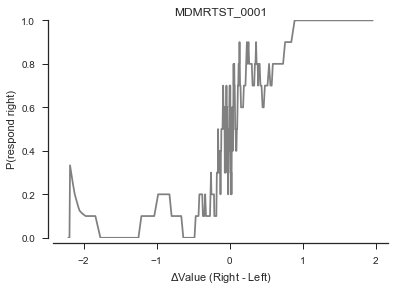

consistency: 0.74
nTrials: 313
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  313
Model:                          Logit   Df Residuals:                      312
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2557
Time:                        16:38:06   Log-Likelihood:                -160.95
converged:                       True   LL-Null:                       -216.25
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.9801      0.462      6.447      0.000       2.074       3.886


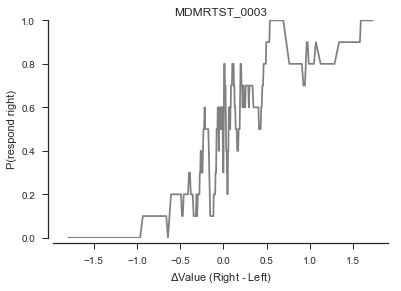

consistency: 0.73
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  320
Model:                          Logit   Df Residuals:                      319
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2555
Time:                        16:38:06   Log-Likelihood:                -165.10
converged:                       True   LL-Null:                       -221.75
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.5854      0.359      7.193      0.000       1.881       3.290


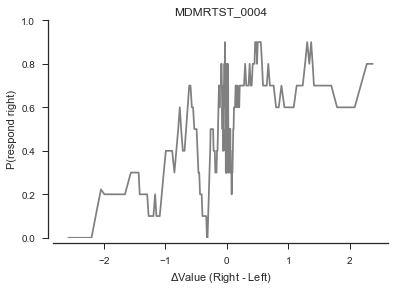

consistency: 0.58
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.05843
Time:                        16:38:07   Log-Likelihood:                -207.94
converged:                       True   LL-Null:                       -220.85
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8643      0.191      4.524      0.000       0.490       1.239


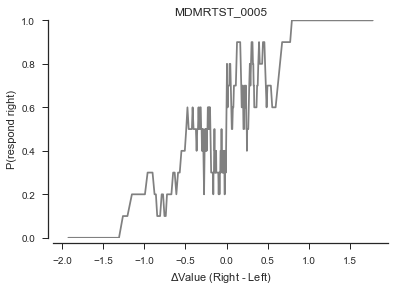

consistency: 0.72
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  320
Model:                          Logit   Df Residuals:                      319
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2191
Time:                        16:38:07   Log-Likelihood:                -173.03
converged:                       True   LL-Null:                       -221.58
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.2560      0.321      7.020      0.000       1.626       2.886


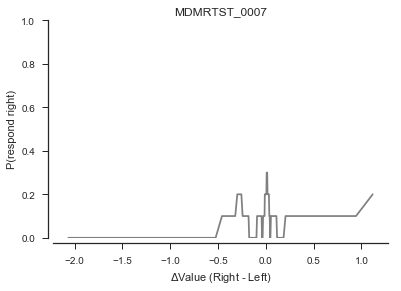

consistency: 0.58
nTrials: 306
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  108
Model:                          Logit   Df Residuals:                      107
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  -1.188
Time:                        16:38:07   Log-Likelihood:                -72.896
converged:                       True   LL-Null:                       -33.318
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6323      0.343      1.844      0.065      -0.040       1.304


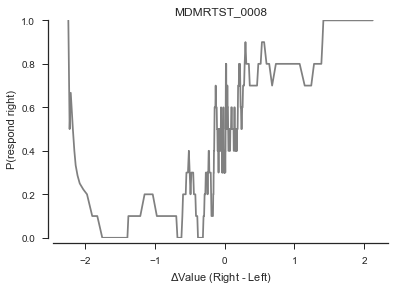

consistency: 0.69
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1515
Time:                        16:38:07   Log-Likelihood:                -186.50
converged:                       True   LL-Null:                       -219.79
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.8031      0.297      6.078      0.000       1.222       2.385


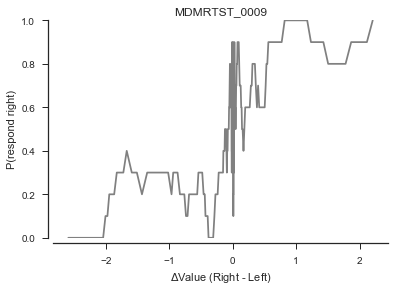

consistency: 0.65
nTrials: 312
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  312
Model:                          Logit   Df Residuals:                      311
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1137
Time:                        16:38:08   Log-Likelihood:                -191.21
converged:                       True   LL-Null:                       -215.74
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.4030      0.264      5.311      0.000       0.885       1.921


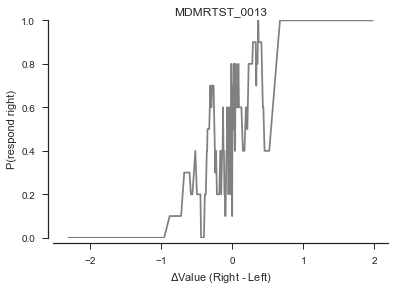

consistency: 0.7
nTrials: 318
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  318
Model:                          Logit   Df Residuals:                      317
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2388
Time:                        16:38:08   Log-Likelihood:                -167.21
converged:                       True   LL-Null:                       -219.66
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          3.1201      0.458      6.811      0.000       2.222       4.018


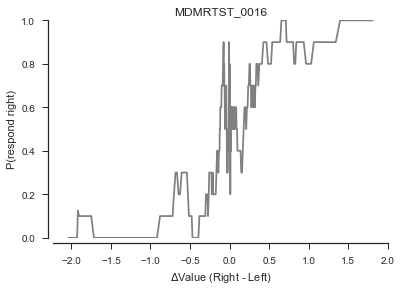

consistency: 0.7
nTrials: 316
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  316
Model:                          Logit   Df Residuals:                      315
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2653
Time:                        16:38:08   Log-Likelihood:                -160.91
converged:                       True   LL-Null:                       -219.03
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.7264      0.395      6.904      0.000       1.952       3.500


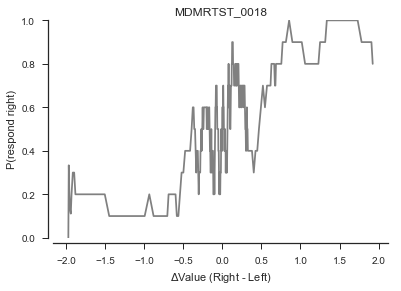

consistency: 0.66
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  320
Model:                          Logit   Df Residuals:                      319
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1049
Time:                        16:38:08   Log-Likelihood:                -198.10
converged:                       True   LL-Null:                       -221.30
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.2897      0.227      5.691      0.000       0.845       1.734


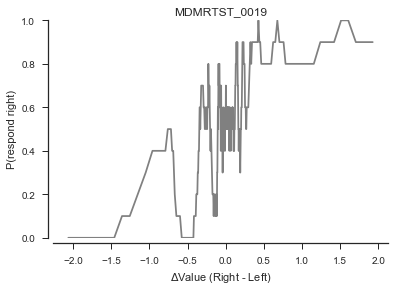

consistency: 0.66
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  320
Model:                          Logit   Df Residuals:                      319
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1630
Time:                        16:38:09   Log-Likelihood:                -185.40
converged:                       True   LL-Null:                       -221.50
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.0378      0.348      5.847      0.000       1.355       2.721


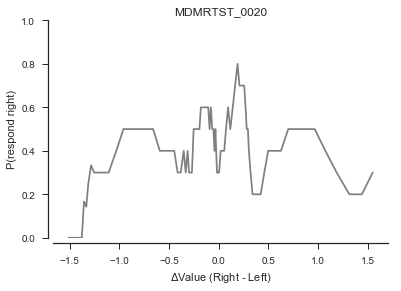

consistency: 0.53
nTrials: 315
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                   89
Model:                          Logit   Df Residuals:                       88
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                -0.01515
Time:                        16:38:09   Log-Likelihood:                -61.657
converged:                       True   LL-Null:                       -60.737
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.0730      0.285      0.256      0.798      -0.485       0.631


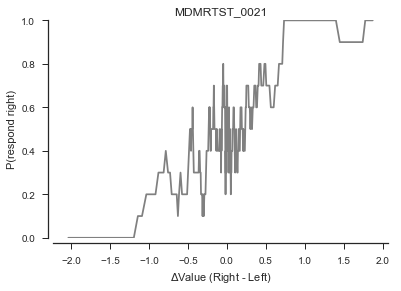

consistency: 0.65
nTrials: 318
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  318
Model:                          Logit   Df Residuals:                      317
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1957
Time:                        16:38:09   Log-Likelihood:                -177.27
converged:                       True   LL-Null:                       -220.40
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.0544      0.303      6.777      0.000       1.460       2.649


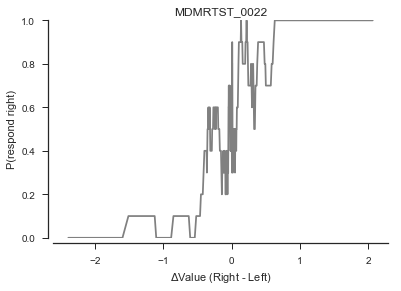

consistency: 0.7
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  320
Model:                          Logit   Df Residuals:                      319
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2415
Time:                        16:38:10   Log-Likelihood:                -167.55
converged:                       True   LL-Null:                       -220.91
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.8850      0.432      6.676      0.000       2.038       3.732


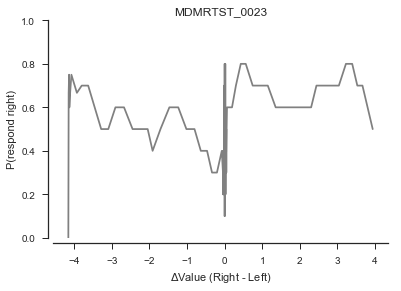

consistency: 0.5
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:               -0.006002
Time:                        16:38:10   Log-Likelihood:                -221.11
converged:                       True   LL-Null:                       -219.79
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta         -0.0038      0.100     -0.038      0.970      -0.199       0.192


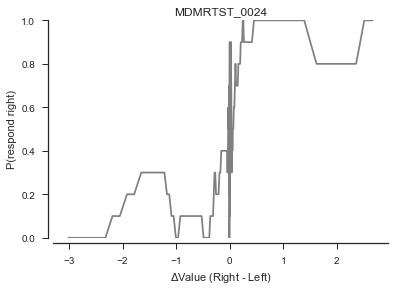

consistency: 0.67
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1463
Time:                        16:38:10   Log-Likelihood:                -188.74
converged:                       True   LL-Null:                       -221.10
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.8686      0.396      4.723      0.000       1.093       2.644


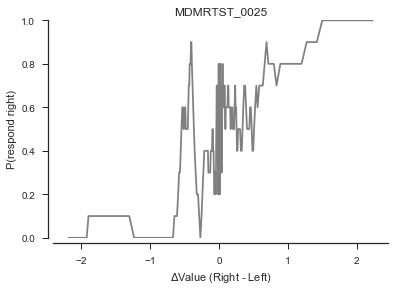

consistency: 0.62
nTrials: 315
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  313
Model:                          Logit   Df Residuals:                      312
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1326
Time:                        16:38:11   Log-Likelihood:                -188.18
converged:                       True   LL-Null:                       -216.94
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.6322      0.290      5.620      0.000       1.063       2.201


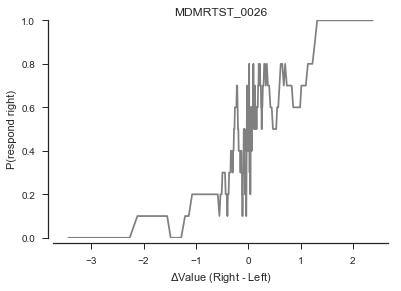

consistency: 0.66
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  320
Model:                          Logit   Df Residuals:                      319
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1487
Time:                        16:38:11   Log-Likelihood:                -188.64
converged:                       True   LL-Null:                       -221.58
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.6689      0.296      5.629      0.000       1.088       2.250


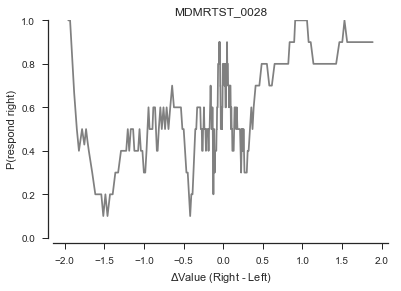

consistency: 0.6
nTrials: 317
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  317
Model:                          Logit   Df Residuals:                      316
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.03460
Time:                        16:38:11   Log-Likelihood:                -206.04
converged:                       True   LL-Null:                       -213.43
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8449      0.175      4.826      0.000       0.502       1.188


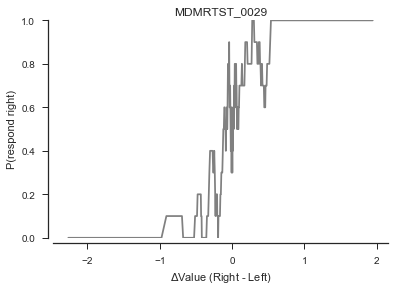

consistency: 0.78
nTrials: 316
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  316
Model:                          Logit   Df Residuals:                      315
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.3994
Time:                        16:38:11   Log-Likelihood:                -130.44
converged:                       True   LL-Null:                       -217.20
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          4.8086      0.632      7.606      0.000       3.569       6.048


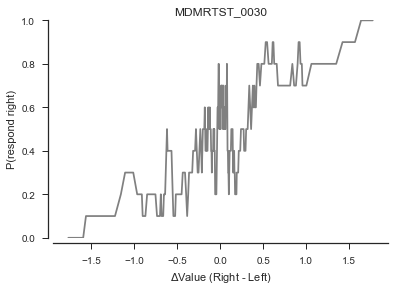

consistency: 0.66
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  320
Model:                          Logit   Df Residuals:                      319
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1706
Time:                        16:38:12   Log-Likelihood:                -183.88
converged:                       True   LL-Null:                       -221.71
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.7705      0.261      6.773      0.000       1.258       2.283


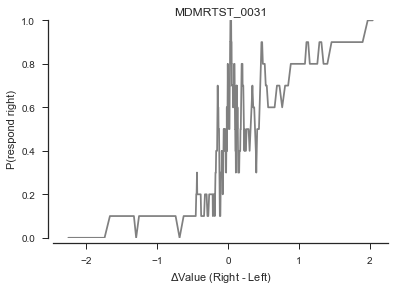

consistency: 0.7
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1603
Time:                        16:38:12   Log-Likelihood:                -185.51
converged:                       True   LL-Null:                       -220.92
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.8756      0.309      6.079      0.000       1.271       2.480


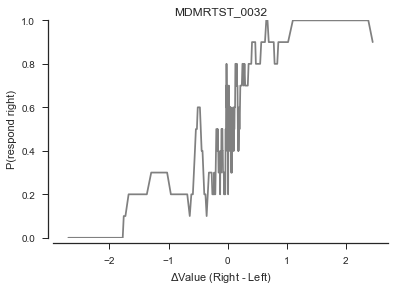

consistency: 0.66
nTrials: 310
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  310
Model:                          Logit   Df Residuals:                      309
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1490
Time:                        16:38:12   Log-Likelihood:                -182.73
converged:                       True   LL-Null:                       -214.71
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.7780      0.318      5.585      0.000       1.154       2.402


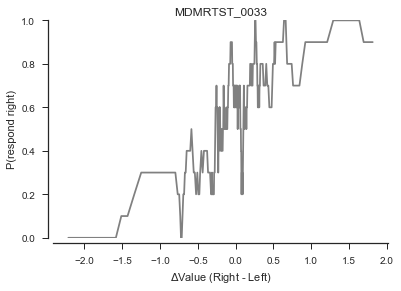

consistency: 0.67
nTrials: 317
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  317
Model:                          Logit   Df Residuals:                      316
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1709
Time:                        16:38:12   Log-Likelihood:                -179.75
converged:                       True   LL-Null:                       -216.80
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.9888      0.308      6.461      0.000       1.386       2.592


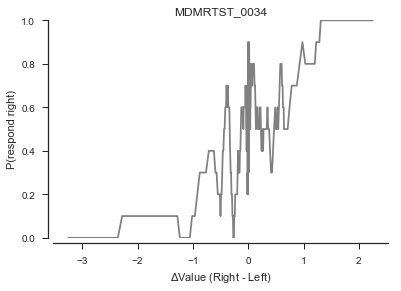

consistency: 0.64
nTrials: 316
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  314
Model:                          Logit   Df Residuals:                      313
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1345
Time:                        16:38:13   Log-Likelihood:                -188.17
converged:                       True   LL-Null:                       -217.42
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.5686      0.272      5.759      0.000       1.035       2.102


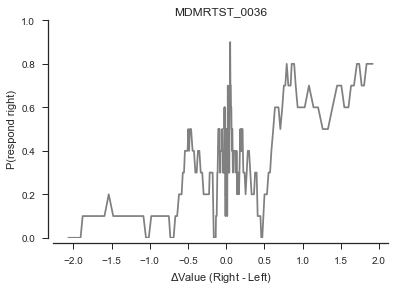

consistency: 0.6
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                0.009247
Time:                        16:38:13   Log-Likelihood:                -206.60
converged:                       True   LL-Null:                       -208.53
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.9047      0.188      4.815      0.000       0.536       1.273


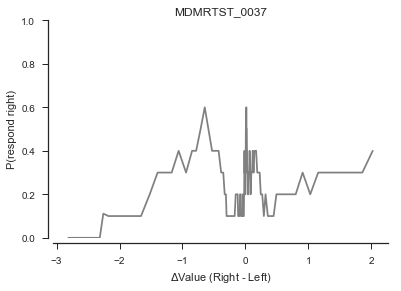

consistency: 0.51
nTrials: 316
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  135
Model:                          Logit   Df Residuals:                      134
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 -0.1993
Time:                        16:38:13   Log-Likelihood:                -92.657
converged:                       True   LL-Null:                       -77.258
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2667      0.201      1.327      0.184      -0.127       0.661


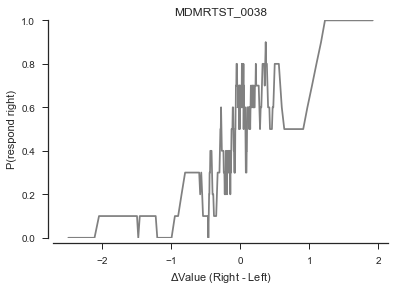

consistency: 0.68
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1764
Time:                        16:38:13   Log-Likelihood:                -181.95
converged:                       True   LL-Null:                       -220.92
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.0142      0.322      6.249      0.000       1.383       2.646


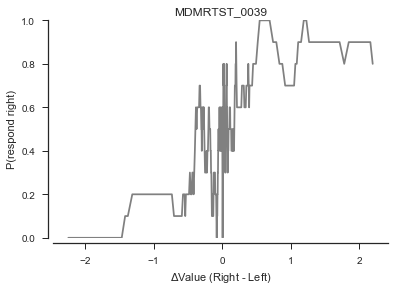

consistency: 0.66
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1239
Time:                        16:38:14   Log-Likelihood:                -193.72
converged:                       True   LL-Null:                       -221.10
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.5082      0.266      5.679      0.000       0.988       2.029


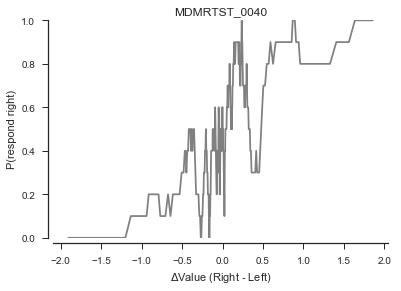

consistency: 0.7
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2018
Time:                        16:38:14   Log-Likelihood:                -176.22
converged:                       True   LL-Null:                       -220.76
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.3544      0.367      6.413      0.000       1.635       3.074


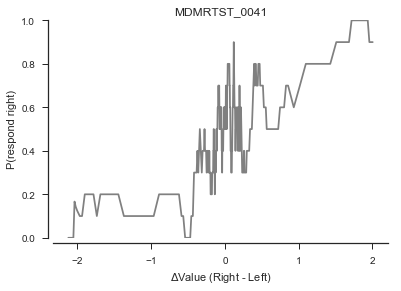

consistency: 0.64
nTrials: 317
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  317
Model:                          Logit   Df Residuals:                      316
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.09423
Time:                        16:38:14   Log-Likelihood:                -198.78
converged:                       True   LL-Null:                       -219.46
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.2384      0.234      5.290      0.000       0.779       1.697


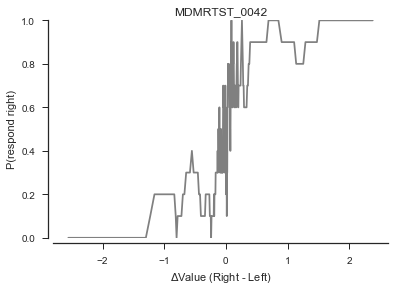

consistency: 0.72
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2374
Time:                        16:38:15   Log-Likelihood:                -168.41
converged:                       True   LL-Null:                       -220.85
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          3.0157      0.483      6.238      0.000       2.068       3.963


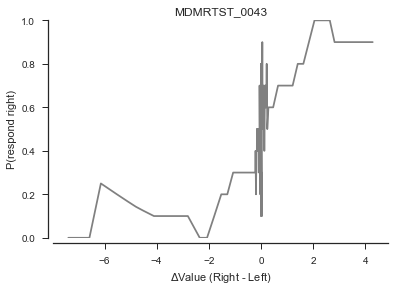

consistency: 0.59
nTrials: 317
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  317
Model:                          Logit   Df Residuals:                      316
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.06101
Time:                        16:38:15   Log-Likelihood:                -206.28
converged:                       True   LL-Null:                       -219.69
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8001      0.230      3.475      0.001       0.349       1.251


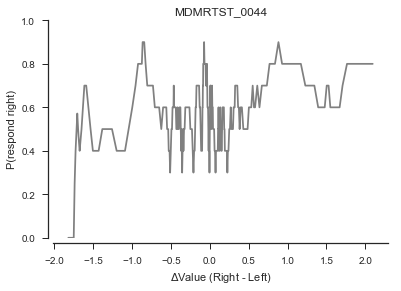

consistency: 0.51
nTrials: 267
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  266
Model:                          Logit   Df Residuals:                      265
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:               -0.009675
Time:                        16:38:15   Log-Likelihood:                -182.80
converged:                       True   LL-Null:                       -181.05
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.2841      0.162      1.753      0.080      -0.034       0.602


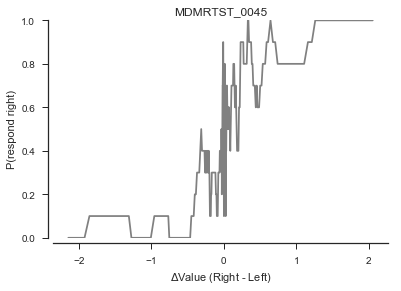

consistency: 0.69
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2513
Time:                        16:38:15   Log-Likelihood:                -165.12
converged:                       True   LL-Null:                       -220.55
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          3.0975      0.481      6.444      0.000       2.155       4.040


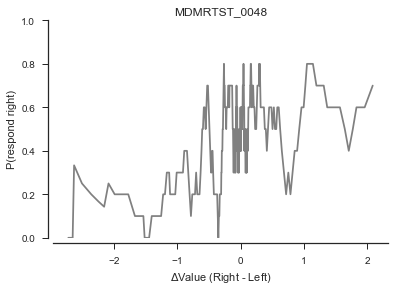

consistency: 0.59
nTrials: 316
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  316
Model:                          Logit   Df Residuals:                      315
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.03945
Time:                        16:38:16   Log-Likelihood:                -209.52
converged:                       True   LL-Null:                       -218.12
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.7096      0.176      4.032      0.000       0.365       1.055


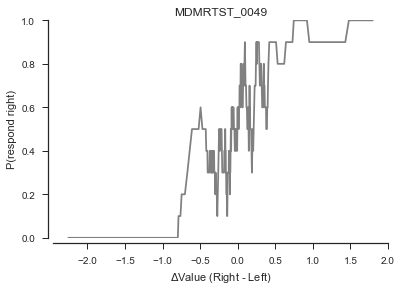

consistency: 0.73
nTrials: 318
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  318
Model:                          Logit   Df Residuals:                      317
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2511
Time:                        16:38:16   Log-Likelihood:                -164.61
converged:                       True   LL-Null:                       -219.79
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.7311      0.389      7.027      0.000       1.969       3.493


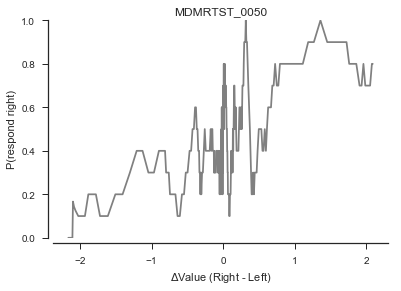

consistency: 0.62
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  320
Model:                          Logit   Df Residuals:                      319
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.06012
Time:                        16:38:16   Log-Likelihood:                -208.38
converged:                       True   LL-Null:                       -221.71
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.9109      0.202      4.520      0.000       0.516       1.306


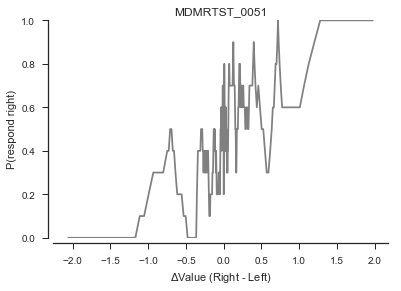

consistency: 0.66
nTrials: 313
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  313
Model:                          Logit   Df Residuals:                      312
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1739
Time:                        16:38:17   Log-Likelihood:                -179.23
converged:                       True   LL-Null:                       -216.95
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.9774      0.322      6.143      0.000       1.347       2.608


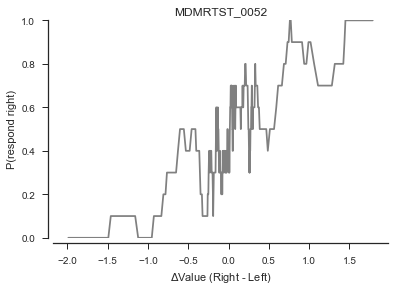

consistency: 0.7
nTrials: 313
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  313
Model:                          Logit   Df Residuals:                      312
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1858
Time:                        16:38:17   Log-Likelihood:                -176.43
converged:                       True   LL-Null:                       -216.69
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.9078      0.283      6.739      0.000       1.353       2.463


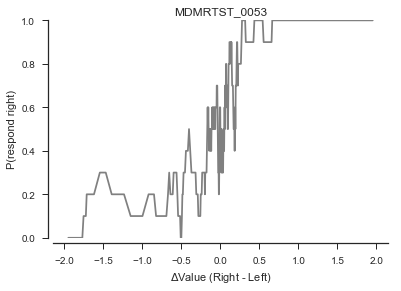

consistency: 0.75
nTrials: 316
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  316
Model:                          Logit   Df Residuals:                      315
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2528
Time:                        16:38:17   Log-Likelihood:                -160.92
converged:                       True   LL-Null:                       -215.37
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          3.0101      0.431      6.979      0.000       2.165       3.855


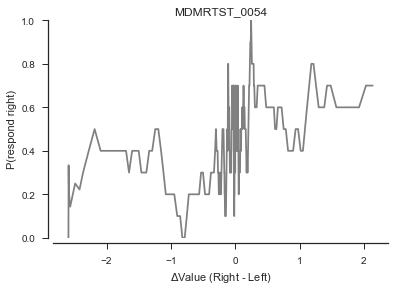

consistency: 0.58
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  305
Model:                          Logit   Df Residuals:                      304
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.02215
Time:                        16:38:18   Log-Likelihood:                -206.02
converged:                       True   LL-Null:                       -210.69
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.5147      0.166      3.099      0.002       0.189       0.840


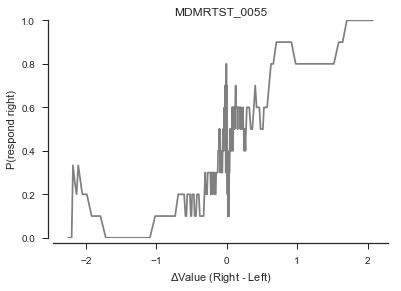

consistency: 0.62
nTrials: 315
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  314
Model:                          Logit   Df Residuals:                      313
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1361
Time:                        16:38:18   Log-Likelihood:                -186.95
converged:                       True   LL-Null:                       -216.40
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.7365      0.315      5.506      0.000       1.118       2.355


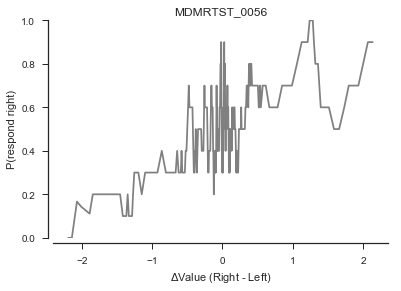

consistency: 0.59
nTrials: 318
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  318
Model:                          Logit   Df Residuals:                      317
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.07008
Time:                        16:38:18   Log-Likelihood:                -204.83
converged:                       True   LL-Null:                       -220.26
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.9753      0.199      4.905      0.000       0.586       1.365


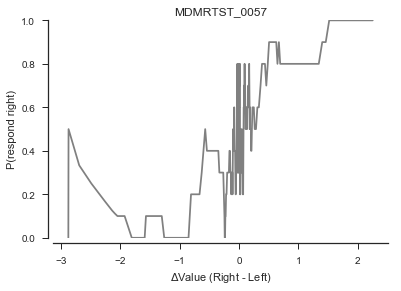

consistency: 0.65
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1651
Time:                        16:38:18   Log-Likelihood:                -183.92
converged:                       True   LL-Null:                       -220.28
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.8823      0.311      6.060      0.000       1.274       2.491


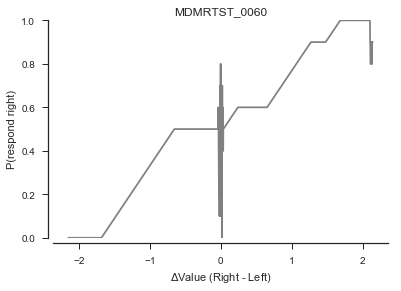

consistency: 0.58
nTrials: 318
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  318
Model:                          Logit   Df Residuals:                      317
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1285
Time:                        16:38:19   Log-Likelihood:                -190.68
converged:                       True   LL-Null:                       -218.81
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.3932      0.280      4.970      0.000       0.844       1.943


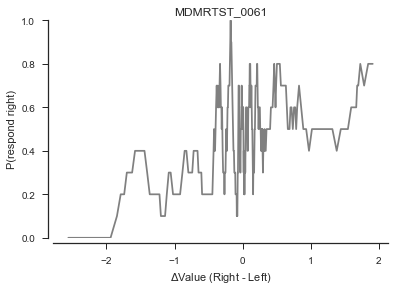

consistency: 0.57
nTrials: 318
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  316
Model:                          Logit   Df Residuals:                      315
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.03846
Time:                        16:38:19   Log-Likelihood:                -210.12
converged:                       True   LL-Null:                       -218.52
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6876      0.174      3.950      0.000       0.346       1.029


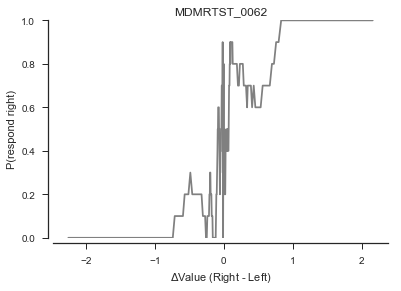

consistency: 0.66
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  320
Model:                          Logit   Df Residuals:                      319
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2468
Time:                        16:38:19   Log-Likelihood:                -166.13
converged:                       True   LL-Null:                       -220.58
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          4.0439      0.733      5.519      0.000       2.608       5.480


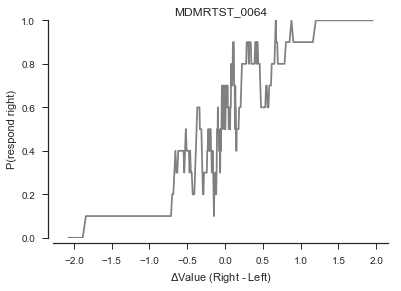

consistency: 0.71
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2027
Time:                        16:38:20   Log-Likelihood:                -173.75
converged:                       True   LL-Null:                       -217.93
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.1538      0.307      7.015      0.000       1.552       2.756


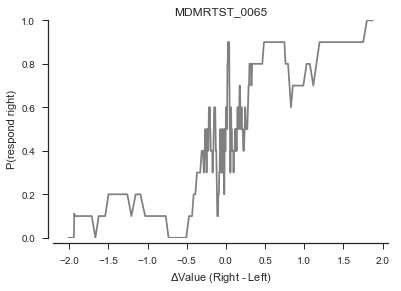

consistency: 0.7
nTrials: 313
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  313
Model:                          Logit   Df Residuals:                      312
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1684
Time:                        16:38:20   Log-Likelihood:                -180.41
converged:                       True   LL-Null:                       -216.95
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.8030      0.287      6.285      0.000       1.241       2.365


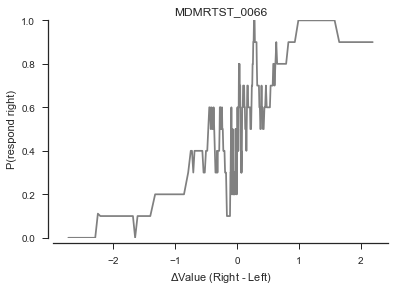

consistency: 0.69
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  320
Model:                          Logit   Df Residuals:                      319
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1390
Time:                        16:38:20   Log-Likelihood:                -190.94
converged:                       True   LL-Null:                       -221.75
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.6285      0.280      5.826      0.000       1.081       2.176


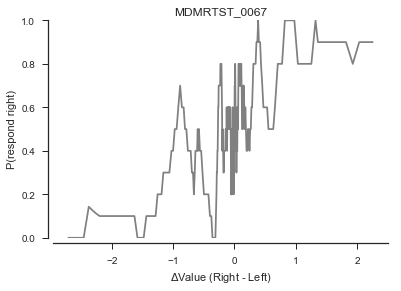

consistency: 0.66
nTrials: 315
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  315
Model:                          Logit   Df Residuals:                      314
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1017
Time:                        16:38:20   Log-Likelihood:                -195.39
converged:                       True   LL-Null:                       -217.50
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.2104      0.218      5.549      0.000       0.783       1.638


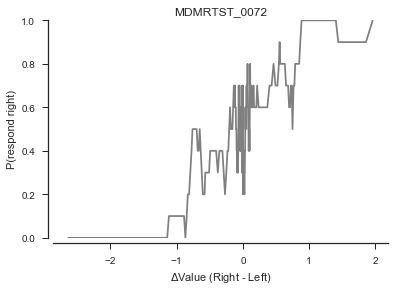

consistency: 0.66
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1961
Time:                        16:38:21   Log-Likelihood:                -177.70
converged:                       True   LL-Null:                       -221.04
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.9282      0.287      6.711      0.000       1.365       2.491


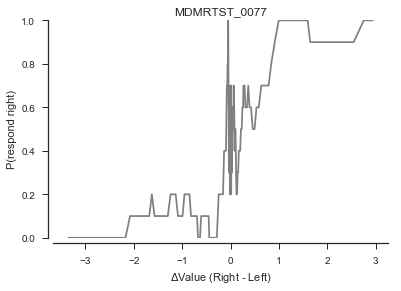

consistency: 0.64
nTrials: 317
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  317
Model:                          Logit   Df Residuals:                      316
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1614
Time:                        16:38:21   Log-Likelihood:                -182.98
converged:                       True   LL-Null:                       -218.21
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.9001      0.351      5.410      0.000       1.212       2.588


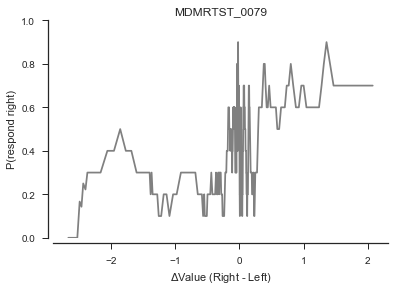

consistency: 0.54
nTrials: 316
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  316
Model:                          Logit   Df Residuals:                      315
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.02186
Time:                        16:38:21   Log-Likelihood:                -210.04
converged:                       True   LL-Null:                       -214.74
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.6995      0.181      3.861      0.000       0.344       1.055


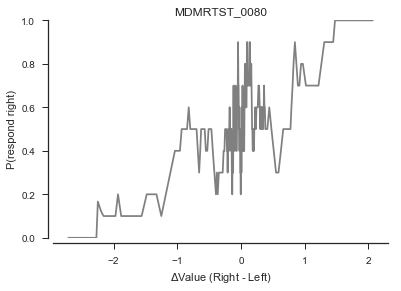

consistency: 0.62
nTrials: 312
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  312
Model:                          Logit   Df Residuals:                      311
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.08877
Time:                        16:38:21   Log-Likelihood:                -196.36
converged:                       True   LL-Null:                       -215.49
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.1130      0.211      5.268      0.000       0.699       1.527


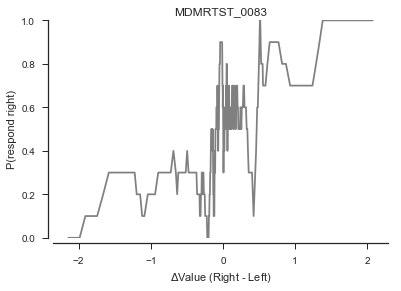

consistency: 0.65
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1371
Time:                        16:38:22   Log-Likelihood:                -190.76
converged:                       True   LL-Null:                       -221.07
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.6312      0.276      5.903      0.000       1.090       2.173


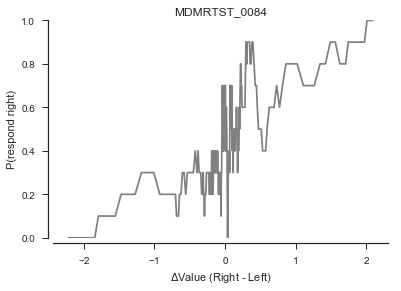

consistency: 0.64
nTrials: 318
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  317
Model:                          Logit   Df Residuals:                      316
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1215
Time:                        16:38:22   Log-Likelihood:                -192.16
converged:                       True   LL-Null:                       -218.74
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.5757      0.289      5.460      0.000       1.010       2.141


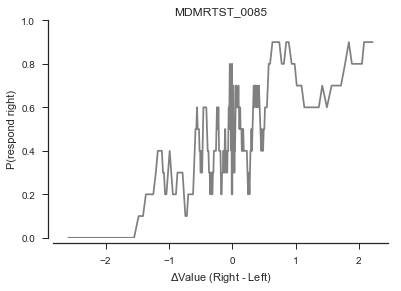

consistency: 0.59
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.07705
Time:                        16:38:22   Log-Likelihood:                -203.44
converged:                       True   LL-Null:                       -220.42
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.0395      0.204      5.096      0.000       0.640       1.439


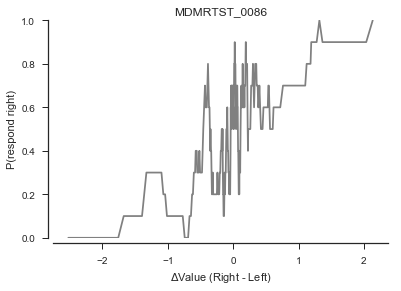

consistency: 0.67
nTrials: 311
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  311
Model:                          Logit   Df Residuals:                      310
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1286
Time:                        16:38:23   Log-Likelihood:                -187.84
converged:                       True   LL-Null:                       -215.55
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.4204      0.235      6.049      0.000       0.960       1.881


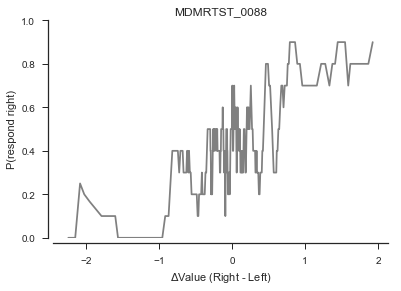

consistency: 0.63
nTrials: 318
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  318
Model:                          Logit   Df Residuals:                      317
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.09339
Time:                        16:38:23   Log-Likelihood:                -197.07
converged:                       True   LL-Null:                       -217.37
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.2205      0.209      5.833      0.000       0.810       1.631


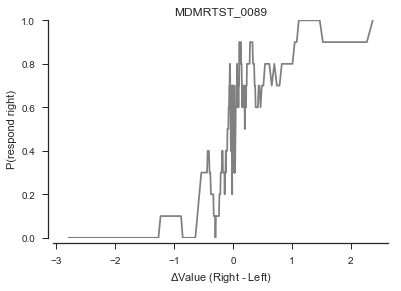

consistency: 0.71
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  320
Model:                          Logit   Df Residuals:                      319
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2329
Time:                        16:38:23   Log-Likelihood:                -170.07
converged:                       True   LL-Null:                       -221.71
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.6881      0.428      6.277      0.000       1.849       3.528


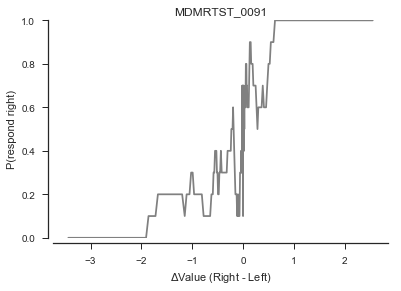

consistency: 0.68
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  320
Model:                          Logit   Df Residuals:                      319
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1808
Time:                        16:38:23   Log-Likelihood:                -181.69
converged:                       True   LL-Null:                       -221.81
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.1165      0.366      5.790      0.000       1.400       2.833


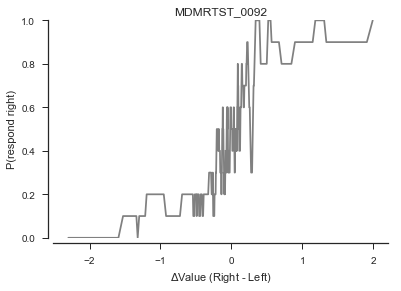

consistency: 0.72
nTrials: 316
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  316
Model:                          Logit   Df Residuals:                      315
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2300
Time:                        16:38:24   Log-Likelihood:                -167.96
converged:                       True   LL-Null:                       -218.12
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.4613      0.356      6.905      0.000       1.763       3.160


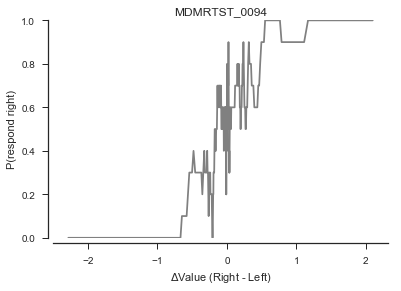

consistency: 0.7
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2373
Time:                        16:38:24   Log-Likelihood:                -168.37
converged:                       True   LL-Null:                       -220.76
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          3.2922      0.536      6.142      0.000       2.242       4.343


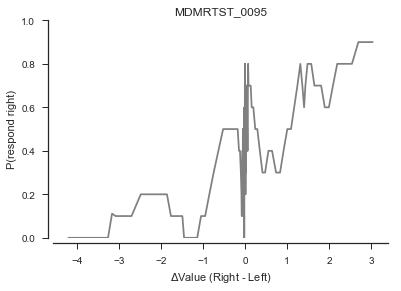

consistency: 0.61
nTrials: 306
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  306
Model:                          Logit   Df Residuals:                      305
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.06832
Time:                        16:38:24   Log-Likelihood:                -196.05
converged:                       True   LL-Null:                       -210.43
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8812      0.200      4.409      0.000       0.489       1.273


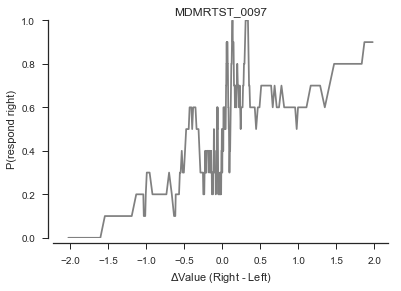

consistency: 0.7
nTrials: 317
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  317
Model:                          Logit   Df Residuals:                      316
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1210
Time:                        16:38:24   Log-Likelihood:                -192.97
converged:                       True   LL-Null:                       -219.54
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.4186      0.240      5.911      0.000       0.948       1.889


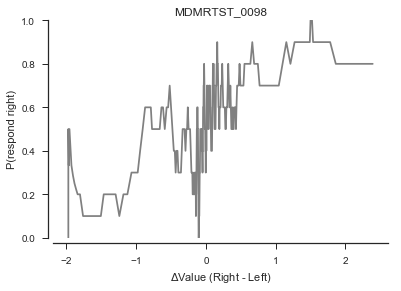

consistency: 0.64
nTrials: 318
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  298
Model:                          Logit   Df Residuals:                      297
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.08083
Time:                        16:38:25   Log-Likelihood:                -188.97
converged:                       True   LL-Null:                       -205.59
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.0279      0.203      5.074      0.000       0.631       1.425


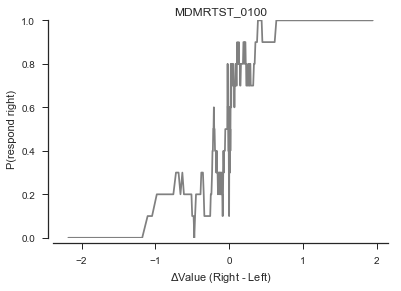

consistency: 0.77
nTrials: 296
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  296
Model:                          Logit   Df Residuals:                      295
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.3179
Time:                        16:38:25   Log-Likelihood:                -139.71
converged:                       True   LL-Null:                       -204.84
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          4.2300      0.648      6.532      0.000       2.961       5.499


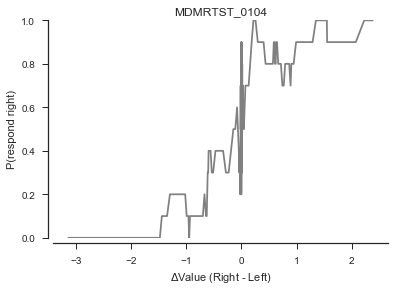

consistency: 0.67
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1983
Time:                        16:38:25   Log-Likelihood:                -177.24
converged:                       True   LL-Null:                       -221.07
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.0723      0.334      6.212      0.000       1.418       2.726


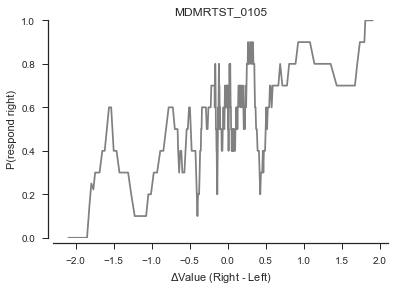

consistency: 0.59
nTrials: 303
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  303
Model:                          Logit   Df Residuals:                      302
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.04610
Time:                        16:38:25   Log-Likelihood:                -197.42
converged:                       True   LL-Null:                       -206.96
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8691      0.191      4.562      0.000       0.496       1.243


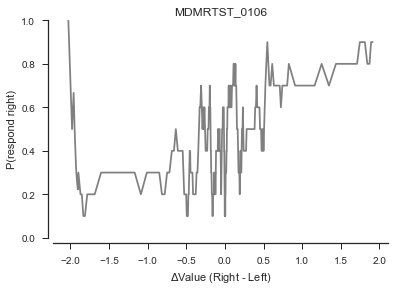

consistency: 0.6
nTrials: 293
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  284
Model:                          Logit   Df Residuals:                      283
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.05303
Time:                        16:38:26   Log-Likelihood:                -185.61
converged:                       True   LL-Null:                       -196.00
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8646      0.202      4.272      0.000       0.468       1.261


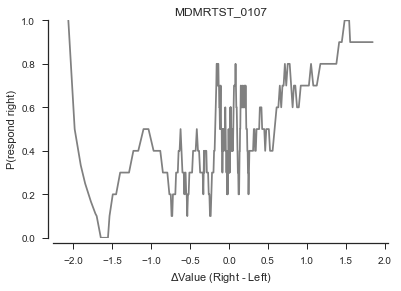

consistency: 0.62
nTrials: 302
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  302
Model:                          Logit   Df Residuals:                      301
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.08353
Time:                        16:38:26   Log-Likelihood:                -191.63
converged:                       True   LL-Null:                       -209.09
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.0989      0.210      5.245      0.000       0.688       1.510


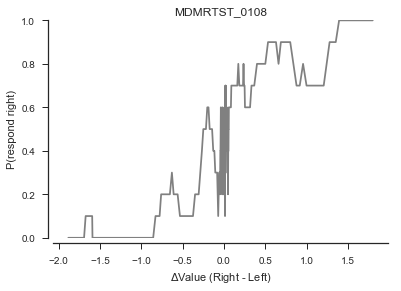

consistency: 0.68
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2246
Time:                        16:38:26   Log-Likelihood:                -168.99
converged:                       True   LL-Null:                       -217.93
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.3789      0.366      6.505      0.000       1.662       3.096


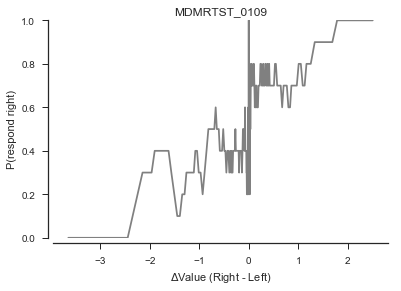

consistency: 0.63
nTrials: 316
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  316
Model:                          Logit   Df Residuals:                      315
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.08247
Time:                        16:38:27   Log-Likelihood:                -200.76
converged:                       True   LL-Null:                       -218.81
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.0219      0.208      4.911      0.000       0.614       1.430


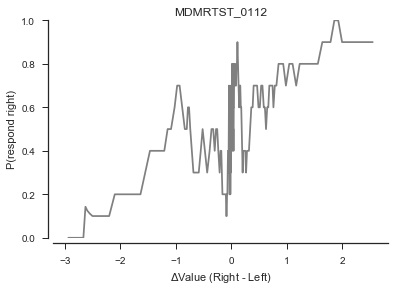

consistency: 0.63
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.06776
Time:                        16:38:27   Log-Likelihood:                -205.95
converged:                       True   LL-Null:                       -220.92
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8861      0.193      4.601      0.000       0.509       1.264


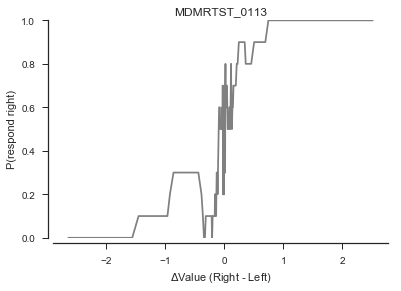

consistency: 0.68
nTrials: 313
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  313
Model:                          Logit   Df Residuals:                      312
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2136
Time:                        16:38:27   Log-Likelihood:                -170.32
converged:                       True   LL-Null:                       -216.60
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          3.6735      0.792      4.641      0.000       2.122       5.225


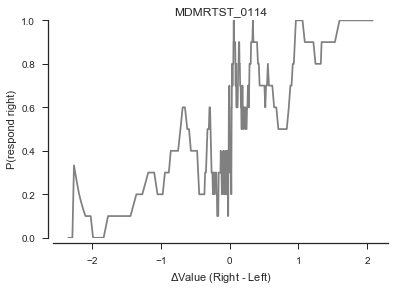

consistency: 0.7
nTrials: 318
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  318
Model:                          Logit   Df Residuals:                      317
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1349
Time:                        16:38:27   Log-Likelihood:                -190.34
converged:                       True   LL-Null:                       -220.02
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.5488      0.260      5.958      0.000       1.039       2.058


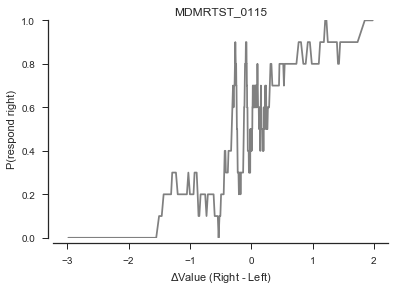

consistency: 0.67
nTrials: 319
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  319
Model:                          Logit   Df Residuals:                      318
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1590
Time:                        16:38:28   Log-Likelihood:                -185.57
converged:                       True   LL-Null:                       -220.66
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.6144      0.243      6.644      0.000       1.138       2.091


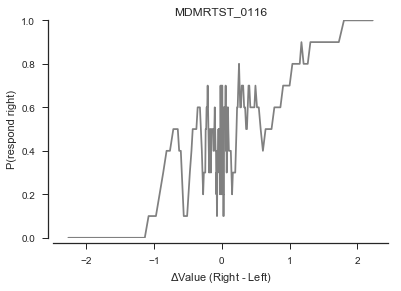

consistency: 0.6
nTrials: 318
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  318
Model:                          Logit   Df Residuals:                      317
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1204
Time:                        16:38:28   Log-Likelihood:                -192.79
converged:                       True   LL-Null:                       -219.19
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.5591      0.283      5.514      0.000       1.005       2.113


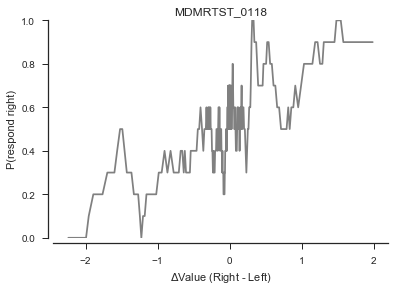

consistency: 0.63
nTrials: 315
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  315
Model:                          Logit   Df Residuals:                      314
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.08932
Time:                        16:38:28   Log-Likelihood:                -197.78
converged:                       True   LL-Null:                       -217.18
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.1259      0.205      5.483      0.000       0.723       1.528


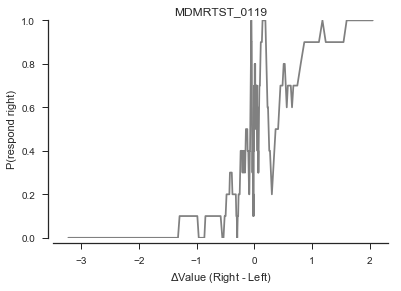

consistency: 0.71
nTrials: 314
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  314
Model:                          Logit   Df Residuals:                      313
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.2151
Time:                        16:38:28   Log-Likelihood:                -170.33
converged:                       True   LL-Null:                       -217.01
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          2.4898      0.406      6.138      0.000       1.695       3.285


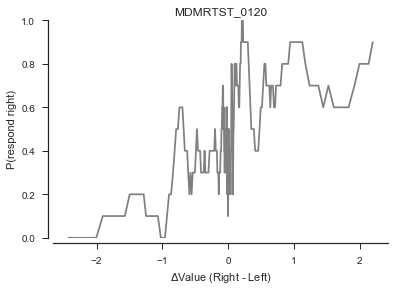

consistency: 0.64
nTrials: 314
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  314
Model:                          Logit   Df Residuals:                      313
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.09757
Time:                        16:38:29   Log-Likelihood:                -196.04
converged:                       True   LL-Null:                       -217.24
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.2299      0.231      5.318      0.000       0.777       1.683


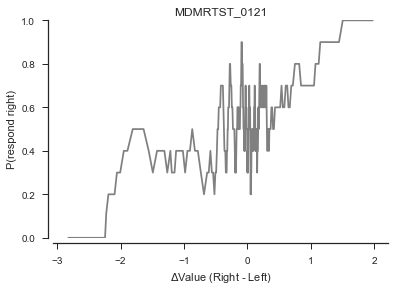

consistency: 0.56
nTrials: 309
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  308
Model:                          Logit   Df Residuals:                      307
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.05127
Time:                        16:38:29   Log-Likelihood:                -201.65
converged:                       True   LL-Null:                       -212.55
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.8201      0.187      4.386      0.000       0.454       1.187


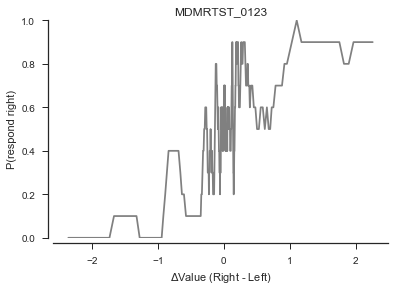

consistency: 0.68
nTrials: 318
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  318
Model:                          Logit   Df Residuals:                      317
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                  0.1448
Time:                        16:38:29   Log-Likelihood:                -188.49
converged:                       True   LL-Null:                       -220.42
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          1.6987      0.292      5.808      0.000       1.125       2.272


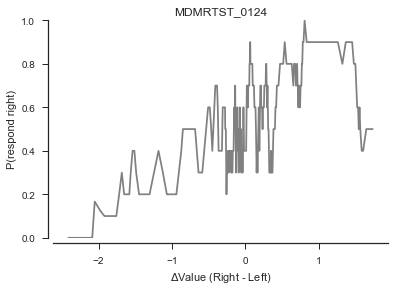

consistency: 0.62
nTrials: 320
                           Logit Regression Results                           
Dep. Variable:                 PRight   No. Observations:                  320
Model:                          Logit   Df Residuals:                      319
Method:                           MLE   Df Model:                            0
Date:                Thu, 02 Aug 2018   Pseudo R-squ.:                 0.05044
Time:                        16:38:29   Log-Likelihood:                -210.24
converged:                       True   LL-Null:                       -221.41
                                        LLR p-value:                       nan
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
delta          0.7876      0.177      4.446      0.000       0.440       1.135
Of 86 subjects, 81 subjects had significant p values for the logistic regression.


,p value,subjectId
0,1.140452e-10,MDMRTST_0001
1,6.316198e-13,MDMRTST_0003
2,6.068298e-06,MDMRTST_0004
3,2.219142e-12,MDMRTST_0005
5,1.214462e-09,MDMRTST_0008
6,1.087532e-07,MDMRTST_0009
7,9.686065e-12,MDMRTST_0013
8,5.071352e-12,MDMRTST_0016
9,1.266147e-08,MDMRTST_0018
10,4.995187e-09,MDMRTST_0019


In [82]:
get_p_logistic_plots(zscoreRatings=True, printFigs=True)

In [26]:
def convert_str_list_to_list(string):
    return ast.literal_eval(string)

In [21]:
def get_trials_scene_out_of_focus(trialEventsDict, ISIs): # key is trial, value is list of events
    trialsOutOfFocus = []
    for trial in trialEventsDict:
        events=trialEventsDict[trial]
        if events[0]['event'] == 'sceneDisplay' and events[0]['details'] == 'out of focus':
            ISI = ISIs[trial]
            if ISI == 0:
                if events[1]['event'] == 'choiceDisplay' or (events[1]['event'] == 'sceneDisplay' and events[1]['details'] == 'hidden' and events[1]['event'] == 'choiceDisplay'):
                    trialsOutOfFocus.append(trial)
            elif ISI == 2.5:
                 if events[1]['event'] == 'ISIDisplay' or (events[1]['event'] == 'sceneDisplay' and events[1]['details'] == 'hidden' and events[1]['event'] == 'ISIDisplay'):
                    trialsOutOfFocus.append(trial)
    return trialsOutOfFocus

In [22]:
def getfoodsubdf(subjectId, zscoreRatings, removeTrialsWithoutScene):
    subjectFolder = _dataDir + subjectId + '/'

    auctionFile = subjectFolder + subjectId + auctionFileEnd
    choiceFile = subjectFolder + subjectId + choiceFileEnd

    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        
        rightStimRatings = df["stimulus2Bid"]
        leftStimRatings = df["stimulus1Bid"]
        
        if zscoreRatings:
            mean, std = get_ratings_mean_and_std(subjectId)
            df["stimulus2Bid"] = (rightStimRatings - mean) / std
            df["stimulus1Bid"] = (leftStimRatings - mean) / std
            df["delta"] = df["stimulus2Bid"] - df["stimulus1Bid"]

        df = df.loc[(df["receivedResponse"] == True) & (df["rt"] > 300)]
        #df = df.loc[(df["trialEvents"] == '[]')]
        
        choices = df['selected'] == df['stimulus2']
        
        if removeTrialsWithoutScene:
            trialEventsDF = pd.DataFrame()
            trialEventsDF['trialN'] = df['trialN']
            trialEventsDF['trialEvents'] = df['trialEvents']
            trialEventsDF['ISI'] = df['ISI']
            trialEventsDF.set_index('trialN',inplace=True,drop=True)
            trialEventsDF = trialEventsDF.loc[trialEventsDF['trialEvents'] != '[]']
            trialEventsDF['trialEvents']=trialEventsDF['trialEvents'].apply(convert_str_list_to_list)

            trialsToExclude = get_trials_scene_out_of_focus(trialEventsDF.to_dict()['trialEvents'],trialEventsDF.to_dict()['ISI'])
            df.drop(trialsToExclude,axis=0,inplace=True)
        
        subdf = df[['subjectId','delta','stimulus1','stimulus2','stimulus1Bid','stimulus2Bid','rt','sceneStimulusStatus','ISI']]
        subdf.columns = ['subjid','deltaval','ImageLeft','ImageRight','bidLeft','bidRight','RT','sceneStimulusStatus','ISI']
        subdf['bidLeft'] = subdf['bidLeft'].round(3)
        subdf['bidRight'] = subdf['bidRight'].round(3)
        subdf['deltaval'] = subdf['deltaval'].round(3)
        subdf.loc[:,'choseright'] = choices
        
        return subdf

In [72]:
def getfoodcsv(zscoreRatings,removeTrialsWithoutScene):
    df_sig_pval = get_p_logistic_plots(zscoreRatings=False, printFigs=False)
    subjects = df_sig_pval['subjectId'].values
    outputDir = _thisDir + '/output/'
    food = pd.DataFrame()
    for i in range(0,len(subjects)):
        subject = subjects[i]
        df = getfoodsubdf(subject, zscoreRatings,removeTrialsWithoutScene)
        food = pd.concat([food, df])
    food.reset_index(inplace=True, drop=True)
    
    shortISI_food=food.loc[food['ISI']==0]
    shortISI_food.reset_index(inplace=True, drop=True)
    longISI_food=food.loc[food['ISI']==2.5]
    longISI_food.reset_index(inplace=True, drop=True)
    
    if not os.path.exists(_thisDir + '/output'):
        os.mkdir(_thisDir + '/output/')
        
    if removeTrialsWithoutScene:
        tag='_withoutscene'
    else:
        tag=''
    if zscoreRatings:
        food.to_csv(_thisDir + '/output/food_zscoredratings'+tag+'.csv')
        shortISI_food.to_csv(_thisDir + '/output/shortISI_food_zscoredratings'+tag+'.csv')
        longISI_food.to_csv(_thisDir + '/output/longISI_food_zscoredratings'+tag+'.csv')
    else:
        food.to_csv(_thisDir + '/output/food'+tag+'.csv')
        shortISI_food.to_csv(_thisDir + '/output/shortISI_food'+tag+'.csv')
        longISI_food.to_csv(_thisDir + '/output/longISI_food'+tag+'.csv')


In [73]:
getfoodcsv(True,False)

total number of people who accepted the HIT 124
85 subjects completed the auction and choice tasks.
Of 85 subjects, 80 subjects had significant p values for the logistic regression.


/Users/alicexue/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:38: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/alicexue/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/alicexue/anaconda2/lib/python2.7/site-packages/ipykernel_launcher.py:40: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas

In [28]:
full_df = pd.read_csv('./output/food_zscoredratings.csv')

In [29]:
full_df.columns

Index([u'Unnamed: 0', u'subjid', u'deltaval', u'ImageLeft', u'ImageRight',
       u'bidLeft', u'bidRight', u'RT', u'sceneStimulusStatus', u'ISI',
       u'choseright'],
      dtype='object')

In [30]:
all_subs=np.unique(full_df['subjid'])
def plot_two_by_two(sub):
    plt.rcParams['figure.dpi'] = 90
    sub_data=full_df.loc[full_df['subjid']==sub]
    fig, axs=plt.subplots(2,2, sharey=True, sharex=True)
    axs[0,0].hist(sub_data.loc[(sub_data['sceneStimulusStatus']=='familiar') & (sub_data['ISI']==0)]['deltaval'],bins=15)
    axs[0,0].set_title('familiar, short ISI')
    axs[0,1].hist(sub_data.loc[(sub_data['sceneStimulusStatus']=='familiar') & (sub_data['ISI']==2.5)]['deltaval'],bins=15)
    axs[0,1].set_title('familiar, long ISI')
    axs[1,0].hist(sub_data.loc[(sub_data['sceneStimulusStatus']=='novel') & (sub_data['ISI']==0)]['deltaval'],bins=15)
    axs[1,0].set_title('novel, short ISI')
    axs[1,1].hist(sub_data.loc[(sub_data['sceneStimulusStatus']=='novel') & (sub_data['ISI']==2.5)]['deltaval'],bins=15)
    axs[1,1].set_title('novel, long ISI')
    axs[1,0].set_ylabel('n trials')
    axs[1,0].set_xlabel('deltaval')
    plt.suptitle('All trials for '+sub)
    plt.show()

#for sub in all_subs:
#    plot_two_by_two(sub)

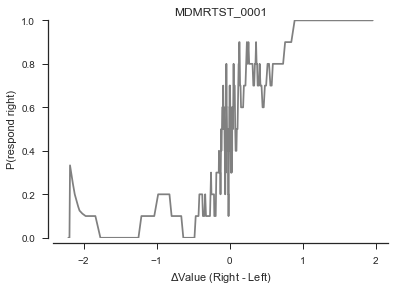

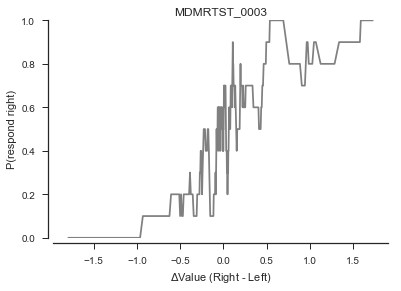

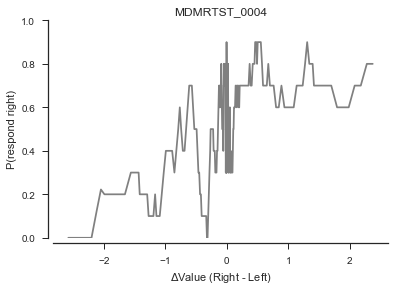

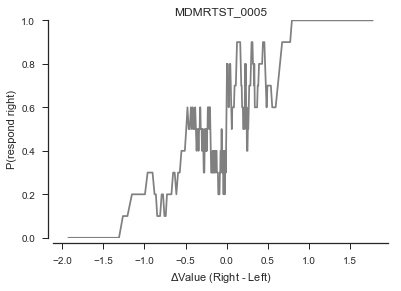

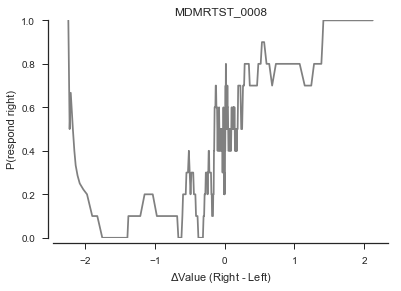

...

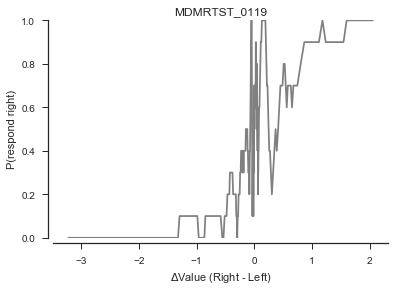

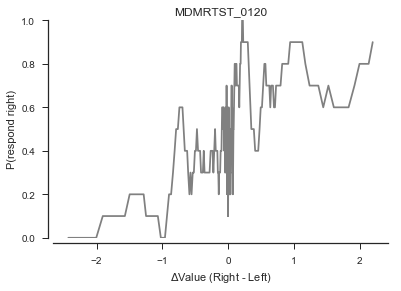

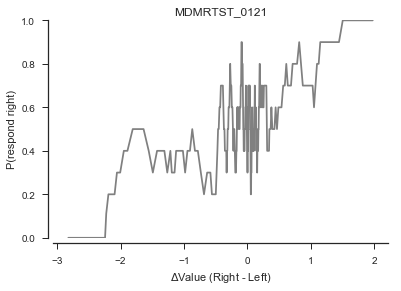

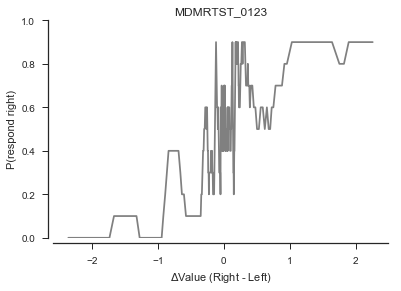

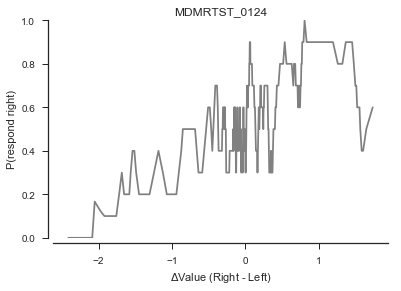

In [31]:
for sub in all_subs:
    df = full_df.loc[full_df['subjid'] == sub]
    df = df[['deltaval','choseright']]
    df = df.sort_values('deltaval',axis=0, ascending = True) 
    df = df.reset_index(drop=True)
    y = df.rolling(window=10,min_periods=1).mean()

    plt.plot(y['deltaval'],y['choseright'],color='grey')
    axes = plt.gca()
    axes.set_title(sub)
    axes.set_xlabel(r'$\Delta$Value (Right - Left)')
    axes.set_ylabel('P(respond right)')
    #axes.set_xlim(-10,10)
    axes.set_ylim(0,1)

    sns.set_style("whitegrid")
    sns.set(style="ticks")
    sns.despine(offset=5)
    plt.show()


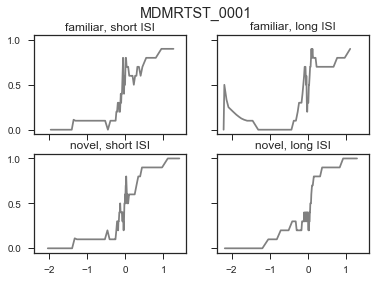

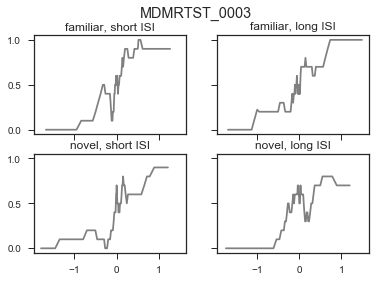

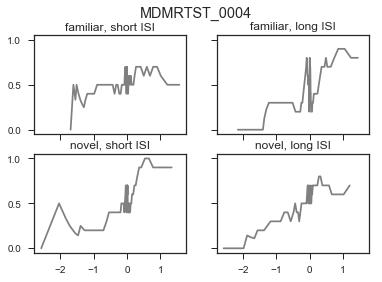

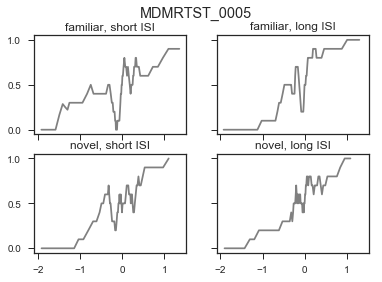

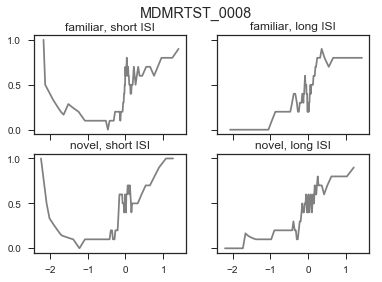

...

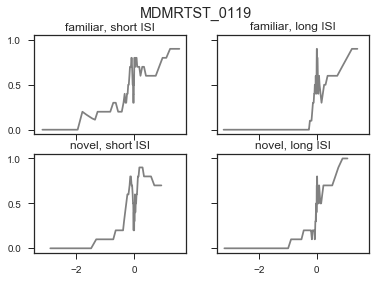

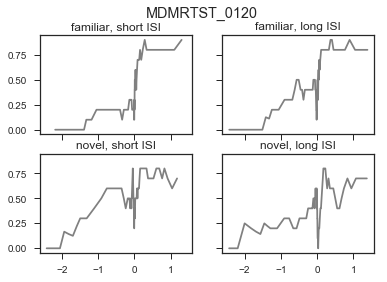

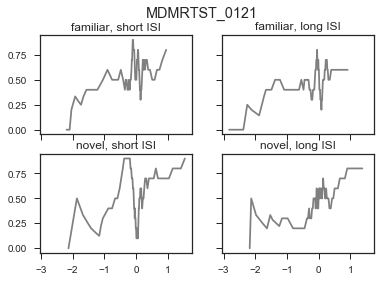

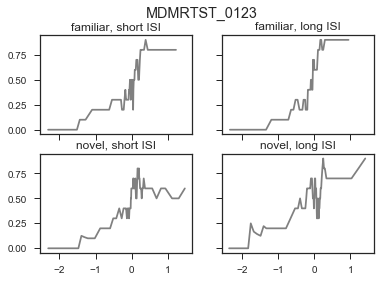

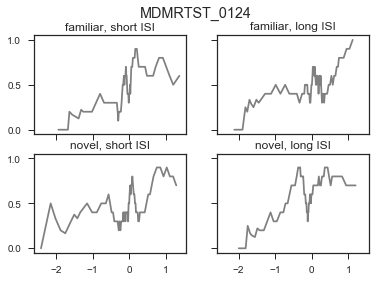

In [87]:
def plot_choice_logistic_two_by_two(sub):
    full_df = pd.read_csv('./output/food_zscoredratings.csv')
    sub_data=full_df.loc[full_df['subjid'] == sub]
    
    fig, axs=plt.subplots(2,2, sharey=True, sharex=True)
    df=sub_data.loc[(sub_data['sceneStimulusStatus']=='familiar') & (sub_data['ISI']==0)]
    df = df[['deltaval','choseright']]
    df = df.sort_values('deltaval',axis=0, ascending = True) 
    df = df.reset_index(drop=True)
    y = df.rolling(window=10,min_periods=1).mean()
    axs[0,0].plot(y['deltaval'],y['choseright'],color='grey')
    axs[0,0].set_title('familiar, short ISI')
    
    df=sub_data.loc[(sub_data['sceneStimulusStatus']=='familiar') & (sub_data['ISI']==2.5)]
    df = df[['deltaval','choseright']]
    df = df.sort_values('deltaval',axis=0, ascending = True) 
    df = df.reset_index(drop=True)
    y = df.rolling(window=10,min_periods=1).mean()
    axs[0,1].plot(y['deltaval'],y['choseright'],color='grey')
    axs[0,1].set_title('familiar, long ISI')
    
    df=sub_data.loc[(sub_data['sceneStimulusStatus']=='novel') & (sub_data['ISI']==0)]
    df = df[['deltaval','choseright']]
    df = df.sort_values('deltaval',axis=0, ascending = True) 
    df = df.reset_index(drop=True)
    y = df.rolling(window=10,min_periods=1).mean()
    axs[1,0].plot(y['deltaval'],y['choseright'],color='grey')
    axs[1,0].set_title('novel, short ISI')
    
    df=sub_data.loc[(sub_data['sceneStimulusStatus']=='novel') & (sub_data['ISI']==2.5)]
    df = df[['deltaval','choseright']]
    df = df.sort_values('deltaval',axis=0, ascending = True) 
    df = df.reset_index(drop=True)
    y = df.rolling(window=10,min_periods=1).mean()
    axs[1,1].plot(y['deltaval'],y['choseright'],color='grey')
    axs[1,1].set_title('novel, long ISI')
    
    axs[1,0].set_ylabel('P(respond right)')
    axs[1,0].set_xlabel('deltaval')
    
    plt.suptitle(sub)
    plt.show()

full_df = pd.read_csv('./output/food_zscoredratings.csv')
subjects = np.unique(full_df['subjid'])
for sub in subjects:
    plot_choice_logistic_two_by_two(sub)

In [34]:
def get_subject_rt(subjectId, zscoreRatings, printFigs):
    subjectFolder = _dataDir + subjectId + '/'
    choiceFile = subjectFolder + subjectId + choiceFileEnd
    if os.path.exists(choiceFile):
        df = pd.read_csv(choiceFile)
        
        # remove trials with no response and where RT <= 300ms
        df = df.loc[(df["receivedResponse"] == True) & (df["rt"] > 300)]
        
        rightStimRatings = df["stimulus2Bid"]
        leftStimRatings = df["stimulus1Bid"]
        
        if zscoreRatings:
            mean, std = get_ratings_mean_and_std(subjectId)
            rightStimRatings = (rightStimRatings - mean) / std
            leftStimRatings = (leftStimRatings - mean) / std
        
        delta = rightStimRatings - leftStimRatings
        rt = df["rt"]
        
        d = {'delta':delta, 'RT':rt}
        df2 = pd.DataFrame(data=d)
        df2 = df2.sort_values('delta',axis=0, ascending = True) 
        df2 = df2.reset_index(drop=True)
        y = df2.rolling(window=10,min_periods=1).mean()

        if printFigs:
            plt.plot(y['delta'],y['RT'],color='grey')
            axes = plt.gca()
            axes.set_title(subjectId)
            axes.set_xlabel(r'$\Delta$Value (Right - Left)')
            axes.set_ylabel('RT (ms)')
            #axes.set_xlim(-10,10)

            sns.set_style("whitegrid")
            sns.set(style="ticks")
            sns.despine(offset=5)
            plt.show()
        
        return df2
        
def get_rt_plots(zscoreRatings, printFigs):
    subjects = get_subjects_w_full_data()
    n = len(subjects)
    for subject in subjects:
        get_subject_rt(subject, zscoreRatings, printFigs)

total number of people who accepted the HIT 124
86 subjects completed the auction and choice tasks.


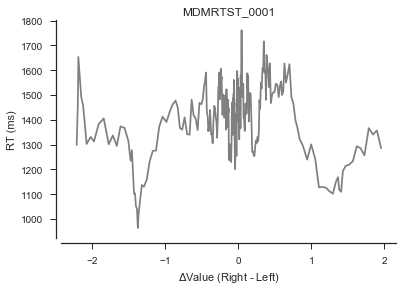

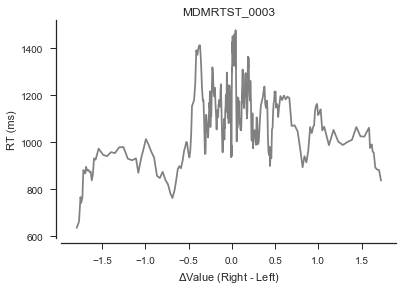

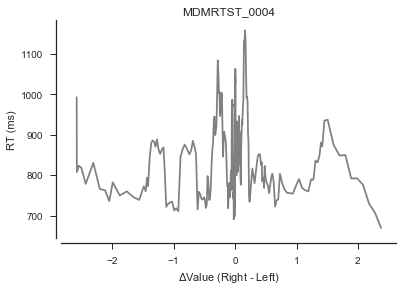

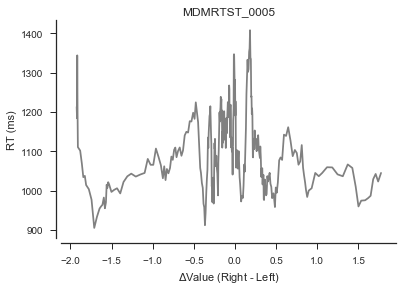

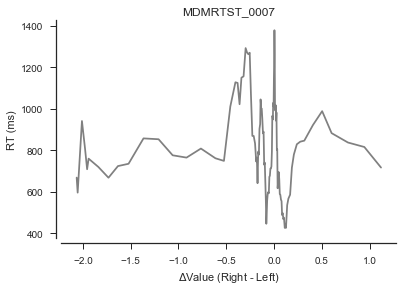

...

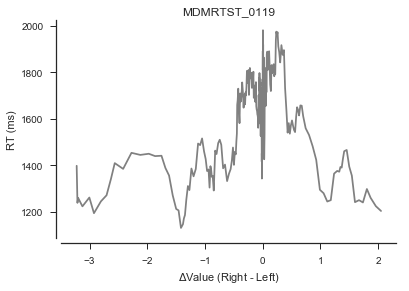

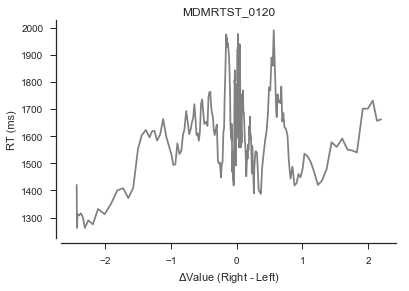

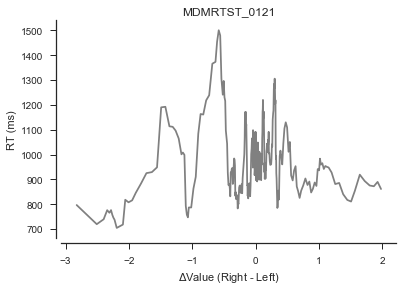

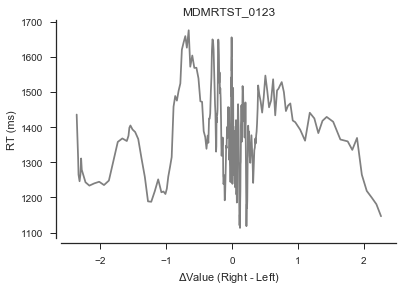

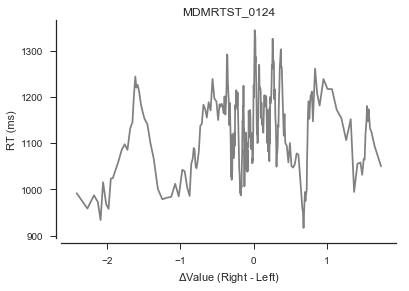

In [35]:
get_rt_plots(True,True)

In [6]:
def getRunningMeanData(data):
    df=pd.DataFrame(data,columns=['stim_strength','rt','ci','subj','deltaval'])  
    df['ci']=df['ci'].astype('bool')
    df['rt']=df['rt'].astype('float64')
    
    dfsorted=df.sort_values('deltaval', ascending=True)
    
    #running mean of choices
    meanprop = pd.Series.rolling(dfsorted['ci'],100,min_periods=1).mean()

    #chose right or chose left
    cr=dfsorted[dfsorted['ci']==1]
    cl=dfsorted[dfsorted['ci']==0]
    
    #running mean of rt
    meanrt_lo = pd.Series.rolling(cl['rt'],50,min_periods=1).mean()
    meanrt_up = pd.Series.rolling(cr['rt'],50,min_periods=1).mean()
    meanrt_both = pd.Series.rolling(dfsorted['rt'],100,min_periods=1).mean()
    return dfsorted, meanprop, meanrt_both

In [7]:
def plotFoodDataRunningMean(fam_data, nov_data):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 3) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    Returns
    -------

    """

    plt.rcParams['figure.dpi'] = 90
    fig = plt.figure()

    fam_dfsorted, fam_meanprop, fam_meanrt_both = getRunningMeanData(fam_data)
    nov_dfsorted, nov_meanprop, nov_meanrt_both = getRunningMeanData(nov_data)
    
    ax_choice = fig.add_subplot(1, 2, 1)
    ax_choice.add_line(
        plt.Line2D(fam_dfsorted['deltaval'], fam_meanprop, color='xkcd:pale red'))
    ax_choice.add_line(
        plt.Line2D(nov_dfsorted['deltaval'], nov_meanprop, color='xkcd:denim blue'))

    ax_choice.set_xlim((-6, 6))
    ax_choice.set_ylim((-0.01, 1.01))
    ax_choice.set_xlabel('DeltaValue (Right - Left)')
    ax_choice.set_ylabel('P(respond Right)')
    plt.title('Choices')

    ax_rt = fig.add_subplot(1, 2, 2)
    ax_rt.add_line(
        plt.Line2D(fam_dfsorted['deltaval'], fam_meanrt_both, color='xkcd:pale red', label='familiar'))
    ax_rt.add_line(
        plt.Line2D(nov_dfsorted['deltaval'], nov_meanrt_both, color='xkcd:denim blue', label='novel'))
  
    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Reaction time (ms) preceded by scenes')
    plt.title('RT')
    
    ax_rt.set_xlim((-6, 6))
    ax_rt.set_ylim(800, 1600)
    
    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Mean reaction times (ms)')
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    sns.despine(offset=5, trim=True)
    plt.tight_layout()
    plt.show()


### Running mean for short ISI: familiar v. novel scenes

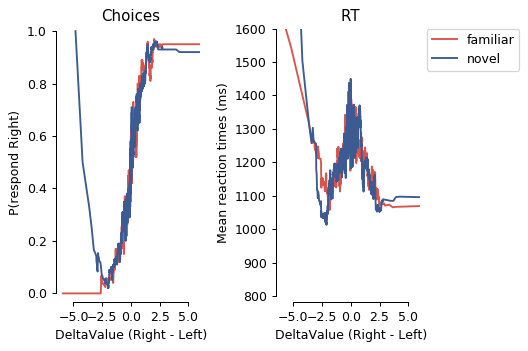

In [8]:
# Plot food data for familiar scenes
food=pd.read_csv(_thisDir + '/output/food_zscoredratings.csv')
##
food=food.loc[food['ISI']==0]
##
food['deltavalrnd']=food['deltaval'].round(1)
food = food.loc[food['sceneStimulusStatus'] == 'familiar']
datafood=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright']])
fam_datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])

# Plot food data for novel scenes
food=pd.read_csv(_thisDir + '/output/food_zscoredratings.csv')
##
food=food.loc[food['ISI']==0]
##
food['deltavalrnd']=food['deltaval'].round(1)
food = food.loc[food['sceneStimulusStatus'] == 'novel']
datafood=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright']])
nov_datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])
plotFoodDataRunningMean(fam_datafoodplot, nov_datafoodplot)

### Running mean for long ISI: familiar v. novel scenes

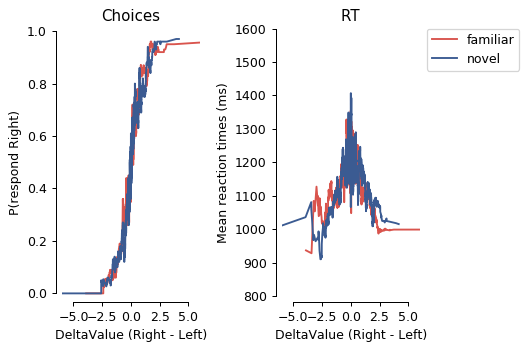

In [9]:
food=pd.read_csv(_thisDir + '/output/food_zscoredratings.csv')
##
food=food.loc[food['ISI']==2.5]
##
food['deltavalrnd']=food['deltaval'].round(1)
food = food.loc[food['sceneStimulusStatus'] == 'familiar']
datafood=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright']])
fam_datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])

# Plot food data for novel scenes
food=pd.read_csv(_thisDir + '/output/food_zscoredratings.csv')
##
food=food.loc[food['ISI']==2.5]
##
food['deltavalrnd']=food['deltaval'].round(1)
food = food.loc[food['sceneStimulusStatus'] == 'novel']
datafood=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright']])
nov_datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])
plotFoodDataRunningMean(fam_datafoodplot, nov_datafoodplot)

In [52]:
tmp = pd.read_csv('./output/food_zscoredratings.csv')
tmp.sort_values('RT',ascending=False,inplace=True)
print tmp.head()
# MDMRTST_0100 didn't leave the page in any trials

       Unnamed: 0        subjid  deltaval          ImageLeft  \
20180       20180  MDMRTST_0100    -0.019           BabyRuth   
20064       20064  MDMRTST_0100     0.033             Fritos   
24405       24405  MDMRTST_0120     0.022  Laffytaffyred_one   
5071         5071  MDMRTST_0028     0.239           Snickers   
21331       21331  MDMRTST_0107    -0.059          CherryPie   

             ImageRight  bidLeft  bidRight      RT sceneStimulusStatus  ISI  \
20180          Skittles   -1.121    -1.140  2999.3               novel  0.0   
20064              Twix    0.203     0.235  2999.2            familiar  0.0   
24405         Sourpatch   -0.946    -0.923  2988.8               novel  0.0   
5071   icecreamsandwich   -0.755    -0.515  2984.0               novel  2.5   
21331          Goldfish   -0.857    -0.916  2980.9            familiar  0.0   

       choseright  
20180        True  
20064       False  
24405        True  
5071        False  
21331        True  


## Plots with binned data

In [59]:
food.columns

Index([u'Unnamed: 0', u'subjid', u'deltaval', u'ImageLeft', u'ImageRight',
       u'bidLeft', u'bidRight', u'RT', u'sceneStimulusStatus', u'ISI',
       u'choseright'],
      dtype='object')

In [2]:
def binFoodData():
    zscoreRatings = True
    printFigs = False
    df_sig_pval = get_p_logistic_plots(zscoreRatings=False, printFigs=False)
    subjects = df_sig_pval['subjectId'].values

    fam_short_df = pd.DataFrame()
    nov_short_df = pd.DataFrame()
    fam_long_df = pd.DataFrame()
    nov_long_df = pd.DataFrame()

    for subject in subjects:
        df = pd.read_csv('./output/food_zscoredratings.csv')
        
        sub_df_fam_short = df.loc[(df['sceneStimulusStatus']=='familiar') & (df['ISI']==0.0)]
        sub_df_nov_short = df.loc[(df['sceneStimulusStatus']=='novel') & (df['ISI']==0.0)]
        sub_df_fam_long = df.loc[(df['sceneStimulusStatus']=='familiar') & (df['ISI']==2.5)]
        sub_df_nov_long = df.loc[(df['sceneStimulusStatus']=='novel') & (df['ISI']==2.5)]
        
        sub_df_fam_short = sub_df_fam_short[['choseright','RT','deltaval','subjid']]
        sub_df_nov_short = sub_df_nov_short[['choseright','RT','deltaval','subjid']]
        sub_df_fam_long = sub_df_fam_long[['choseright','RT','deltaval','subjid']]
        sub_df_nov_long = sub_df_nov_long[['choseright','RT','deltaval','subjid']]

        # bin delta values
        for i in range(0,4):
            if i == 0:
                sub_df = sub_df_fam_short
                df = fam_short_df
            elif i == 1:
                sub_df = sub_df_nov_short
                df = nov_short_df
            elif i == 2:
                sub_df = sub_df_fam_long
                df = fam_long_df
            else:
                sub_df = sub_df_nov_long
                df = nov_long_df
                
            sub_food = sub_df
            deltabins = pd.qcut(sub_food['deltaval'], 14, duplicates = 'drop')
            sub_food = sub_food.set_index(deltabins)
            sub_food['deltavalrnd'] = sub_food['deltaval']
            j = 0
            for interval in deltabins.unique():
                foodbin = sub_food.loc[interval]['deltavalrnd']
                foodbinmean = foodbin.mean()
                sub_food.loc[interval, 'deltavalrnd'] = foodbinmean
                sub_food.loc[interval, 'BinN'] = j
                j+=1
            sub_df = sub_food.reset_index(drop=True)
            #sub_df.columns = ['choseright', 'RT', 'deltaval', 'subjid', 'deltavalrnd', 'binN']
            df = pd.concat([df,sub_df], axis = 0)
            if i == 0:
                sub_df_fam_short = sub_df
                fam_short_df = df
            elif i == 1:
                sub_df_nov_short = sub_df
                nov_short_df = df
            elif i == 2:
                sub_df_fam_long = sub_df
                fam_long_df = df
            else:
                sub_df_nov_long = sub_df
                nov_long_df = df
    return fam_short_df, nov_short_df, fam_long_df, nov_long_df

In [3]:
def sortedFunc(x, y, func):
    unique_y = np.sort(np.unique(y))
    ny = len(unique_y)

    out_x = np.empty(ny)
    counts_y = np.empty(ny)
    for i, j in zip(range(ny), unique_y):
        out_x[i] = getattr(np, func)(np.array(x)[np.array(y) == j])
        counts_y[i] = np.sum(np.array(y) == j)

    return(np.column_stack([unique_y, out_x, counts_y]))

In [4]:
def getBinnedDataForPlotting(data):
    stim_strengths, rt, ci, subj, binN = data[:, 0], data[:, 1], data[:, 2], data[:, 3], data[:,4]
    
    ustim_strengths = np.unique(stim_strengths)
    meanprop = sortedFunc(ci, binN, 'mean')[:, 1]
    
    df=pd.DataFrame(data,columns=['stim_strength','rt','ci','subj','binN'])  
    df['ci']=df['ci'].astype('bool')
    df['rt']=df['rt'].astype('float64')
    df['stim_strength']=df['stim_strength'].astype('float64')
    
    bin_numbers = df['binN'].unique()
    binvalues=df.groupby('binN',as_index=False).median()['stim_strength']
    
    smean = df.groupby(['subj','binN'],as_index=False).mean()
    semprop = smean.groupby('binN').sem()['ci']
    
    #chose right or chose left
    cr=df[df['ci']==1]
    cl=df[df['ci']==0]
    
    #means per participant per stim_strenght
    scrmeans=cr.groupby(['subj','binN'],as_index=False).mean()
    sclmeans=cl.groupby(['subj','binN'],as_index=False).mean()
    bothmeans=df.groupby(['subj','binN'],as_index=False).mean()
    del sclmeans['ci'] 
    del scrmeans['ci'] 
    del bothmeans['ci']     
    
    meanrt_lo=cl.groupby(['binN'],as_index=False).mean()['rt']
    meanrt_up=cr.groupby(['binN'],as_index=False).mean()['rt']
    meanrt_both=df.groupby(['binN'],as_index=False).mean()['rt']
    
    semrt_lo=sclmeans.groupby('binN').sem()['rt']
    semrt_up=scrmeans.groupby('binN').sem()['rt']
    semrt_both=df.groupby('binN').sem()['rt']
    
    return bin_numbers, meanprop, semprop, meanrt_both, semrt_both, binvalues

In [5]:
def plotFoodData(fam_data, nov_data):
    """
    Plot raw behavioral data 

    Parameters
    ----------
    data : 2D array of shape (N, 4) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors

    fig = plt.figure()
    
    ax_choice = fig.add_subplot(1, 2, 1)
    plt.title('Choices')
    #ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    ax_choice.set_xlabel('DeltaValue (Right - Left)')
    ax_choice.set_ylabel('P(respond Right)')

    ax_rt = fig.add_subplot(1, 2, 2)
    plt.title('RT')

    ax_rt.set_xlabel('DeltaValue (Right - Left)')
    ax_rt.set_ylabel('Reaction time (ms)')

    bin_numbers, meanprop, semprop, meanrt_both, semrt_both, binvalues = getBinnedDataForPlotting(fam_data)
    ax_choice.errorbar(binvalues, meanprop, yerr=semprop, color='xkcd:pale red',
                       linestyle='None', capsize=0, marker='o',label="familiar")
    ax_rt.errorbar(binvalues, meanrt_both, yerr=semrt_both,
                   color='xkcd:pale red', linestyle='None', marker='o', capsize=0, label="familiar")
    
    bin_numbers, meanprop, semprop, meanrt_both, semrt_both, binvalues = getBinnedDataForPlotting(nov_data)
    ax_choice.errorbar(binvalues, meanprop, yerr=semprop, color='xkcd:denim blue',
                       linestyle='None', capsize=0, marker='o',label="novel")
    ax_rt.errorbar(binvalues, meanrt_both, yerr=semrt_both,
                   color='xkcd:denim blue', linestyle='None', marker='o', capsize=0, label="novel")
    
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    
    sns.despine(offset=5, trim=True)
    plt.tight_layout()
    plt.show()

In [6]:
def getDataFoodPlot(food):
    food['deltavalrnd']=food['deltavalrnd'].round(1)
    datafood=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright']])
    datafoodplot=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['BinN']])
    return datafoodplot

In [66]:
[fam_short_food,nov_short_food,fam_long_food,nov_long_food]=binFoodData()

total number of people who accepted the HIT 124
86 subjects completed the auction and choice tasks.
Of 86 subjects, 81 subjects had significant p values for the logistic regression.


### Short ISI

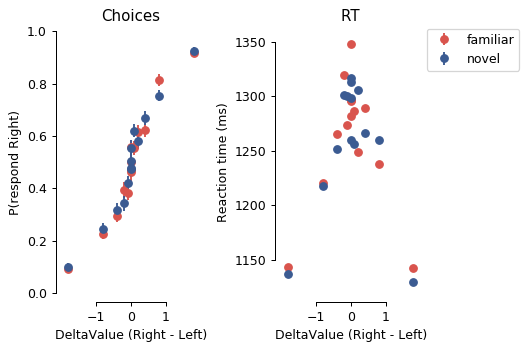

In [78]:
fam_short_foodplot = getDataFoodPlot(fam_short_food)
nov_short_foodplot = getDataFoodPlot(nov_short_food)

plotFoodData(fam_short_foodplot,nov_short_foodplot)

### Long ISI

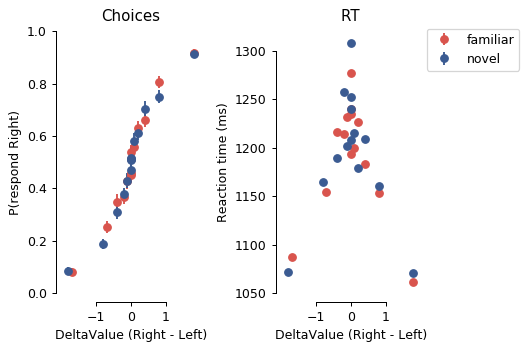

In [74]:
fam_long_foodplot = getDataFoodPlot(fam_long_food)
nov_long_foodplot = getDataFoodPlot(nov_long_food)

plotFoodData(fam_long_foodplot,nov_long_foodplot)

## DDM fits

In [3]:
def discretize(theta, stim_strengths, tmax, dt):
    """
    Utility function that sets up the grid on which to do density propagation
    and also computes some additional required quantities

    Parameters
    ----------
    theta : 9 element list or array containing the DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    stim_strengths : array of unique stimulus strength for which to do
                     propagation

    tmax : float, maximum time for which to propagate

    dt : float, temporal resolution, in seconds, to use when propagating

    Returns
    -------
    drifts : array of shape (nd,) when nd is the number of drifts

    t : array of shape (nt,) where nt is the number of time points;
        vector of time points

    Bup : array of shape (nt,) where nt is the number of time points;
          vector of upper bounds, one value per each time bin

    Blo : array of shape (nt,) where nt is the number of time points;
          vector of lower bounds, one value per each time bin

    y : array of shape (ng,) where ng is the number of grid points
        over which to compute Gaussian density;
        these are the grid points to which y0 corresponds

    yinit : array of shape (ng,) where ng is the number of grid points
            over which to compute Gaussian density;
            these are the  actual initial density values

    """

    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta

    # time
    tmax = tmax + .3
    t = np.arange(0, tmax, dt)

    # bounds
    Bup = B0 * (t == t)
    s = t > Bdel

    #exponential
    Bup[s] = B0 * np.exp(-B2 * (t[s] - Bdel))
    Blo = -Bup

    # drift rate
    drifts = k * (stim_strengths + stim_strength_bias)
    
    # max unsigned drift
    md = np.max(np.abs(drifts))
    sm = md * dt + np.sqrt(dt) * 4
    y = np.linspace(np.min(Blo) - sm, np.max(Bup) + sm, 512)
    yinit = 0 * y

    i1 = np.where(y >= y0)[0][0]
    i2 = np.where(y <= y0)[0][-1]

    if i1 == i2:
        yinit[i1] = 1
    else:
        w2 = np.abs(y[i1] - y0)
        w1 = np.abs(y[i2] - y0)

        w1 = w1 / (w1 + w2)
        w2 = (1 - w1)
        yinit[i1] = w1
        yinit[i2] = w2

    drifts = drifts[np.newaxis, :]
    t = t.reshape(-1, 1)
    Bup = Bup.reshape(-1, 1)
    Blo = Blo.reshape(-1, 1)
    y = y.reshape(-1, 1)
    yinit = yinit.reshape(-1, 1)
    return drifts, t, Bup, Blo, y, yinit

In [4]:
def propagate(drifts, t, Bup, Blo, y, y0, notabs_flag=False):
    """
    Given a set of drift rates and bounds, compute various quantities
    that characterize the behavior of the drift-diffusion process

    Parameters
    ----------
    drifts : 2D array of shape (1, nd) where nd is the number of drift rates;
             this is a row vector of drifts

    t : 2D array of shape (nt, 1) where nt is the number of time points;
        this is a column vector of time points

    Bup : 2D array of shape (nt, 1) where nt is the number of time points;
          this is a column vector of upper bounds, one value per each time bin

    Blo : 2D array of shape (nt, 1) where nt is the number of time points;
          this is a column vector of lower bounds, one value per each time bin

    y : 2D array of shape (ng, 1) where ng is the number of grid points
        over which to compute Gaussian density; this is a column vector
        of grid points to which y0 corresponds

    y0 : 2D array of shape (ng, 1) where ng is the number of grid points
         over which to compute Gaussian density; this is a column vector
         of actual initial density values

    notabs_flag : boolean, whether to store the not absorbed portion of density

    Returns
    -------
    D : dictionary, contains for each unique stimulus strengh the probability
        of hitting the upper or lower bound, the mean reaction times for the
        two bounds, and the cumulative distribution of reaction times for the
        two bounds (and the not absored densities if requested)

    """
    
    nd = drifts.shape[1]
    nt = t.shape[0]
    dt = t[1, 0] - t[0, 0]
    ny = y.shape[0]

    D = {}
    D['bounds'] = np.column_stack([Bup, Blo])
    D['drifts'] = drifts

    # create fft of zero mean, unit variance gaussian
    kk = np.tile(np.atleast_2d(np.concatenate(
        [np.arange(0, ny / 2 + 1), np.arange(-ny / 2 + 1, 0)])).T, [1, nd])
    omega = 2 * np.pi * kk / (np.max(y) - np.min(y))
    E1 = np.exp(-0.5 * dt * np.power(omega, 2))
    D['up'] = {}
    D['lo'] = {}
    D['both'] = {}
    if notabs_flag:
        D['notabs'] = {}

    D['up']['pdf_t'] = np.zeros([nt, nd])
    D['lo']['pdf_t'] = np.zeros([nt, nd])
    D['both']['pdf_t'] = np.zeros([nt, nd])
    if notabs_flag:
        D['notabs']['pdf'] = np.zeros([nd, ny, nt])

    # U is initial state, one column for each drift rate
    U = np.tile(y0, [1, nd])

    # shift mean of zero mean, unit variance gaussian by drift
    E2 = E1 * np.exp(-1j * omega * np.tile(drifts, [ny, 1]) * dt)

    # prepare the values to propagate for vectorization
    y = np.tile(y, [1, nd])
    p_threshold = .00001
    for i in range(nt):
        # fft current pdf
        Ufft = np.fft.fft(U, axis=0)

        # convolve with gaussian with drift in the frequency domain
        Ufft = E2 * Ufft

        # turn back into time domain
        U = np.real(np.fft.ifft(Ufft, axis=0))
        U = np.clip(U, 0, np.inf)

        D['up']['pdf_t'][i, :] = np.sum(U * (y >= Bup[i]), axis=0)
        D['lo']['pdf_t'][i, :] = np.sum(U * (y <= Blo[i]), axis=0)
        D['both']['pdf_t'][i, :] = np.sum(U * ((y <= Blo[i]) | (y >= Bup[i])), axis=0)

        # keep only density within bounds
        U *= np.logical_and(y > Blo[i], y < Bup[i])

        # store not absorbed density if requested
        if notabs_flag:
            D['notabs']['pdf'][:, :, i] = U.T

        if np.sum(np.sum(U, axis=0) < p_threshold) == nd:
            break

    D['t'] = t

    D['up']['p'] = np.sum(D['up']['pdf_t'], axis=0)
    D['lo']['p'] = np.sum(D['lo']['pdf_t'], axis=0)
    D['both']['p'] = np.sum(D['both']['pdf_t'], axis=0)

    D['up']['mean_t'] = np.dot(t.T, D['up']['pdf_t']) / D['up']['p']
    D['lo']['mean_t'] = np.dot(t.T, D['lo']['pdf_t']) / D['lo']['p']
    D['both']['mean_t'] = np.dot(t.T, D['both']['pdf_t']) / D['both']['p']

    D['up']['cdf_t'] = np.cumsum(D['up']['pdf_t'], axis=0)
    D['lo']['cdf_t'] = np.cumsum(D['lo']['pdf_t'], axis=0)
    D['both']['cdf_t'] = np.cumsum(D['both']['pdf_t'], axis=0)
    return D

In [5]:
def get_binned_data(datafoodloc): # path to data food pickle
    if not os.path.exists(datafoodloc):
        print "Data file does not exist"
        sys.exit(-1)
    with open(datafoodloc, 'rb') as handle:
        datafoodsub = pickle.load(handle)
    
    df = pd.DataFrame(data = datafoodsub)

    df.columns = ['DeltaRnd', 'RT', 'Choice', 'Delta']
    
    bins = df['DeltaRnd'].unique()
    
    allmeanbindata = []
    allstdbindata = []
    
    meanchoice = df['Choice'].mean()
    meanrt = df['RT'].mean()
    
    for deltabin in bins:
        bindata = df.loc[df['DeltaRnd'] == deltabin]
        meanbindata = bindata.mean(axis = 0)
        tmp = bindata
        tmp.loc[:,'Choice'] = tmp['Choice'] - meanbindata['Choice'] + meanchoice
        tmp.loc[:,'RT'] = tmp['RT'] - meanbindata['RT'] + meanrt
        stdbindata = tmp.std(axis = 0)
        allmeanbindata.append(meanbindata)
        allstdbindata.append(stdbindata)
    
    m_bindf = pd.DataFrame(data = allmeanbindata)
    std_bindf = pd.DataFrame(data = allstdbindata)
    return m_bindf, std_bindf

In [6]:
def plotFoodsubDataWithFit(subjid, bindata, dt=.0005):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 3) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    theta : 9 element list or array containing the fitted DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    subjid : subject id
    
    bindata : if True, plots mean with std error bars; if False, plots raw data

    dt : float, temporal resolution, in seconds, to use when propagating
         the stimulus strengths to visualize (for plotting only)

    Returns
    -------

    """
    print subjid
    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors
    
    plt.rcParams['figure.dpi'] = 90
    plt.rcParams['figure.figsize'] = 4, 6
    fig = plt.figure()
    
    colors = {'familiar':'xkcd:pale red', 'novel':'xkcd:denim blue'}
    isiDuration = {'shortISI':0.0,'longISI':2.5}
    
    fig, axs=plt.subplots(2,2, sharey=False, sharex=True)
    
    for sceneStimulusStatus in ['familiar','novel']:
        for ISI in ['shortISI','longISI']:
            
            with open('./output/%s/%s_%s_%s_datafood.pickle'%(subjid,subjid,sceneStimulusStatus,ISI), 'rb') as handle:
                data = pickle.load(handle)
                
            with open('./output/%s/%s_%s_%s_thetafood.pickle'%(subjid,subjid,sceneStimulusStatus,ISI), 'rb') as handle:
                theta = pickle.load(handle)
                print sceneStimulusStatus, ISI, "thetafood:", theta

            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
            stim_strengths, rt, ci, deltaval = data[:, 0], data[:, 1], data[:, 2], data[:, 3]

            stim_strengths = stim_strengths.astype("complex") ** plaw
            ustim_strengths = np.unique(stim_strengths)
            stim_strengths_to_propagate = np.linspace(
                np.min(ustim_strengths), np.max(ustim_strengths), 51)
            
            
            drifts, t, Bup, Blo, y, yinit = discretize(
                theta, stim_strengths_to_propagate, np.max(rt), dt)
            
            D = propagate(drifts, t, Bup, Blo, y, yinit)
            
            df=pd.DataFrame(data,columns=['stim_strength','rt','ci','deltaval'])  
            df['ci']=df['ci'].astype('bool')
            df['rt']=df['rt'].astype('float64')
            df['stim_strength']=stim_strengths

            dfsorted=df.sort_values('deltaval', ascending=True)

            #running mean of choices
            meanprop = pd.Series.rolling(dfsorted['ci'],10,min_periods=1).mean()

            # predicted proportions
            predprop = D['up']['p'][:]

            #chose right or chose left
            cr=dfsorted[dfsorted['ci']==1]
            cl=dfsorted[dfsorted['ci']==0]

            #running mean of rt
            meanrt_lo = pd.Series.rolling(cl['rt'],10,min_periods=1).mean()
            meanrt_up = pd.Series.rolling(cr['rt'],10,min_periods=1).mean()
            meanrt_both = pd.Series.rolling(dfsorted['rt'],10,min_periods=1).mean()

            predrt_up = D['up']['mean_t'][0] + tnd
            predrt_lo = D['lo']['mean_t'][0] + tnd
            predrt_both=D['both']['mean_t'][0] + tnd


            horz_index = {'shortISI':0,'longISI':1}
            vert_index = {'choices':0,'RT':1}
            
            h = horz_index[ISI]
            for plotType in vert_index.keys():
                v = vert_index[plotType]
                
                if plotType == 'choices':
                    if bindata:
                        datafoodpath='./output/%s/%s_%s_%s_datafood.pickle'%(subject,subject,sceneStimulusStatus,ISI)
                        meanbindata, stdbindata = get_binned_data(datafoodpath)
                        axs[h,v].plot(meanbindata['DeltaRnd'].values,meanbindata['Choice'].values,'o',color=colors[sceneStimulusStatus])
                    else: 
                        axs[h,v].add_line(
                            plt.Line2D(dfsorted['deltaval'], meanprop, color=colors[sceneStimulusStatus]))
                    axs[h,v].add_line(
                        plt.Line2D(stim_strengths_to_propagate, predprop, color=colors[sceneStimulusStatus]))
                    axs[h,v].set_ylim(-0.10, 1.10)
                    axs[h,v].set_title(ISI)
                else:
                    if bindata:
                        datafoodpath='./output/%s/%s_%s_%s_datafood.pickle'%(subject,subject,sceneStimulusStatus,ISI)
                        meanbindata, stdbindata = get_binned_data(datafoodpath)
                        axs[h,v].plot(meanbindata['DeltaRnd'].values,meanbindata['RT'].values,'o',color=colors[sceneStimulusStatus], label=sceneStimulusStatus)
                    else:
                        axs[h,v].add_line(
                        plt.Line2D(dfsorted['deltaval'], meanrt_both, color=colors[sceneStimulusStatus], label=sceneStimulusStatus))

                    axs[h,v].add_line(plt.Line2D(
                        stim_strengths_to_propagate, predrt_both,
                        color=colors[sceneStimulusStatus], marker='None'))
                    
                    axs[h,v].set_title(ISI)
    
    axs[1,0].set_ylabel('P(Respond right)')
    axs[1,0].set_xlabel('DeltaValue (Right - Left)')       
    axs[1,1].set_ylabel('RT (s)')
    axs[1,1].set_xlabel('DeltaValue (Right - Left)')
    
    sns.despine(offset=5, trim=True)
    fig.subplots_adjust(hspace=0.2,wspace=0.4)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)
    
    plt.suptitle(subjid)

    plt.show()

MDMRTST_0001
familiar shortISI thetafood: [0.91817118 0.89102311 0.9577931  0.72612923 0.76225848 0.16144798
 0.14765521 0.         0.90632304]
familiar longISI thetafood: [ 2.14785897  0.80033573  0.53641805  0.54907673  0.86460558  0.19160641
 -0.07729804  0.          1.43105241]
novel shortISI thetafood: [ 2.87174938  0.85260444  0.20942613  0.4292612   0.95944805  0.19945458
 -0.01270767  0.          1.04314138]
novel longISI thetafood: [ 1.74043979  0.914965    0.92724744  1.58656136  0.77131238  0.12635784
 -0.18794905  0.          0.75014042]


<Figure size 360x540 with 0 Axes>

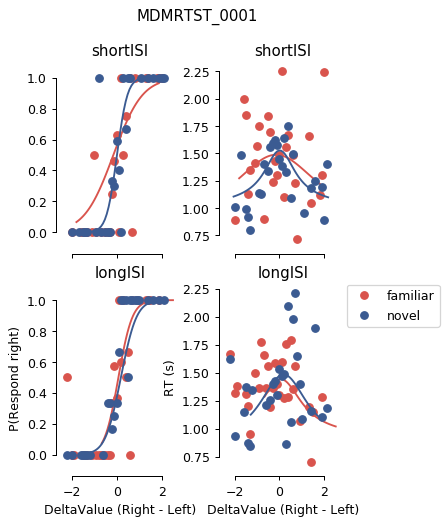

MDMRTST_0003
familiar shortISI thetafood: [ 2.16593338  0.76907891  1.35695161  2.99989381  0.60568483  0.15431672
 -0.04208555  0.          0.77060424]
familiar longISI thetafood: [ 1.24429454  0.80908794  0.75553     0.40314279  0.53235714  0.04537042
 -0.01532115  0.          0.91926222]
novel shortISI thetafood: [ 2.24444451  0.74460741  1.03276242  0.63026926  0.67253267  0.12393904
 -0.08977497  0.          1.06979785]
novel longISI thetafood: [1.18472627 0.82408562 0.80781222 0.12158991 0.48063931 0.00517012
 0.02082093 0.         1.07045058]


<Figure size 360x540 with 0 Axes>

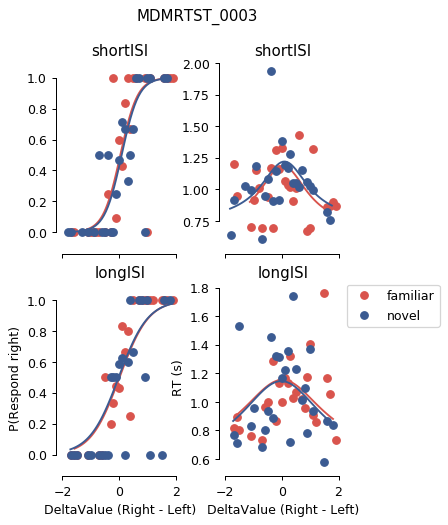

MDMRTST_0004
familiar shortISI thetafood: [0.23573043 0.5025311  0.01680435 0.4662118  0.58257278 0.07770569
 0.17146964 0.         0.30386363]
familiar longISI thetafood: [ 1.13189735  0.53453157  1.99377601  0.22100489  0.54518865  0.03678363
 -0.15527874  0.          0.92122561]
novel shortISI thetafood: [1.49725263 0.60648453 0.4261877  0.00563091 0.52764566 0.06857511
 0.11737527 0.         1.17024388]
novel longISI thetafood: [1.01749552 0.53511819 0.06982342 0.17787594 0.5515986  0.08651905
 0.1285847  0.         0.83961878]


<Figure size 360x540 with 0 Axes>

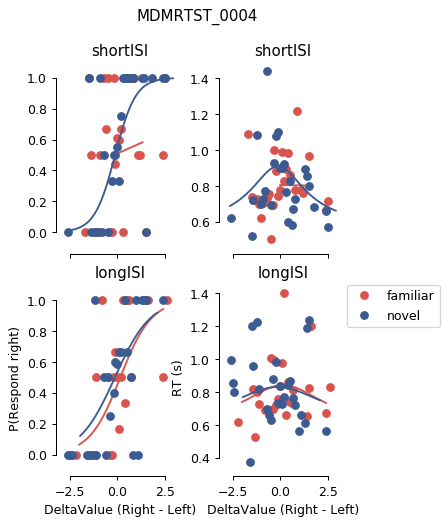

MDMRTST_0005
familiar shortISI thetafood: [ 2.07791935  0.56882509  1.24914814  2.3166523   0.83365381  0.10624857
 -0.15471403  0.          0.63385611]
familiar longISI thetafood: [3.25924448 0.5        1.84153646 1.11032213 0.86747801 0.15821283
 0.10305071 0.         1.07134836]
novel shortISI thetafood: [ 2.3910497   0.5         1.55035837  0.02758997  0.90097625  0.14056897
 -0.01507045  0.          0.69671469]
novel longISI thetafood: [1.55357436e+00 1.00459844e+00 4.62790409e-04 1.09715525e+00
 6.37886264e-01 6.45162677e-02 1.44717380e-01 0.00000000e+00
 9.77119678e-01]


<Figure size 360x540 with 0 Axes>

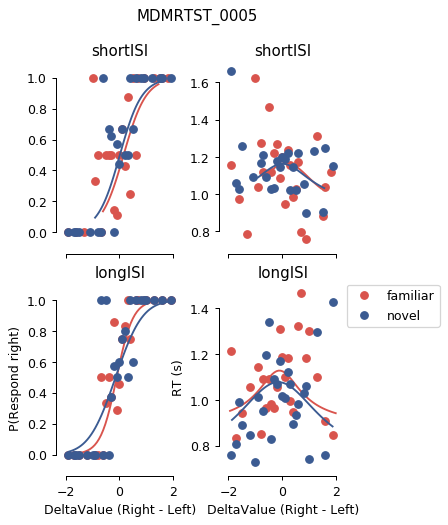

MDMRTST_0008
familiar shortISI thetafood: [ 1.10031189  0.86385858  0.02540152  0.3745527   0.77355004  0.12381636
 -0.19999995  0.          1.38707499]
familiar longISI thetafood: [ 1.63213245  0.97641265  0.35427965  1.65199693  0.59328987  0.03681154
 -0.17146264  0.          0.94126497]
novel shortISI thetafood: [ 1.9919733   0.60310591  3.38609515  0.02422461  0.9561845   0.16453409
 -0.0516673   0.          0.70910637]
novel longISI thetafood: [ 2.67198676  0.568106    0.92863634  0.03980607  0.89776788  0.12445222
 -0.03188548  0.          1.29295257]


<Figure size 360x540 with 0 Axes>

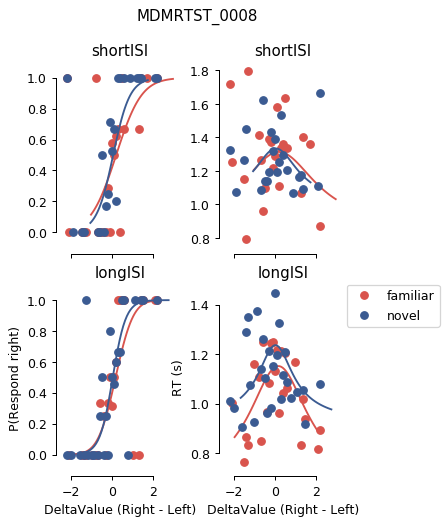

MDMRTST_0009
familiar shortISI thetafood: [1.56133182 0.79455551 1.16793035 1.48327738 0.77642499 0.0715038
 0.03161161 0.         0.60656707]
familiar longISI thetafood: [ 3.95880378  0.73306882  0.50975365  0.12594665  0.89649349  0.1415498
 -0.01851013  0.          1.47318771]
novel shortISI thetafood: [1.88877851 0.86042899 0.15991482 0.20981025 0.75916941 0.09799129
 0.0741757  0.         0.68350814]
novel longISI thetafood: [ 0.79373544  0.92439861  0.60095191  0.30545506  0.72040756  0.07636722
 -0.01735705  0.          0.9022943 ]


<Figure size 360x540 with 0 Axes>

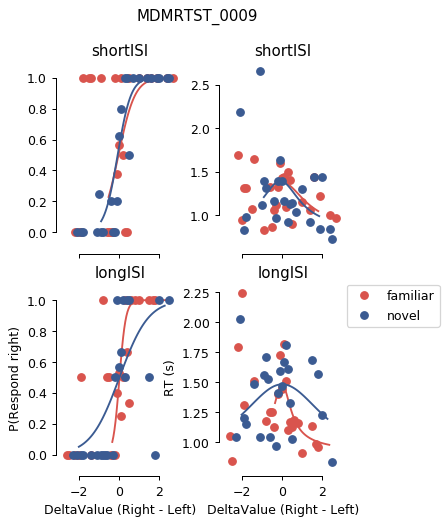

MDMRTST_0013
familiar shortISI thetafood: [ 1.79712215  1.08164023  0.50043766  0.72473354  0.78351499  0.07906057
 -0.03782949  0.          1.19386924]
familiar longISI thetafood: [1.83575605 1.12156162 0.42820942 0.54654286 0.66491404 0.04841176
 0.01485803 0.         0.65727631]
novel shortISI thetafood: [ 1.90016262  1.76449439  0.05681526  0.67235275  0.53989752  0.07882484
 -0.07138385  0.          0.97347956]
novel longISI thetafood: [1.1363089  1.00945656 0.82751219 1.28917797 0.60150347 0.15217721
 0.19734903 0.         1.0932056 ]


<Figure size 360x540 with 0 Axes>

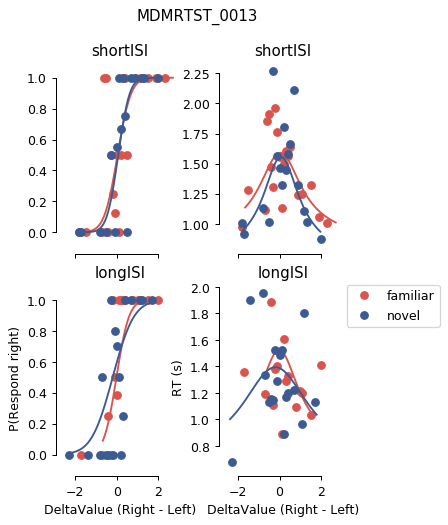

MDMRTST_0016
familiar shortISI thetafood: [2.19726696 0.70857997 0.66082896 0.12482528 0.95236491 0.13795493
 0.03837533 0.         1.37635591]
familiar longISI thetafood: [ 2.54043488  0.62257997  0.1348031   0.18748292  0.96702192  0.16416161
 -0.08909151  0.          1.13766892]
novel shortISI thetafood: [ 2.20830121  0.66601954  1.00461578  2.91765718  0.97742191  0.16247883
 -0.02334368  0.          1.17548138]
novel longISI thetafood: [2.71346836 0.70083903 1.25444244 1.33548869 0.94768855 0.15519979
 0.05165498 0.         0.84200307]


<Figure size 360x540 with 0 Axes>

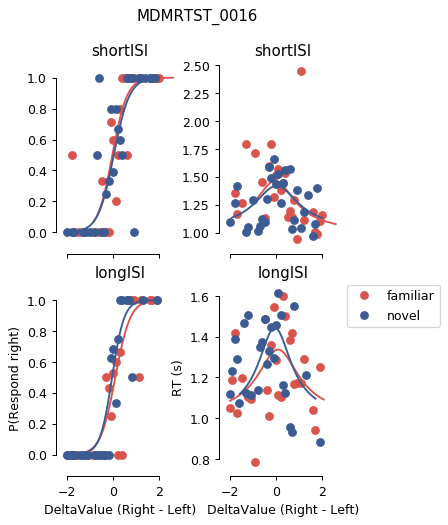

MDMRTST_0018
familiar shortISI thetafood: [ 0.63977289  0.79644649  1.11385876  0.00365303  0.59658441  0.07908435
 -0.12951459  0.          1.23949194]
familiar longISI thetafood: [ 1.17882257  0.97306165  0.3625407   0.6613708   0.44368042  0.00772114
 -0.07085552  0.          1.49516688]
novel shortISI thetafood: [ 0.92284286  0.75571925  0.19886542  0.09565073  0.72048111  0.16510517
 -0.01072976  0.          0.80605681]
novel longISI thetafood: [0.83094694 0.76347109 0.70513122 0.18911421 0.60691213 0.09134363
 0.00446651 0.         0.89177145]


<Figure size 360x540 with 0 Axes>

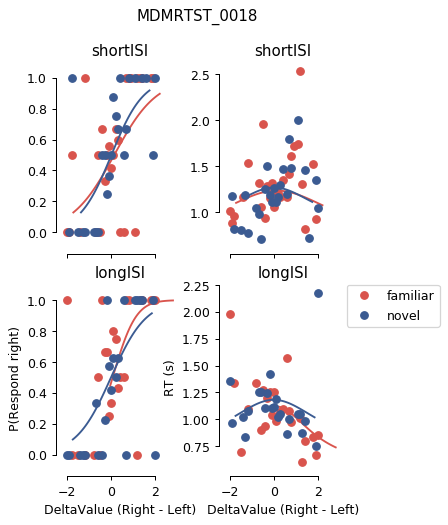

MDMRTST_0019
familiar shortISI thetafood: [1.39274215 0.67422654 0.40724662 1.62176358 0.62911148 0.08148013
 0.15103754 0.         1.07042452]
familiar longISI thetafood: [1.71446483 0.53442853 1.26233434 0.01061111 0.63553543 0.06854994
 0.00748316 0.         0.9417217 ]
novel shortISI thetafood: [1.09822841 0.53233802 1.47281876 0.00201597 0.78045212 0.14374912
 0.00367969 0.         0.94285077]
novel longISI thetafood: [3.70148424 0.57208904 1.44239283 0.74275474 0.71901237 0.08208202
 0.03412552 0.         1.2583262 ]


<Figure size 360x540 with 0 Axes>

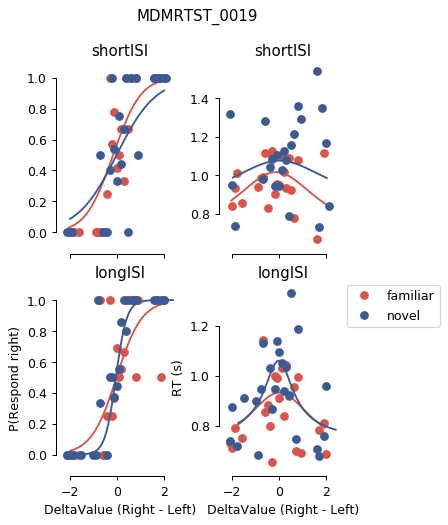

MDMRTST_0021
familiar shortISI thetafood: [ 1.60685997  0.59841429  2.43387003  0.32087725  0.98780449  0.2
 -0.07421264  0.          0.90342799]
familiar longISI thetafood: [ 1.69221875  0.63446612  2.19353332  0.13215187  0.86559244  0.10826636
 -0.09455062  0.          1.17951998]
novel shortISI thetafood: [ 2.27708296  0.8515899   0.52804152  0.53797655  0.77177462  0.10233451
 -0.00342035  0.          1.34140869]
novel longISI thetafood: [ 6.77206014  0.50000007  1.26904784  1.92781486  0.9799834   0.1943237
 -0.08969104  0.          1.38036336]


<Figure size 360x540 with 0 Axes>

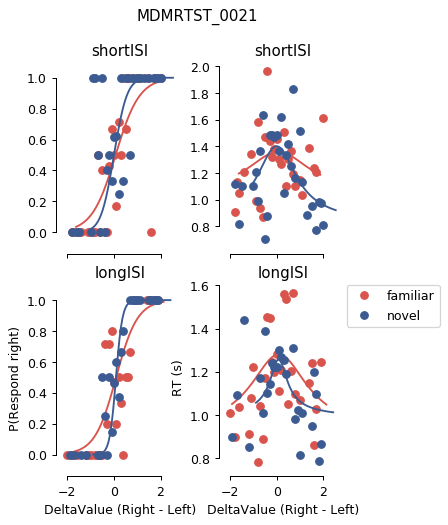

MDMRTST_0022
familiar shortISI thetafood: [ 1.59375928  1.32824581  0.45528651  1.5961115   0.59503468  0.03745713
 -0.00407574  0.          0.95041547]
familiar longISI thetafood: [ 3.55356512  0.74624151  0.10260685  1.82881137  0.93027668  0.18948637
 -0.01571568  0.          0.71470755]
novel shortISI thetafood: [2.86727613 0.7446216  0.08276496 0.63977044 0.86605825 0.18127826
 0.03962108 0.         1.20087354]
novel longISI thetafood: [1.93485196 1.66818917 0.05444167 1.35473099 0.67929862 0.12862448
 0.0596534  0.         1.0566655 ]


<Figure size 360x540 with 0 Axes>

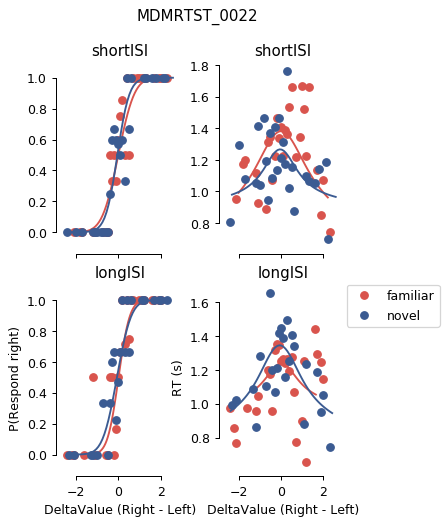

MDMRTST_0024
familiar shortISI thetafood: [ 0.93671192  1.36989254  0.39081563  1.22281473  0.63692379  0.04026744
 -0.04567587  0.          0.92739148]
familiar longISI thetafood: [1.15454227 1.10129328 0.41435838 1.13110621 0.76577416 0.04317879
 0.06924967 0.         0.76380354]
novel shortISI thetafood: [ 1.69457569  0.63752576  0.55790146  0.02280303  1.02637193  0.16838039
 -0.18493713  0.          0.66292162]
novel longISI thetafood: [1.63095024 0.76707153 0.86127037 1.63283562 0.89439397 0.07919354
 0.00918151 0.         0.80947416]


<Figure size 360x540 with 0 Axes>

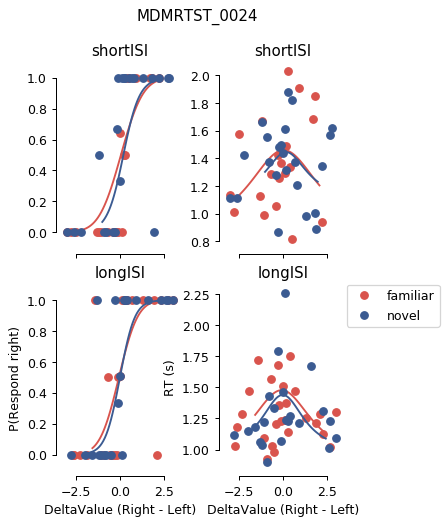

MDMRTST_0025
familiar shortISI thetafood: [ 0.94165948  0.75105823  1.21523541  1.89448173  0.97072967  0.17296795
 -0.01258218  0.          0.75843566]
familiar longISI thetafood: [1.71139564 0.60130104 1.0276883  0.00554226 0.91259448 0.19999956
 0.04033324 0.         1.43258716]
novel shortISI thetafood: [ 1.15833453  0.60779823  3.48375637  2.47137136  1.04057678  0.1973767
 -0.2         0.          0.85540688]
novel longISI thetafood: [ 1.36997695  0.61411399  0.16203802  0.42939536  1.011693    0.19378913
 -0.19602354  0.          1.13423305]


<Figure size 360x540 with 0 Axes>

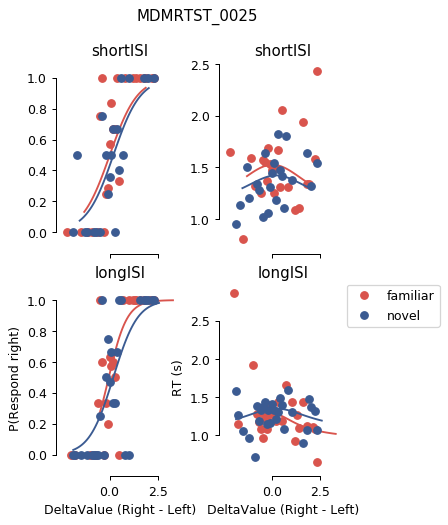

MDMRTST_0026
familiar shortISI thetafood: [ 2.28570989  0.5103329   0.46584278  0.01093725  1.07060061  0.19400827
 -0.18611844  0.          0.60930533]
familiar longISI thetafood: [ 1.29015041  0.57027206  2.71349006  0.03129692  0.95073448  0.2
 -0.2         0.          1.16923281]
novel shortISI thetafood: [ 1.1708146   0.56919205  1.67026243  0.1880959   1.07598367  0.2
 -0.17847279  0.          1.12683032]
novel longISI thetafood: [1.69658504 0.6373668  1.80109351 0.91481385 0.93493376 0.15401224
 0.13247666 0.         0.85598679]


<Figure size 360x540 with 0 Axes>

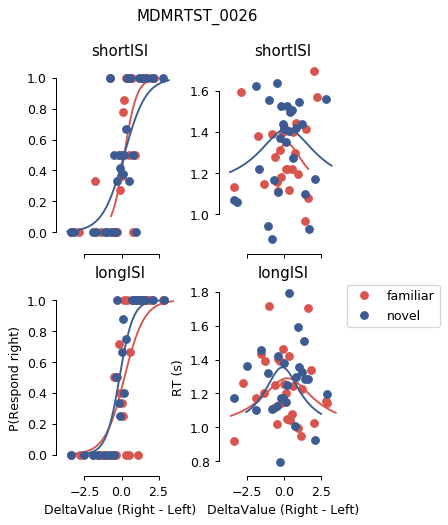

MDMRTST_0028
familiar shortISI thetafood: [1.26241548 0.84069307 0.21988708 0.5505247  0.83852343 0.19978232
 0.1997533  0.         1.37500308]
familiar longISI thetafood: [ 2.09672781  0.59361359  0.48072149  0.03740186  0.78667546  0.16994693
 -0.05149974  0.          1.40281776]
novel shortISI thetafood: [2.3291832  0.58862337 0.00321833 0.00297168 0.94725884 0.19982117
 0.19583129 0.         1.4781207 ]
novel longISI thetafood: [7.30202583e-01 6.24115996e-01 4.29149836e-02 1.31979693e-03
 7.38188125e-01 1.41254490e-01 1.25989340e-01 0.00000000e+00
 1.48097576e+00]


<Figure size 360x540 with 0 Axes>

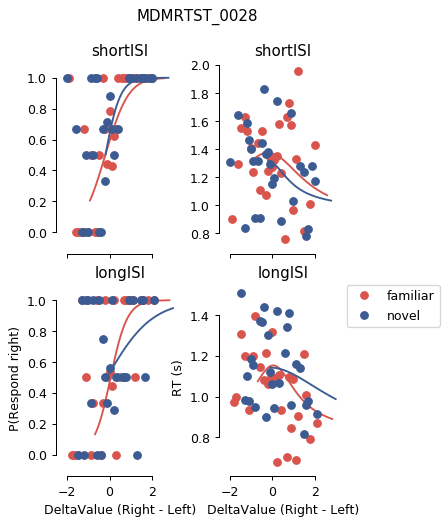

MDMRTST_0029
familiar shortISI thetafood: [2.45369998 1.03442666 0.09480096 0.34325228 0.94807492 0.15724438
 0.05071149 0.         1.01780027]
familiar longISI thetafood: [ 2.88920201  1.1998075   1.1704103   1.60857448  0.84101062  0.10419768
 -0.01903769  0.          0.81318375]
novel shortISI thetafood: [ 2.75832316  1.22124031  0.99139775  1.22519841  0.86585367  0.02526649
 -0.05923611  0.          0.78425251]
novel longISI thetafood: [ 2.01649362  1.02783494  0.9119389   0.66632145  0.90393401  0.05841482
 -0.00593001  0.          0.84050539]


<Figure size 360x540 with 0 Axes>

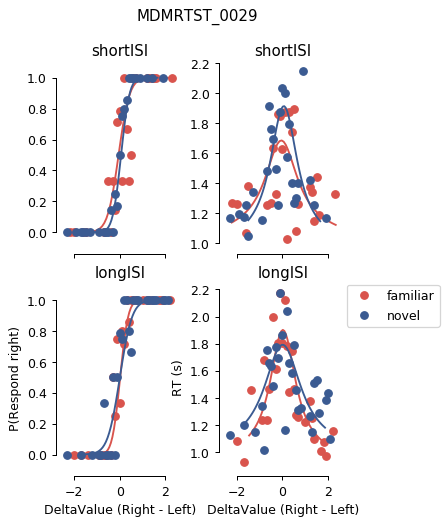

MDMRTST_0030
familiar shortISI thetafood: [1.55280764 0.54211718 1.26511456 0.06096891 0.54024848 0.0703527
 0.13639827 0.         0.95309694]
familiar longISI thetafood: [ 1.71128323  0.5         0.99957381  0.00824539  0.56760151  0.07185575
 -0.0349201   0.          1.33782852]
novel shortISI thetafood: [ 2.47831732  0.5         2.67706719  0.03257418  0.57432064  0.09475225
 -0.13205195  0.          1.13577559]
novel longISI thetafood: [ 3.08981971  0.5         2.63178414  0.07498003  0.6131323   0.13300351
 -0.2         0.          1.21381646]


<Figure size 360x540 with 0 Axes>

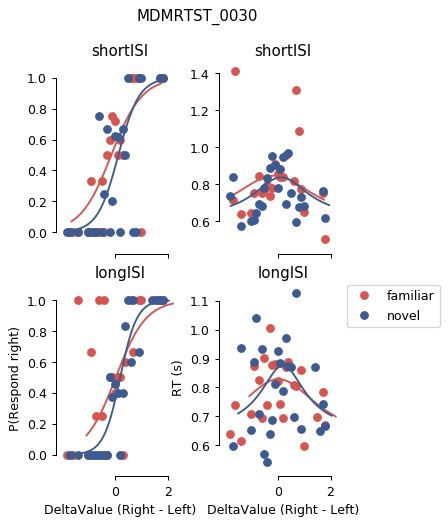

MDMRTST_0031
familiar shortISI thetafood: [ 1.89983379  0.52159277  0.05696509  0.14694941  0.74331036  0.09795592
 -0.10936418  0.          1.17693095]
familiar longISI thetafood: [ 2.62040687  0.5         0.9647533   0.07859616  0.78926391  0.09149568
 -0.14127992  0.          0.83865132]
novel shortISI thetafood: [1.65271602e+00 5.76433639e-01 9.84950025e-01 1.10278906e-08
 6.86706705e-01 7.69892804e-02 4.29285127e-02 0.00000000e+00
 1.13313830e+00]
novel longISI thetafood: [1.89035189e+00 5.00000000e-01 1.32123739e+00 4.07868086e-02
 7.53832493e-01 1.16878646e-01 1.13274537e-03 0.00000000e+00
 1.10681479e+00]


<Figure size 360x540 with 0 Axes>

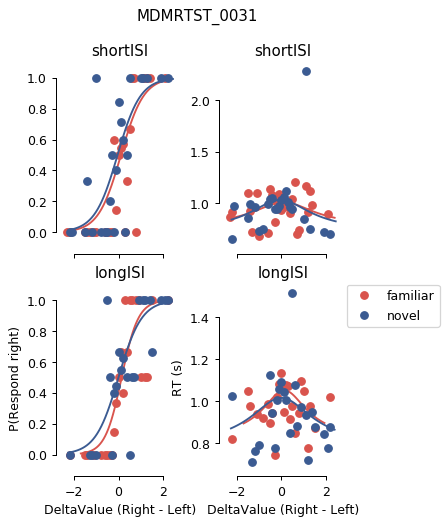

MDMRTST_0032
familiar shortISI thetafood: [ 1.30134674  0.89480352  0.89837647  0.37648647  0.65676993  0.03271212
 -0.16691497  0.          0.81752358]
familiar longISI thetafood: [ 0.68768671  0.91017944  0.48618067  0.68268659  0.64177256  0.0518265
 -0.19958285  0.          1.07604254]
novel shortISI thetafood: [0.76067259 0.83829224 1.24480307 1.85971759 0.64828667 0.03307224
 0.11902306 0.         0.67792958]
novel longISI thetafood: [1.00116322 1.06039751 0.04383182 0.54348415 0.58360875 0.02108844
 0.03539272 0.         0.75723891]


<Figure size 360x540 with 0 Axes>

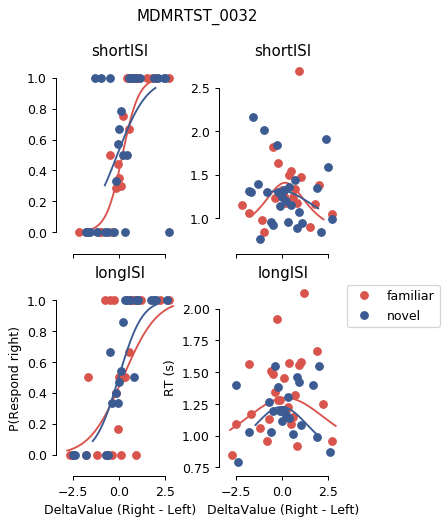

MDMRTST_0033
familiar shortISI thetafood: [1.03671739 1.06653366 0.02477597 0.35763666 0.58689159 0.01364064
 0.10089322 0.         1.11246181]
familiar longISI thetafood: [1.04554662 0.73645701 1.32665333 0.01165898 0.73087116 0.08564323
 0.18002561 0.         1.13856064]
novel shortISI thetafood: [1.85760423 0.84013733 0.63862505 0.37266866 0.70821635 0.09547721
 0.11651611 0.         1.24353413]
novel longISI thetafood: [1.09011211 0.91671053 1.30563263 0.9814346  0.60066503 0.04088011
 0.14911841 0.         0.90558424]


<Figure size 360x540 with 0 Axes>

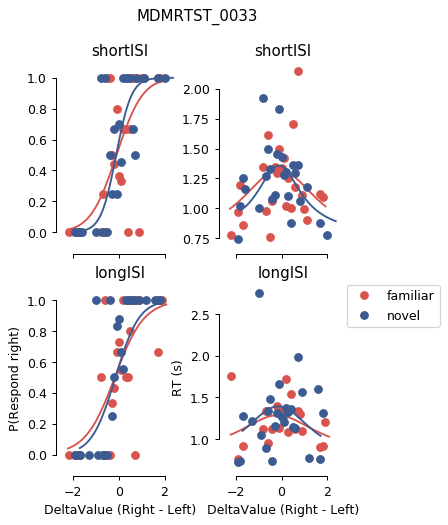

MDMRTST_0034
familiar shortISI thetafood: [ 1.66556424  0.72198419  0.72366542  0.00557903  0.74667599  0.12978731
 -0.13260579  0.          1.16086478]
familiar longISI thetafood: [ 2.07850888e+00  7.18547464e-01  9.50619858e-01  2.46295200e+00
  6.09000003e-01  3.59541477e-09 -9.54564010e-02  0.00000000e+00
  6.98671577e-01]
novel shortISI thetafood: [0.74128849 0.84507464 0.35241817 0.29920232 0.60617072 0.03719719
 0.17381507 0.         0.90509393]
novel longISI thetafood: [ 1.22824915  0.81530867  0.44922087  0.76080644  0.59201176  0.05731137
 -0.11048323  0.          1.18059871]


<Figure size 360x540 with 0 Axes>

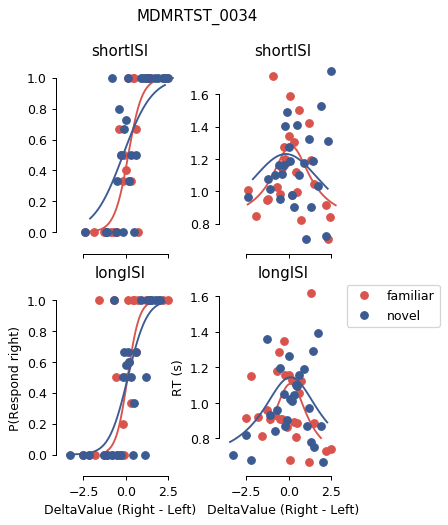

MDMRTST_0036
familiar shortISI thetafood: [ 0.91299469  0.56706076  0.79095315  1.85360436  0.67770519  0.09560476
 -0.19980586  0.          0.92858777]
familiar longISI thetafood: [ 0.62323337  0.56749081  1.58162306  2.33582683  0.60284057  0.04848072
 -0.2         0.          0.95044575]
novel shortISI thetafood: [ 1.823379    0.69436875  0.51055466  1.12411029  0.61409821  0.08372467
 -0.19989833  0.          1.11995422]
novel longISI thetafood: [ 0.8985035   0.65536656  1.09804329  2.99999719  0.58815873  0.03493155
 -0.2         0.          1.11073609]


<Figure size 360x540 with 0 Axes>

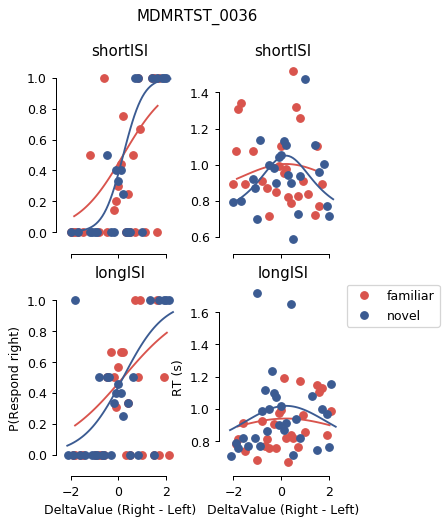

MDMRTST_0038
familiar shortISI thetafood: [ 1.15706203e+00  7.25237412e-01  2.78343666e+00  1.92926714e-01
  8.39000000e-01  2.62663602e-09 -1.81289199e-01  0.00000000e+00
  8.05498493e-01]
familiar longISI thetafood: [ 1.78295624  0.66855201  1.16732985  1.99449839  0.89111044  0.14023001
 -0.18106725  0.          1.37929525]
novel shortISI thetafood: [1.41556497 0.69538377 0.53519551 0.6491784  0.84775398 0.1080426
 0.11586885 0.         0.78301171]
novel longISI thetafood: [0.96338351 0.73023204 1.30047653 2.9990287  0.74169974 0.00354082
 0.19960385 0.         0.8632281 ]


<Figure size 360x540 with 0 Axes>

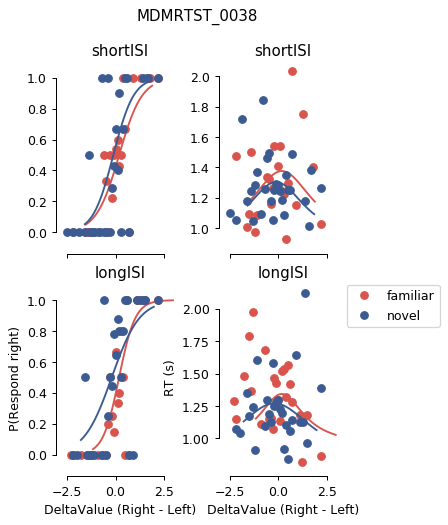

MDMRTST_0039
familiar shortISI thetafood: [ 9.81146397e-01  6.33155095e-01  3.26080026e+00  1.42462174e-01
  6.12499999e-01  5.99643368e-09 -7.96219971e-02  0.00000000e+00
  1.12663131e+00]
familiar longISI thetafood: [ 2.06579268  0.54571343  2.68479074  0.06564251  0.57302739  0.03552653
 -0.12167986  0.          0.70492688]
novel shortISI thetafood: [ 1.39097625  0.74027551  0.0817633   1.10189223  0.58076649  0.05844324
 -0.18397617  0.          1.10040919]
novel longISI thetafood: [ 1.09384313  0.51816221  1.63195139  1.39438005  0.60422743  0.04064113
 -0.2         0.          0.9188077 ]


<Figure size 360x540 with 0 Axes>

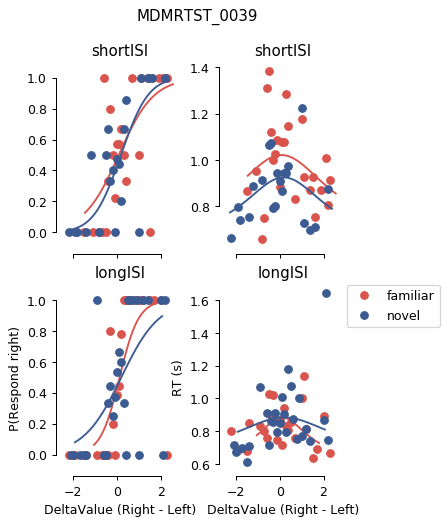

MDMRTST_0040
familiar shortISI thetafood: [ 3.06622701  0.50001242  0.64181554  1.07601045  0.88023169  0.16268346
 -0.04020812  0.          1.20254412]
familiar longISI thetafood: [ 1.67497091  1.07466919  0.08673441  0.88984738  0.59619036  0.11149799
 -0.01153035  0.          1.0278494 ]
novel shortISI thetafood: [ 1.92247571  0.67316866  1.31695833  1.56517052  0.70694851  0.04041039
 -0.15624278  0.          0.81851705]
novel longISI thetafood: [ 2.27778764  0.67308336  1.42598093  0.38838236  0.63283955  0.03125033
 -0.12321758  0.          0.64522082]


<Figure size 360x540 with 0 Axes>

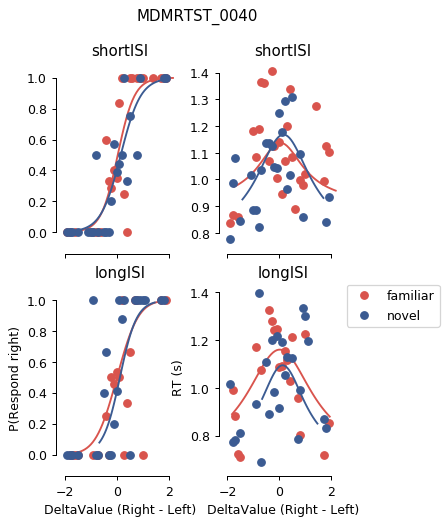

MDMRTST_0041
familiar shortISI thetafood: [ 1.36059434  0.59226023  3.49769841  0.22455808  0.74375283  0.12787363
 -0.2         0.          0.73711019]
familiar longISI thetafood: [1.2469588  0.6859368  1.31747969 0.25487413 0.68624348 0.06281558
 0.05429397 0.         1.3033821 ]
novel shortISI thetafood: [0.55620058 0.65151692 0.67796525 0.23172982 0.71360371 0.06033433
 0.02614522 0.         0.86929761]
novel longISI thetafood: [ 1.29826749  0.63229561  0.62169931  1.20360169  0.77260959  0.10307777
 -0.19987043  0.          1.04601658]


<Figure size 360x540 with 0 Axes>

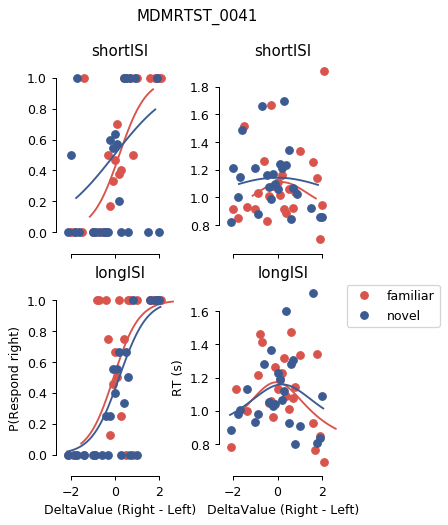

MDMRTST_0042
familiar shortISI thetafood: [ 2.62280296  0.58034085  1.21886181  0.00268397  0.94241374  0.14515409
 -0.10646315  0.          0.71088192]
familiar longISI thetafood: [1.04460964 0.87404261 0.35423193 0.71095772 0.67335832 0.01586279
 0.18439305 0.         0.89111691]
novel shortISI thetafood: [ 1.60727437  0.78571336  0.72405896  0.70062608  0.80741537  0.05221826
 -0.1134284   0.          0.68522478]
novel longISI thetafood: [1.19624987 1.64813552 0.00238706 0.95122115 0.52898152 0.04743707
 0.05310534 0.         0.87557011]


<Figure size 360x540 with 0 Axes>

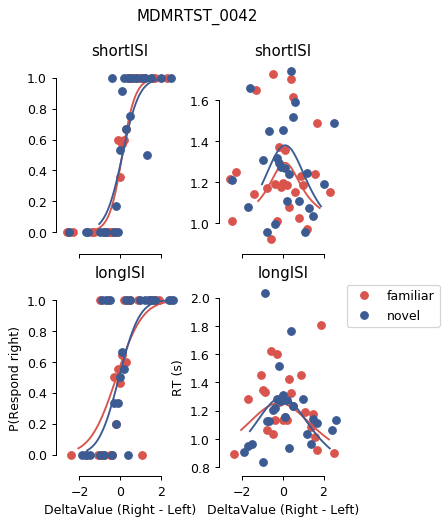

MDMRTST_0043
familiar shortISI thetafood: [0.8548973  0.94547737 0.57340391 0.202222   0.51420105 0.00599679
 0.00745398 0.         0.59226351]
familiar longISI thetafood: [ 0.86439795  0.79168761  1.59922217  2.04899848  0.59230725  0.07932117
 -0.1325942   0.          0.71647305]
novel shortISI thetafood: [ 2.00000305e-01  9.86866688e-01  1.40334140e+00  1.27609585e+00
  4.24000001e-01  2.38835469e-09 -3.76195668e-02  0.00000000e+00
  1.32101540e+00]
novel longISI thetafood: [ 0.89161812  0.78098824  1.97947969  2.61174182  0.53802308  0.00798925
 -0.14199729  0.          0.70031739]


<Figure size 360x540 with 0 Axes>

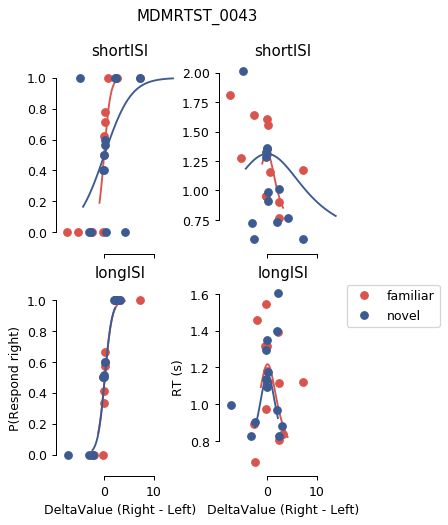

MDMRTST_0045
familiar shortISI thetafood: [ 4.61067563  0.67751312  0.87033023  0.0069965   0.83054935  0.11995761
 -0.07558583  0.          0.62922986]
familiar longISI thetafood: [ 1.35894719e+00  7.71299372e-01  1.92696968e+00  3.78668125e-01
  6.50500000e-01  1.33516540e-09 -1.11033410e-01  0.00000000e+00
  8.03556252e-01]
novel shortISI thetafood: [ 3.10626904e+00  5.00000000e-01  1.61618628e+00  7.74945754e-04
  9.26089190e-01  1.70786043e-01 -6.76250029e-03  0.00000000e+00
  6.80888459e-01]
novel longISI thetafood: [ 4.38392596  0.63342513  1.58642231  0.22221991  0.88282617  0.14246648
 -0.06198704  0.          0.60685113]


<Figure size 360x540 with 0 Axes>

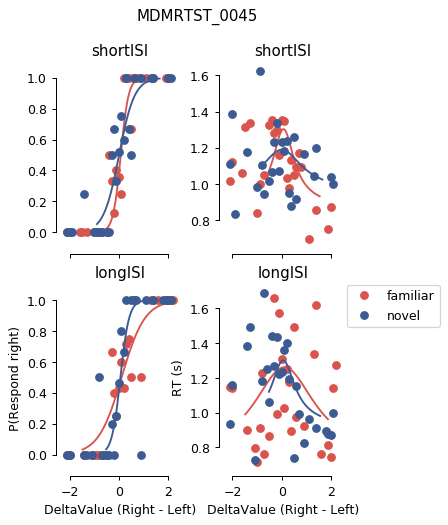

MDMRTST_0048
familiar shortISI thetafood: [ 0.5903214   0.52406494  1.16454967  1.59075376  0.69889643  0.07705988
 -0.18488511  0.          0.8263064 ]
familiar longISI thetafood: [ 1.13593798  0.5010191   3.1784157   0.00421025  0.64104043  0.0667111
 -0.17294457  0.          1.12767439]
novel shortISI thetafood: [ 8.44118544e-01  5.00000000e-01  2.21223334e+00  1.67954290e-04
  7.02319630e-01  7.47553224e-02 -9.22556629e-02  0.00000000e+00
  1.08038450e+00]
novel longISI thetafood: [ 7.22327031e-01  5.00000085e-01  3.78935670e-06  4.92927415e-01
  6.60407470e-01  1.27073912e-01 -1.99989043e-01  0.00000000e+00
  1.04940455e+00]


<Figure size 360x540 with 0 Axes>

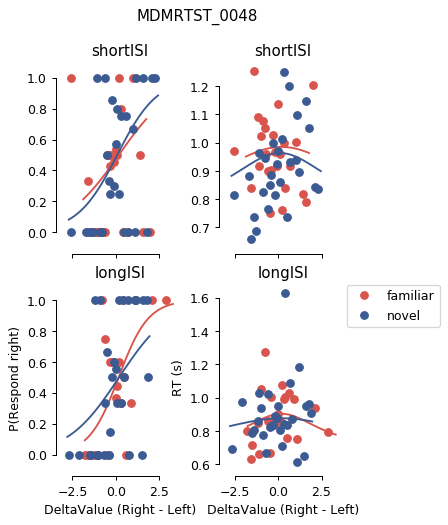

MDMRTST_0049
familiar shortISI thetafood: [ 1.31215476  1.78117298  0.51263003  1.28726864  0.66433585  0.13769939
 -0.00576649  0.          0.83219032]
familiar longISI thetafood: [ 2.41565862  0.99723496  0.59695207  2.44336854  0.95712621  0.17312431
 -0.00437102  0.          1.20081323]
novel shortISI thetafood: [ 1.22157103  1.03924719  0.69044505  2.09409583  0.94939222  0.04011134
 -0.15385023  0.          0.93049492]
novel longISI thetafood: [ 2.02179687  1.32761559  0.23709347  0.86835473  0.84030268  0.12932442
 -0.02669863  0.          1.35168969]


<Figure size 360x540 with 0 Axes>

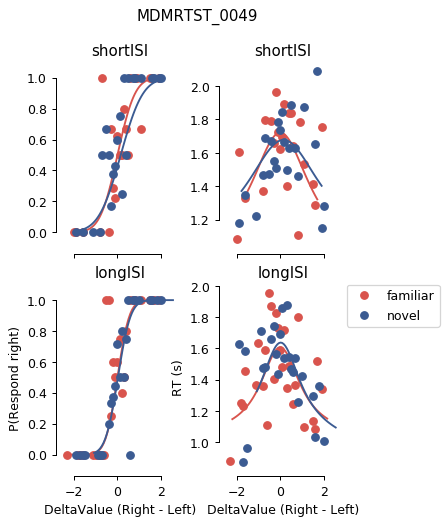

MDMRTST_0050
familiar shortISI thetafood: [ 8.68769970e-01  5.96996905e-01  3.01989264e+00  7.02071320e-04
  7.57229855e-01  7.31653898e-02 -1.47369104e-01  0.00000000e+00
  7.20685042e-01]
familiar longISI thetafood: [ 1.19921283  0.52341051  0.90293648  0.43863798  0.83716589  0.14522331
 -0.19646873  0.          0.95363194]
novel shortISI thetafood: [ 1.00262674  0.518077    0.38607819  0.93070374  0.85292216  0.12547419
 -0.16196282  0.          1.02191915]
novel longISI thetafood: [ 1.68431471  0.57260338  2.49529387  0.00686853  0.80663381  0.12699721
 -0.17650293  0.          1.499     ]


<Figure size 360x540 with 0 Axes>

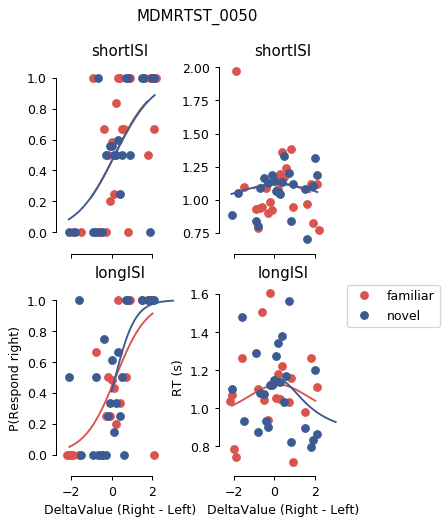

MDMRTST_0051
familiar shortISI thetafood: [ 6.47897581e-01  8.69755289e-01  1.98921049e+00  1.15276596e-03
  6.55062475e-01  6.68196288e-02 -1.15745538e-01  0.00000000e+00
  1.09065852e+00]
familiar longISI thetafood: [ 0.99601922  0.67034321  3.20318158  1.50177741  0.89523094  0.18772654
 -0.2         0.          0.96104107]
novel shortISI thetafood: [ 1.39553555  0.76633262  1.21932555  1.12390672  0.86363382  0.19895732
 -0.14240655  0.          0.61157773]
novel longISI thetafood: [ 2.08221354  0.69441966  0.95336048  2.99998605  0.85656674  0.18481194
 -0.08934726  0.          0.75081846]


<Figure size 360x540 with 0 Axes>

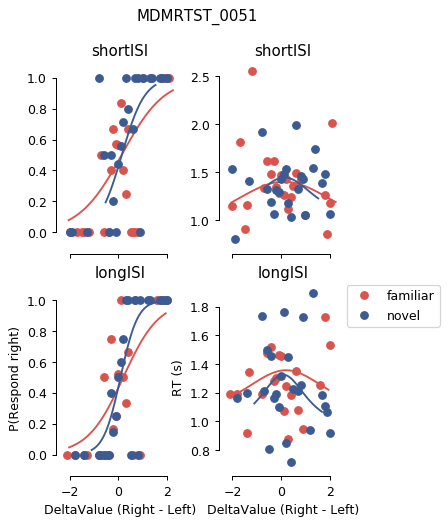

MDMRTST_0052
familiar shortISI thetafood: [ 1.51749115e+00  1.04745461e+00  1.04200961e+00  1.05990564e+00
  6.79999997e-01  3.38063764e-09 -9.11808293e-02  0.00000000e+00
  1.40203405e+00]
familiar longISI thetafood: [ 1.00672197e+00  1.04629931e+00  1.10767793e+00  1.02756929e+00
  6.49000001e-01  1.62678445e-09 -1.20743612e-01  0.00000000e+00
  1.35199244e+00]
novel shortISI thetafood: [ 0.92130022  1.3517288   0.34359121  0.48525518  0.63641764  0.13491851
 -0.11390853  0.          0.83936979]
novel longISI thetafood: [1.44712237 0.9770371  1.1975055  0.81132981 0.76035752 0.10334792
 0.06971037 0.         0.98752151]


<Figure size 360x540 with 0 Axes>

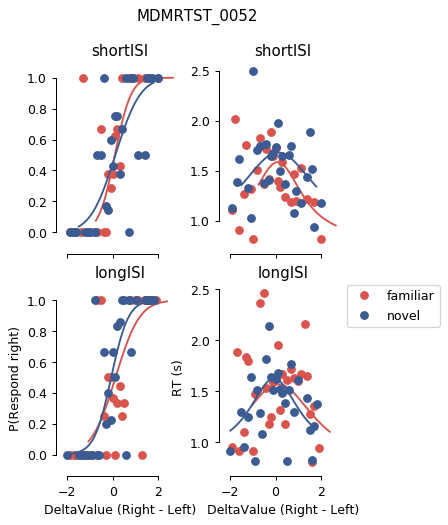

MDMRTST_0053
familiar shortISI thetafood: [1.89522331 0.86780004 1.00631624 1.38352003 0.78627409 0.18362404
 0.11523706 0.         0.76727681]
familiar longISI thetafood: [ 4.97563591  0.76285295  1.37915318  1.87624473  0.81014468  0.17281936
 -0.02750779  0.          1.45215491]
novel shortISI thetafood: [ 2.83175046  0.75719366  0.76526968  0.02189133  0.83499055  0.17245149
 -0.14542675  0.          0.5147419 ]
novel longISI thetafood: [2.16720147e+00 8.43548298e-01 1.14987072e+00 1.12703902e-03
 7.56169720e-01 8.96195747e-02 6.76462412e-02 0.00000000e+00
 8.65982673e-01]


<Figure size 360x540 with 0 Axes>

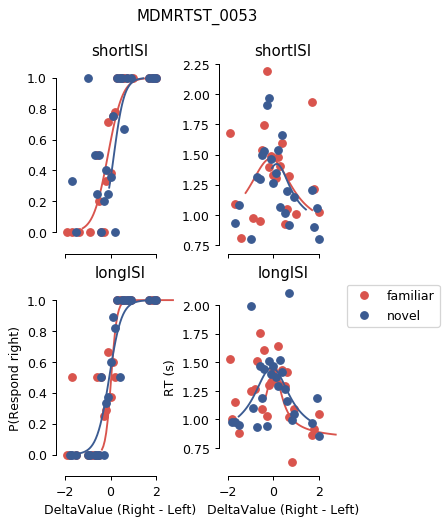

MDMRTST_0054
familiar shortISI thetafood: [ 1.60080661  0.66999786  1.07548613  0.00546086  0.69906388  0.15207472
 -0.18299076  0.          1.39005783]
familiar longISI thetafood: [ 0.51295303  0.60649176  3.05492721  0.38954635  0.64525721  0.06313307
 -0.19999998  0.          0.66049792]
novel shortISI thetafood: [ 0.51555101  0.87147786  0.60680699  1.10314408  0.5888782   0.15045098
 -0.16288876  0.          1.2854681 ]
novel longISI thetafood: [0.20074388 0.61003775 1.01297997 1.13812801 0.60381329 0.0494212
 0.00590706 0.         0.30935882]


<Figure size 360x540 with 0 Axes>

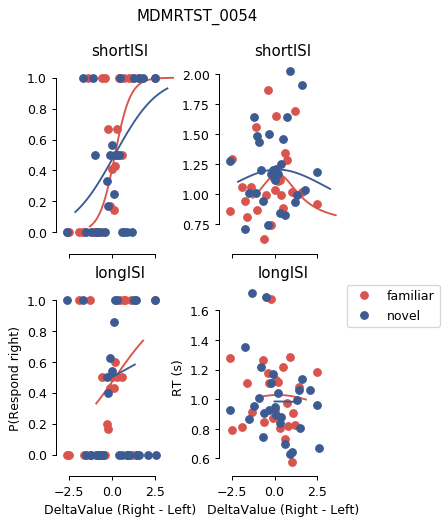

MDMRTST_0055
familiar shortISI thetafood: [ 1.8010714   0.710244    0.00760509  0.10228165  0.69001081  0.14974607
 -0.19999229  0.          0.58856216]
familiar longISI thetafood: [ 1.10232511  0.63013781  1.62118971  2.99999929  0.69030166  0.13423745
 -0.19999834  0.          0.80703754]
novel shortISI thetafood: [ 1.72528288  0.71826539  1.42543291  0.03660478  0.64043669  0.12936306
 -0.03708066  0.          1.37408411]
novel longISI thetafood: [ 0.946299    0.78893239  0.32821465  0.15077716  0.61426537  0.07975408
 -0.04973674  0.          1.05842343]


<Figure size 360x540 with 0 Axes>

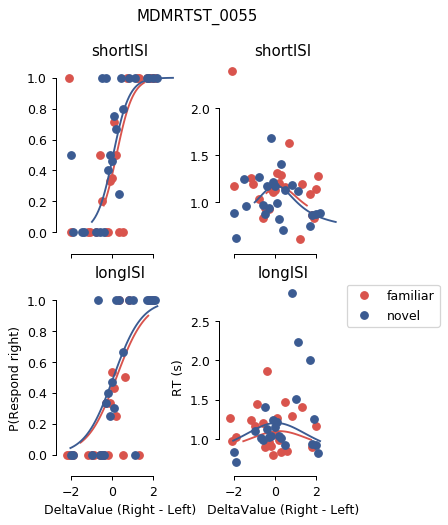

MDMRTST_0056
familiar shortISI thetafood: [ 0.63890546  1.1536742   0.85538813  0.70773428  0.44096703  0.04492475
 -0.15226449  0.          1.22626786]
familiar longISI thetafood: [ 0.84765933  0.77060788  1.31384862  1.86838426  0.75426809  0.19142267
 -0.01834008  0.          1.3506972 ]
novel shortISI thetafood: [ 0.62092603  0.89555268  0.0584691   0.23179673  0.60623732  0.07811232
 -0.02599301  0.          1.20772931]
novel longISI thetafood: [0.67446996 0.9601759  0.84574284 0.78367894 0.55472247 0.02197129
 0.02960313 0.         0.96406311]


<Figure size 360x540 with 0 Axes>

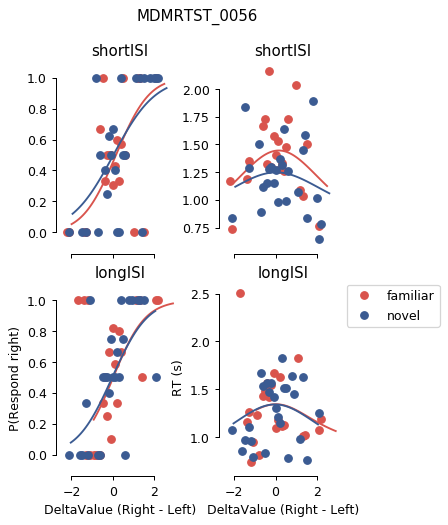

MDMRTST_0057
familiar shortISI thetafood: [1.35111754 1.20336683 0.47023284 0.67408048 0.54039206 0.1032608
 0.02901259 0.         0.9244071 ]
familiar longISI thetafood: [1.13346644e+00 1.67666879e+00 1.46479585e-02 7.59637538e-01
 5.17089032e-01 7.19428815e-02 2.07069269e-04 0.00000000e+00
 1.07490774e+00]
novel shortISI thetafood: [ 1.37754838  1.21989449  0.51967793  0.77754991  0.57421697  0.00880232
 -0.02560511  0.          0.7405053 ]
novel longISI thetafood: [ 1.93632656  0.6640079   1.95369917  0.05018712  0.89181463  0.14283303
 -0.19949467  0.          1.31559384]


<Figure size 360x540 with 0 Axes>

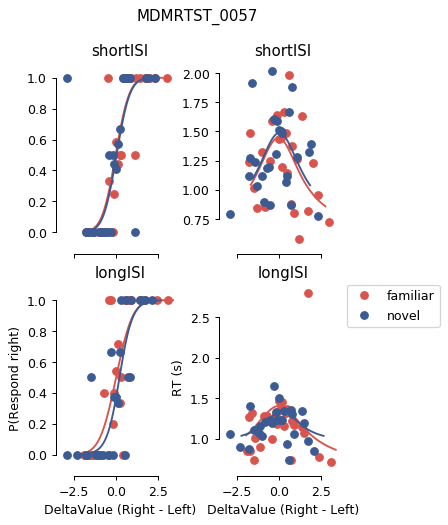

MDMRTST_0060
familiar shortISI thetafood: [0.8797915  1.00881134 0.35325776 0.60466219 0.46791574 0.02695485
 0.16060159 0.         1.04838863]
familiar longISI thetafood: [ 1.04848241  0.6208943   3.2918878   0.18486094  0.7188264   0.2
 -0.04788413  0.          1.16887544]
novel shortISI thetafood: [ 1.01556179  0.87451169  1.41090685  0.84711345  0.50434368  0.00611768
 -0.13713032  0.          1.00750546]
novel longISI thetafood: [ 1.53562865  0.63988321  1.69491124  1.82064805  0.71750901  0.16503806
 -0.19838406  0.          1.12754415]


<Figure size 360x540 with 0 Axes>

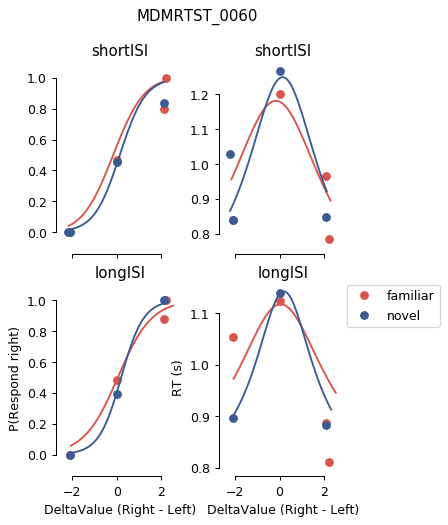

MDMRTST_0061
familiar shortISI thetafood: [ 0.47964078  0.63115085  1.04793439  2.53158076  0.54455353  0.12984778
 -0.05407351  0.          0.97068079]
familiar longISI thetafood: [ 0.910529    0.63372792  1.66600317  0.94044918  0.55073856  0.13028518
 -0.19466309  0.          0.57523063]
novel shortISI thetafood: [0.67185238 0.54671603 1.29868847 0.00954145 0.64468255 0.19999986
 0.01327675 0.         0.77890586]
novel longISI thetafood: [ 1.04068441  0.58377196  0.74218628  1.26187095  0.65324434  0.16160121
 -0.17821593  0.          1.09356228]


<Figure size 360x540 with 0 Axes>

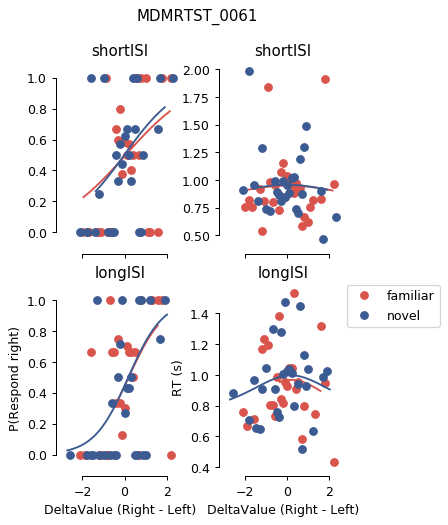

MDMRTST_0062
familiar shortISI thetafood: [2.38206654 0.7799094  0.77332887 0.05760376 0.86940014 0.17537695
 0.02673793 0.         1.00179111]
familiar longISI thetafood: [ 1.85174595  1.38091972  0.49651871  1.02972196  0.51129004  0.07152299
 -0.04921053  0.          0.80419348]
novel shortISI thetafood: [ 2.71460195  0.70152263  0.38416764  0.16335108  0.99231683  0.18930867
 -0.17468937  0.          0.90431714]
novel longISI thetafood: [ 2.94395453  0.79658225  0.61251681  0.87182614  0.87183912  0.1542421
 -0.05859417  0.          0.87881393]


<Figure size 360x540 with 0 Axes>

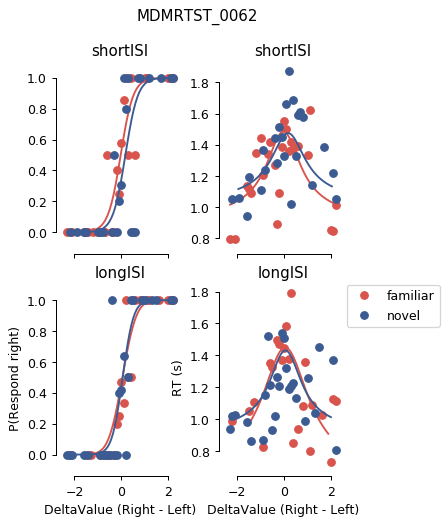

MDMRTST_0064
familiar shortISI thetafood: [1.63923835 0.86241452 0.42297726 0.44950277 0.94729358 0.19999926
 0.09220234 0.         1.23800468]
familiar longISI thetafood: [ 1.96483645  0.7503495   0.63978805  0.54291335  1.01250428  0.14948762
 -0.1214331   0.          1.42892766]
novel shortISI thetafood: [2.27198353 1.23914658 0.3195606  0.68873517 0.85891575 0.11739677
 0.01989486 0.         1.33674393]
novel longISI thetafood: [1.57394652 0.71036339 3.21361608 2.91503146 1.04056774 0.19447257
 0.13058845 0.         0.83732536]


<Figure size 360x540 with 0 Axes>

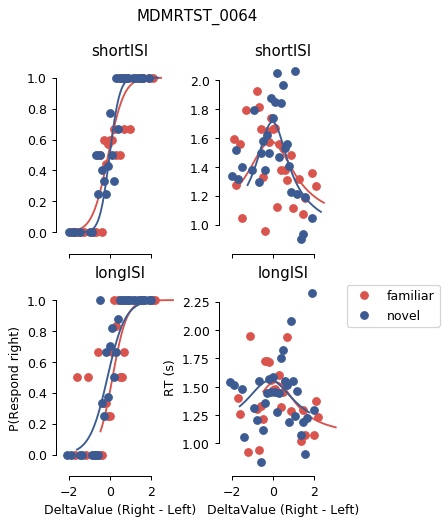

MDMRTST_0065
familiar shortISI thetafood: [ 1.68986437  0.73866681  1.13515046  0.01860404  0.75500108  0.07114776
 -0.04416839  0.          0.97945088]
familiar longISI thetafood: [ 5.81812026  0.61064257  1.13724554  0.13423156  0.84836254  0.18861792
 -0.02932035  0.          1.35707096]
novel shortISI thetafood: [ 1.54229602  0.62554887  1.03617851  0.97897463  0.78886556  0.10179321
 -0.02448772  0.          0.76257578]
novel longISI thetafood: [ 1.01461149  0.63404694  1.90066939  0.06013149  0.70821553  0.11649335
 -0.19958207  0.          1.34325348]


<Figure size 360x540 with 0 Axes>

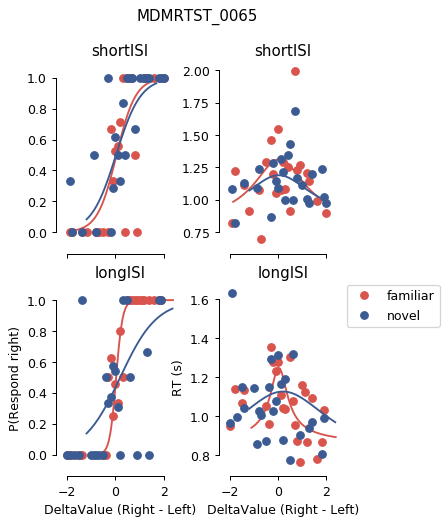

MDMRTST_0066
familiar shortISI thetafood: [ 2.5975639   0.51449154  2.2891738   2.65136786  1.03826372  0.2
 -0.1978208   0.          0.62025128]
familiar longISI thetafood: [1.77306263 0.53823244 0.45933025 0.43467391 0.97397295 0.15642054
 0.1755169  0.         1.06653899]
novel shortISI thetafood: [ 1.87575097  0.61504444  0.78250496  0.03516226  0.92277529  0.14559799
 -0.19794664  0.          0.66406632]
novel longISI thetafood: [ 1.35842557  0.64958955  0.24624282  0.21593691  0.78978767  0.14891839
 -0.17041177  0.          0.70662468]


<Figure size 360x540 with 0 Axes>

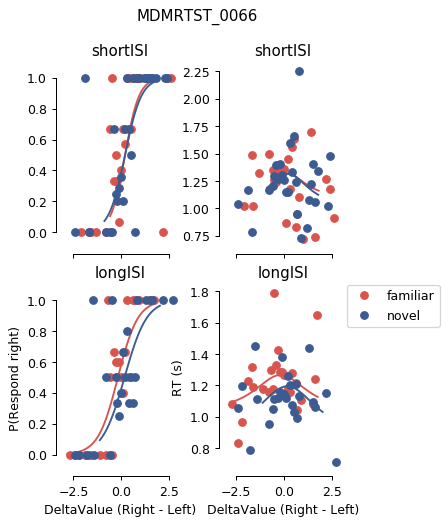

MDMRTST_0067
familiar shortISI thetafood: [1.34119045 0.70105134 1.3320831  0.18788374 0.66455852 0.0974512
 0.10926077 0.         0.63905405]
familiar longISI thetafood: [0.63484553 0.6001067  0.24793541 0.01664274 0.74160207 0.10462012
 0.19839572 0.         1.22878968]
novel shortISI thetafood: [ 1.20613318  0.6486523   1.85128951  0.27096092  0.74873409  0.13178876
 -0.06588803  0.          0.76212855]
novel longISI thetafood: [0.71475894 0.73352338 1.16330114 0.06894906 0.64603656 0.12192637
 0.03728067 0.         1.28026365]


<Figure size 360x540 with 0 Axes>

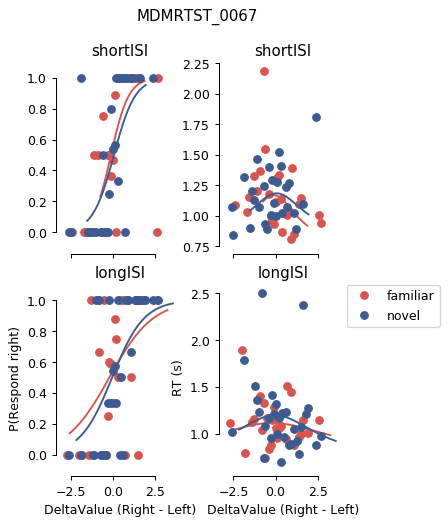

MDMRTST_0072
familiar shortISI thetafood: [1.17837347 0.81256873 0.3935349  0.37627793 0.82211528 0.198936
 0.02285108 0.         1.02288345]
familiar longISI thetafood: [ 2.53692982  0.65828961  0.66539508  0.00717944  0.96145746  0.18112478
 -0.19985451  0.          1.44852459]
novel shortISI thetafood: [1.33407045 1.14801227 0.65530576 1.20803865 0.58708997 0.00411107
 0.06428205 0.         1.35026221]
novel longISI thetafood: [ 2.05625136  0.58512821  1.73747215  0.56465229  0.93739034  0.2
 -0.16186375  0.          1.28797057]


<Figure size 360x540 with 0 Axes>

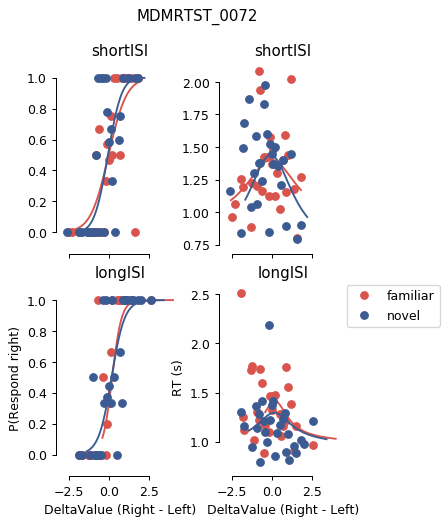

MDMRTST_0077
familiar shortISI thetafood: [ 1.08927811  0.59736937  1.21870318  0.61895655  1.0982598   0.19999976
 -0.12044992  0.          1.06383138]
familiar longISI thetafood: [ 1.9962299   0.62336925  1.39161528  0.08246757  1.05435969  0.19999672
 -0.14919856  0.          0.70334072]
novel shortISI thetafood: [0.84192016 1.10648832 0.08279402 0.38611845 0.78050532 0.19836635
 0.0340589  0.         0.85272121]
novel longISI thetafood: [ 1.94124869  0.70576214  1.11894286  0.46160181  0.9497577   0.19978585
 -0.15366567  0.          1.05826013]


<Figure size 360x540 with 0 Axes>

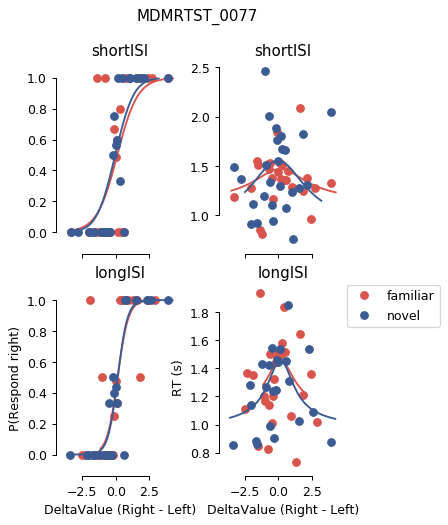

MDMRTST_0079
familiar shortISI thetafood: [ 8.65374266e-01  6.88380236e-01  2.44161833e+00  7.20465753e-04
  7.14309438e-01  1.41164617e-01 -2.00000000e-01  0.00000000e+00
  1.32329077e+00]
familiar longISI thetafood: [ 2.27479148  0.69259598  1.39349583  0.57102648  0.60259393  0.04976456
 -0.07269758  0.          1.46559846]
novel shortISI thetafood: [ 4.11680089e-01  8.20002630e-01  1.19870431e+00  1.78887726e+00
  5.27999999e-01  4.58268922e-09 -6.84729538e-02  0.00000000e+00
  7.32051231e-01]
novel longISI thetafood: [ 9.11148855e-01  7.13364384e-01  1.94927680e+00  4.86175859e-01
  5.24500000e-01  1.58167146e-10 -1.97956592e-01  0.00000000e+00
  1.44417346e+00]


<Figure size 360x540 with 0 Axes>

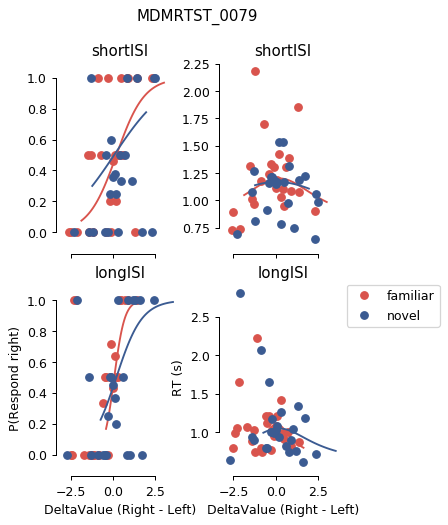

MDMRTST_0080
familiar shortISI thetafood: [ 1.20078644  0.71155798  0.68976236  0.13203007  0.79130143  0.11854561
 -0.0404433   0.          1.27406001]
familiar longISI thetafood: [0.86328569 0.71990812 1.24811531 1.14119208 0.7801665  0.15962316
 0.0948985  0.         1.21883043]
novel shortISI thetafood: [ 1.12385077  0.76546059  1.53173444  2.32277109  0.79225092  0.17763469
 -0.11441879  0.          0.64102031]
novel longISI thetafood: [ 9.73463740e-01  5.36350485e-01  1.69017756e+00  4.74899232e-04
  9.34070860e-01  1.97824860e-01 -4.38670716e-03  0.00000000e+00
  1.38507383e+00]


<Figure size 360x540 with 0 Axes>

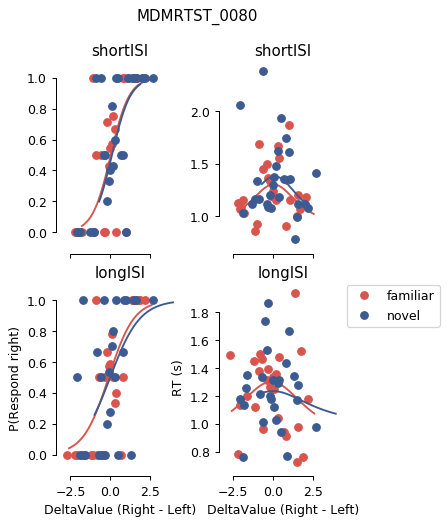

MDMRTST_0083
familiar shortISI thetafood: [ 1.81254504  0.5         1.41684372  0.08674935  0.75515394  0.1313027
 -0.13600878  0.          1.37676776]
familiar longISI thetafood: [ 1.47545063  0.5         1.60762835  0.40088276  0.6940788   0.11217416
 -0.00958938  0.          0.77802715]
novel shortISI thetafood: [1.42597677e+00 6.60426107e-01 2.13119458e+00 1.10063500e-04
 6.12183945e-01 3.61653698e-02 7.72744954e-02 0.00000000e+00
 1.24181701e+00]
novel longISI thetafood: [ 2.52757555  0.5         1.72731883  0.14914567  0.69624056  0.11481914
 -0.0823793   0.          0.74107661]


<Figure size 360x540 with 0 Axes>

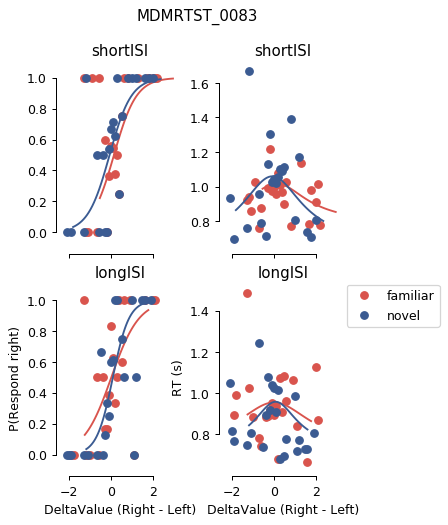

MDMRTST_0084
familiar shortISI thetafood: [ 1.36457928  0.58340208  2.86063344  0.38083842  0.69117947  0.09351008
 -0.13435805  0.          1.00903553]
familiar longISI thetafood: [ 1.53128574  0.5         3.24236632  0.10752539  0.64837539  0.08090361
 -0.2         0.          1.43949845]
novel shortISI thetafood: [ 1.73457807  0.5402288   2.21695001  0.13309679  0.71739407  0.10966024
 -0.19999989  0.          0.9709737 ]
novel longISI thetafood: [ 1.63387418  0.50172448  3.49619337  0.00590841  0.6677351   0.09457106
 -0.13041061  0.          0.80557427]


<Figure size 360x540 with 0 Axes>

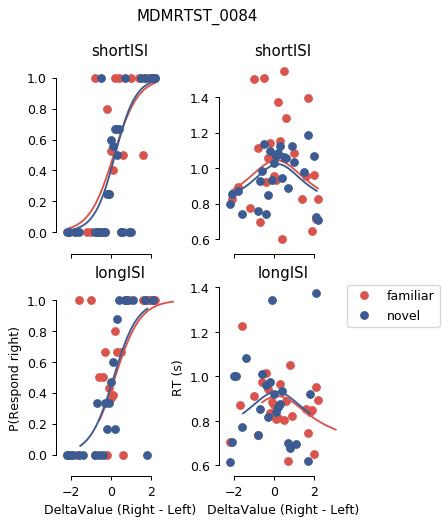

MDMRTST_0085
familiar shortISI thetafood: [ 1.68117104  0.59189032  1.07476797  0.80971903  0.75937952  0.0581008
 -0.10700157  0.          0.84131246]
familiar longISI thetafood: [ 1.74891965  0.522811    0.84057731  0.91933295  0.75259629  0.05202415
 -0.07031551  0.          0.96832974]
novel shortISI thetafood: [ 1.27383915  0.56165846  1.87740786  0.93469836  0.74700166  0.07206125
 -0.07414243  0.          1.36656437]
novel longISI thetafood: [ 0.80562248  0.5         3.44435215  0.42445186  0.76071161  0.06953345
 -0.2         0.          1.19492778]


<Figure size 360x540 with 0 Axes>

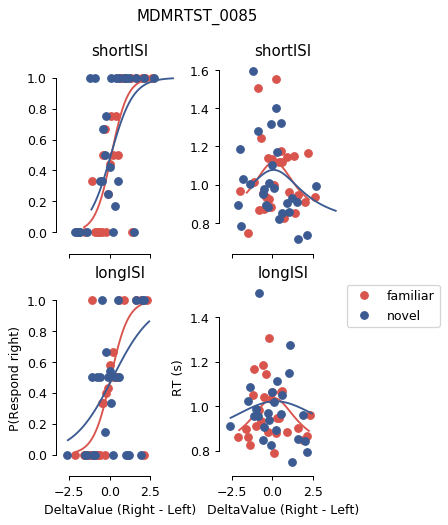

MDMRTST_0086
familiar shortISI thetafood: [ 0.63188111  1.30476172  0.68561039  0.72883556  0.72051866  0.05320981
 -0.13650567  0.          1.22697452]
familiar longISI thetafood: [0.95741651 1.34122575 0.46918269 0.49860052 0.61612505 0.04588553
 0.00593699 0.         0.87323863]
novel shortISI thetafood: [ 0.50564847  1.32102552  0.87377274  0.83451898  0.61416951  0.09569159
 -0.07538189  0.          1.01798066]
novel longISI thetafood: [ 0.88373624  1.44821137  0.69174017  0.61509394  0.55611637  0.01017153
 -0.05410997  0.          1.00611529]


<Figure size 360x540 with 0 Axes>

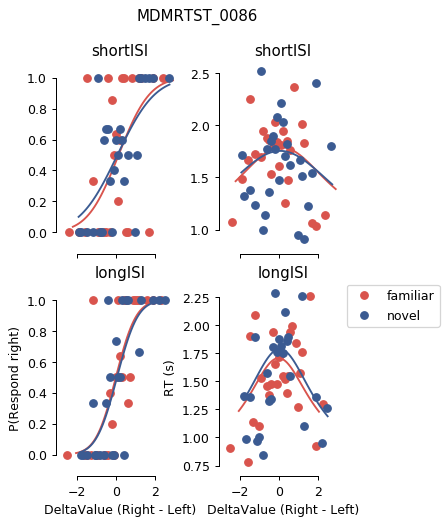

MDMRTST_0088
familiar shortISI thetafood: [ 1.68599471  0.64427816  1.45886318  1.48586132  0.87070932  0.11850616
 -0.14346749  0.          0.74983479]
familiar longISI thetafood: [ 1.18020808  0.5         3.37971875  0.41314823  0.86383639  0.12784607
 -0.2         0.          1.10170232]
novel shortISI thetafood: [ 0.96778059  0.66706361  0.07971733  0.03699603  0.81092612  0.07247079
 -0.19989783  0.          1.12419303]
novel longISI thetafood: [ 0.7250851   0.65458202  3.48089507  0.72972106  0.71453959  0.01749072
 -0.2         0.          1.08883369]


<Figure size 360x540 with 0 Axes>

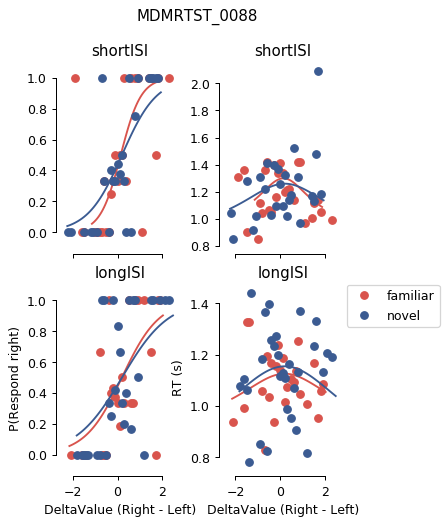

MDMRTST_0089
familiar shortISI thetafood: [ 1.34216004  0.76872093  0.42573613  0.25451112  0.78862044  0.172451
 -0.18908283  0.          0.83951196]
familiar longISI thetafood: [4.21062178e+00 5.70759003e-01 2.10891521e-01 1.20625960e-04
 8.14509229e-01 2.00000000e-01 4.39409942e-02 0.00000000e+00
 8.25635006e-01]
novel shortISI thetafood: [ 1.80281884e+00  6.19758317e-01  1.41273065e-03  9.26684301e-02
  9.13003714e-01  1.99431369e-01 -1.27253114e-01  0.00000000e+00
  6.45383803e-01]
novel longISI thetafood: [1.47858361 0.61756776 0.752879   0.02813117 0.76388577 0.16321552
 0.15505179 0.         0.98380564]


<Figure size 360x540 with 0 Axes>

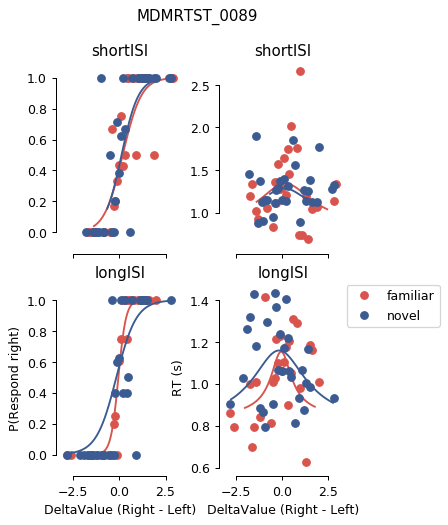

MDMRTST_0091
familiar shortISI thetafood: [ 2.29304668  0.63303327  3.45197593  0.43577137  0.87213147  0.12146381
 -0.11270641  0.          1.25326081]
familiar longISI thetafood: [1.26366585 0.77886141 1.02802302 0.00928352 0.76129215 0.05815316
 0.06647606 0.         1.13906105]
novel shortISI thetafood: [1.86749239 0.75540911 0.89709381 0.84825331 0.85530311 0.13226332
 0.09592294 0.         0.80499098]
novel longISI thetafood: [ 4.67958134  0.69536461  2.2241548   0.61301647  0.84825888  0.13408012
 -0.02110043  0.          0.57732212]


<Figure size 360x540 with 0 Axes>

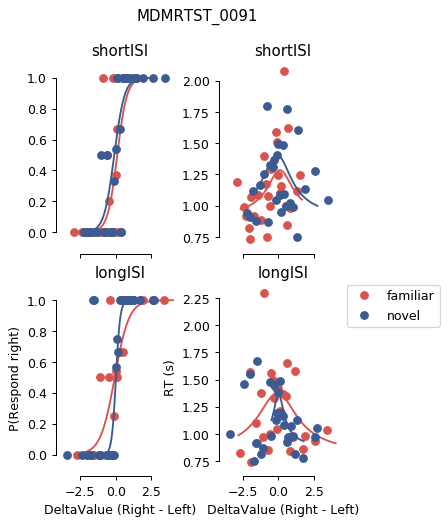

MDMRTST_0092
familiar shortISI thetafood: [ 1.21354022  0.57186257  0.92340536  1.01886625  0.64987464  0.07432491
 -0.12777657  0.          0.84930856]
familiar longISI thetafood: [ 2.04768962e+00  5.69375175e-01  1.28692978e+00  2.91578978e+00
  5.84000000e-01  1.25766730e-10 -1.61903071e-01  0.00000000e+00
  6.65180558e-01]
novel shortISI thetafood: [ 2.05358991  0.5         3.42925592  2.65753872  0.74216172  0.12990392
 -0.2         0.          0.73410374]
novel longISI thetafood: [4.12913803 0.50093094 0.03666636 0.46959961 0.69703717 0.13067533
 0.09152631 0.         0.92611767]


<Figure size 360x540 with 0 Axes>

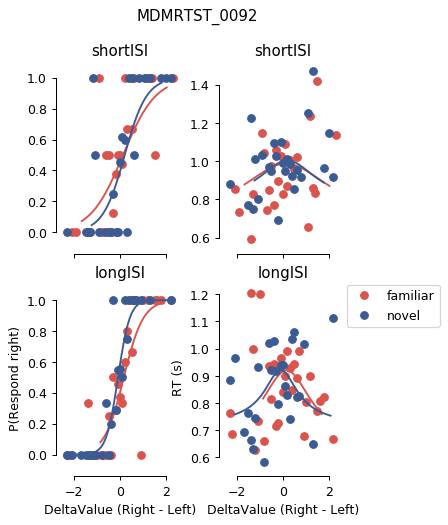

MDMRTST_0094
familiar shortISI thetafood: [ 2.38320483  0.52663162  0.01403893  0.01454841  1.0539043   0.13336866
 -0.0030532   0.          0.85995044]
familiar longISI thetafood: [7.43480085e+00 5.00057578e-01 2.94419149e+00 6.87429960e-01
 1.05158809e+00 1.88125524e-01 1.52982673e-03 0.00000000e+00
 1.38068128e+00]
novel shortISI thetafood: [ 1.37032047  1.04515458  0.40968597  1.29989047  0.72241687  0.01432997
 -0.02893323  0.          0.856544  ]
novel longISI thetafood: [1.91649377 0.63914228 0.34040474 1.17548783 0.92249994 0.17110858
 0.08832858 0.         0.9722773 ]


<Figure size 360x540 with 0 Axes>

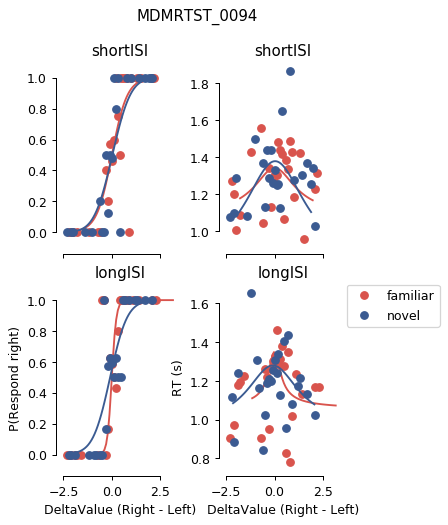

MDMRTST_0095
familiar shortISI thetafood: [ 0.61443341  0.6513885   3.44271961  0.00518663  0.76011264  0.09648685
 -0.2         0.          0.98828843]
familiar longISI thetafood: [ 0.88538082  0.68800038  0.31914245  0.26122034  0.7474079   0.14446834
 -0.11807448  0.          1.09361156]
novel shortISI thetafood: [ 1.13654725  0.67436509  1.54952035  2.99989508  0.7638631   0.14042911
 -0.19999998  0.          0.99665863]
novel longISI thetafood: [ 0.91157101  0.67776167  0.42131651  0.00551192  0.7273933   0.19855981
 -0.15390576  0.          0.72531994]


<Figure size 360x540 with 0 Axes>

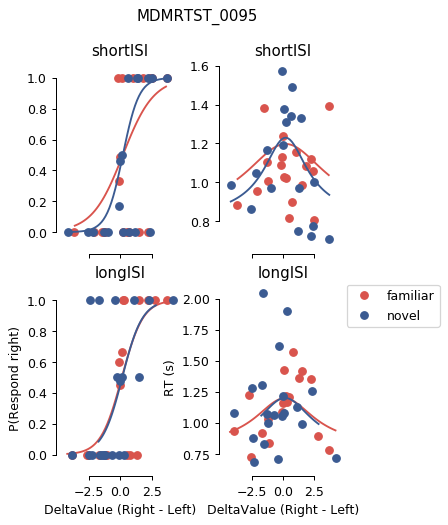

MDMRTST_0097
familiar shortISI thetafood: [ 1.05889455  0.84095571  1.17252008  0.76457883  0.69058193  0.10276067
 -0.01117429  0.          1.02180383]
familiar longISI thetafood: [ 1.08162095  0.87054818  0.00308435  0.29634396  0.71488125  0.15829714
 -0.1596765   0.          0.88079511]
novel shortISI thetafood: [9.34225372e-01 1.20213501e+00 1.08369477e-03 5.08284566e-01
 5.79506634e-01 4.58620921e-04 1.62583026e-01 0.00000000e+00
 8.73756193e-01]
novel longISI thetafood: [ 0.48048819  0.77400827  1.4660579   0.03741887  0.62149539  0.00682316
 -0.01308656  0.          0.80262427]


<Figure size 360x540 with 0 Axes>

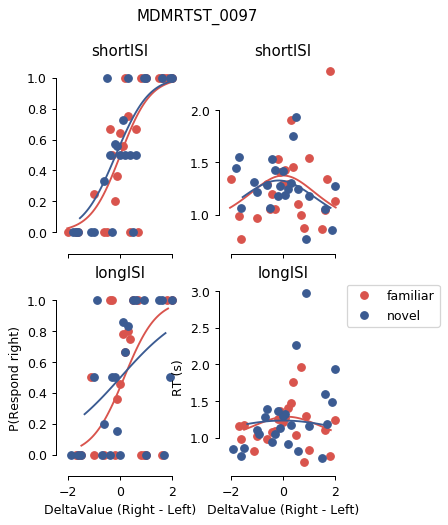

MDMRTST_0098
familiar shortISI thetafood: [0.40156915 0.57008728 2.08753434 2.07189064 0.47662181 0.09977629
 0.12654001 0.         1.35340902]
familiar longISI thetafood: [ 1.58150358  0.5         2.09554552  0.01721528  0.40730763  0.09472785
 -0.10378323  0.          0.98259951]
novel shortISI thetafood: [ 0.84570152  0.59717197  2.21121617  2.99877854  0.48070439  0.1166758
 -0.19924025  0.          0.52459014]
novel longISI thetafood: [ 1.52716939  0.5         2.62664124  0.05025254  0.42895711  0.115757
 -0.2         0.          0.61289837]


<Figure size 360x540 with 0 Axes>

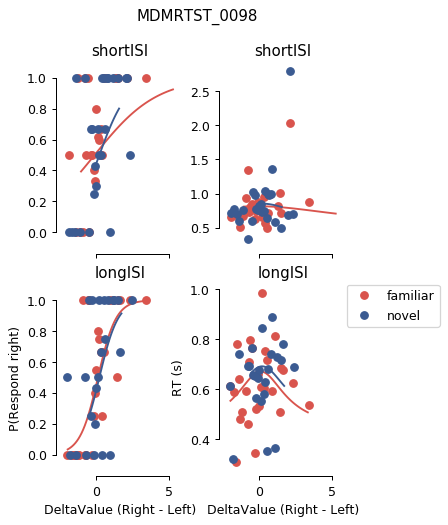

MDMRTST_0100
familiar shortISI thetafood: [ 2.09575859  1.02881997  0.47250273  0.69566984  1.19368143  0.15886195
 -0.0110492   0.          0.74316346]
familiar longISI thetafood: [2.09987468 1.37161675 0.62572173 1.31146096 1.01753738 0.13393635
 0.05348572 0.         0.70231192]
novel shortISI thetafood: [2.9384236  0.84867721 0.87820877 2.08783457 1.37217853 0.19984984
 0.02864251 0.         0.7597699 ]
novel longISI thetafood: [ 2.66864856  1.52999528  0.21900521  0.75492296  1.04658586  0.17896052
 -0.04228396  0.          0.65851277]


<Figure size 360x540 with 0 Axes>

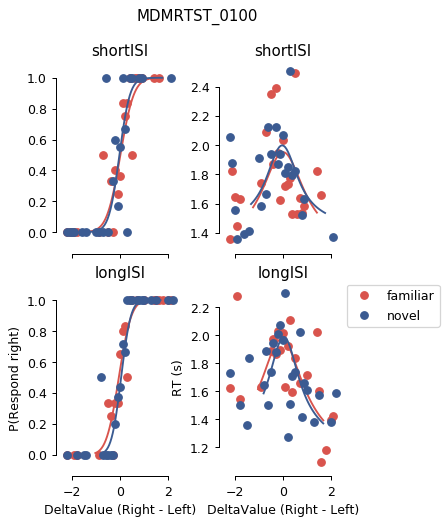

MDMRTST_0104
familiar shortISI thetafood: [7.56816699e-01 1.23757841e+00 7.45591059e-01 1.14054274e+00
 6.45999997e-01 3.58666813e-09 4.80769072e-02 0.00000000e+00
 1.19215295e+00]
familiar longISI thetafood: [1.20557727e+00 8.06409488e-01 1.27679667e+00 6.25833094e-08
 7.79237707e-01 5.06046948e-02 4.50726686e-02 0.00000000e+00
 1.00911830e+00]
novel shortISI thetafood: [ 1.17823008  1.01339865  0.51779277  0.5348848   0.75892294  0.06992571
 -0.07595928  0.          1.30013915]
novel longISI thetafood: [ 1.39904729e+00  7.72839634e-01  8.90997039e-01  5.80992543e-06
  8.79839045e-01  1.06751297e-01 -7.02211307e-02  0.00000000e+00
  8.95458501e-01]


<Figure size 360x540 with 0 Axes>

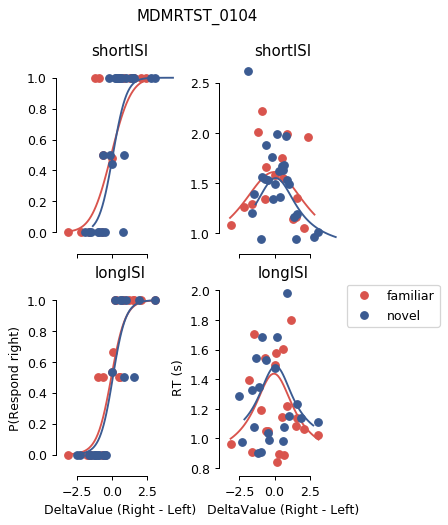

MDMRTST_0105
familiar shortISI thetafood: [ 0.76637219  0.7944894   0.13578112  0.20369325  0.77404097  0.13974458
 -0.0928007   0.          1.45098564]
familiar longISI thetafood: [1.22461682 0.8060162  1.11145411 0.64617318 0.63332528 0.00535618
 0.14550462 0.         1.31054277]
novel shortISI thetafood: [0.70015643 1.00603284 0.51457336 0.38851708 0.47621753 0.08333185
 0.03300355 0.         0.74287131]
novel longISI thetafood: [0.9128058  0.76172852 1.60835027 0.05146101 0.61836491 0.09088635
 0.09802853 0.         1.36609101]


<Figure size 360x540 with 0 Axes>

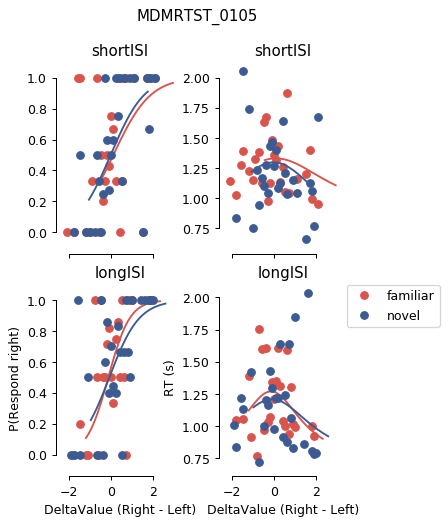

MDMRTST_0106
familiar shortISI thetafood: [9.62954357e-01 1.15108731e+00 1.76735901e+00 2.37213074e+00
 5.75002524e-01 1.71389623e-01 2.02067207e-04 0.00000000e+00
 7.80016822e-01]
familiar longISI thetafood: [ 0.27495379  0.75988415  3.32883881  0.03915389  0.59756879  0.2
 -0.2         0.          1.08551549]
novel shortISI thetafood: [ 0.54975553  1.08883796  0.63615551  0.32551404  0.45711046  0.14941925
 -0.18647455  0.          1.48445895]
novel longISI thetafood: [ 0.80906576  0.90344144  1.44709222  0.75223902  0.46352757  0.02431563
 -0.12703043  0.          0.69770969]


<Figure size 360x540 with 0 Axes>

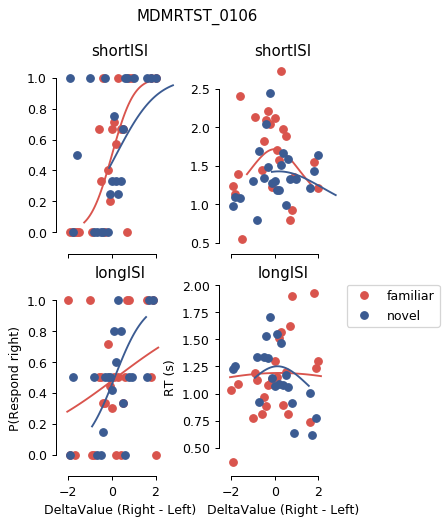

MDMRTST_0107
familiar shortISI thetafood: [0.43221261 0.87771395 1.86025995 2.75309343 0.80831782 0.16525391
 0.1859964  0.         0.97236953]
familiar longISI thetafood: [ 1.89031629e+00  6.22578901e-01  1.99532006e-01  1.35407150e-05
  8.97919197e-01  1.91946494e-01 -8.86614550e-02  0.00000000e+00
  1.45091483e+00]
novel shortISI thetafood: [0.31268617 0.98842489 0.93936604 0.75406374 0.82636888 0.0803152
 0.03918786 0.         1.23527189]
novel longISI thetafood: [ 0.67134131  0.70804017  1.74757517  2.34063656  0.89613835  0.2
 -0.18204004  0.          1.21367143]


<Figure size 360x540 with 0 Axes>

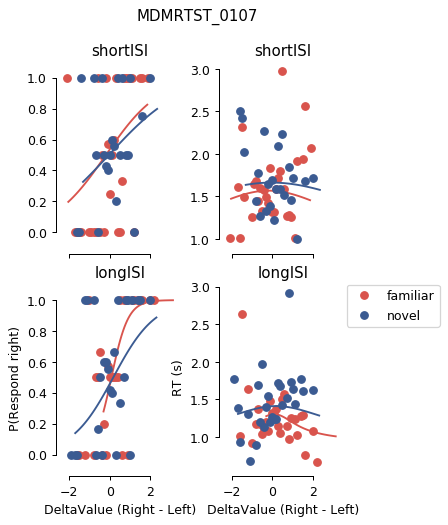

MDMRTST_0108
familiar shortISI thetafood: [ 6.53009287  0.5232587   3.18753826  2.06680543  0.74530183  0.11785388
 -0.03727289  0.          1.39271529]
familiar longISI thetafood: [ 1.60255036  0.62260522  3.49857789  0.69274339  0.66245905  0.06631319
 -0.2         0.          0.99926428]
novel shortISI thetafood: [ 1.60554568  0.6574258   1.06521435  0.01258299  0.68588736  0.11470039
 -0.05421322  0.          1.01043969]
novel longISI thetafood: [ 1.50251171  0.54651819  1.38340807  0.03531372  0.65933215  0.08629262
 -0.19998168  0.          0.73351905]


<Figure size 360x540 with 0 Axes>

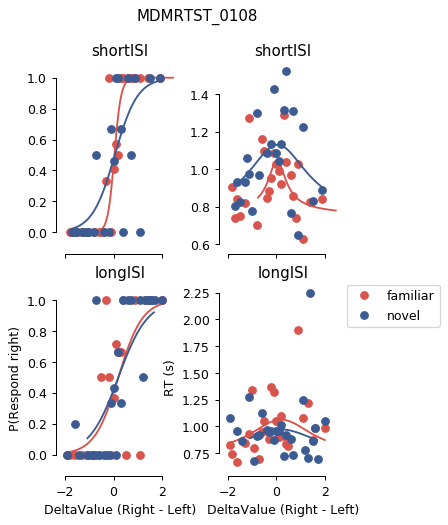

MDMRTST_0109
familiar shortISI thetafood: [ 0.55646338  0.74716381  1.58448887  1.21060283  0.6030304   0.00329451
 -0.02424884  0.          1.28948011]
familiar longISI thetafood: [ 2.96142576  0.69227562  1.29835386  2.58542346  0.7857614   0.16608706
 -0.12483966  0.          1.47408911]
novel shortISI thetafood: [1.20904527 0.66137053 0.80140228 0.21594105 0.88843581 0.19950934
 0.15360704 0.         0.94855447]
novel longISI thetafood: [ 1.01709333e+00  6.10168742e-01  6.99189702e-01  8.12053924e-10
  7.76745161e-01  1.58710825e-01 -7.29087452e-02  0.00000000e+00
  6.88360114e-01]


<Figure size 360x540 with 0 Axes>

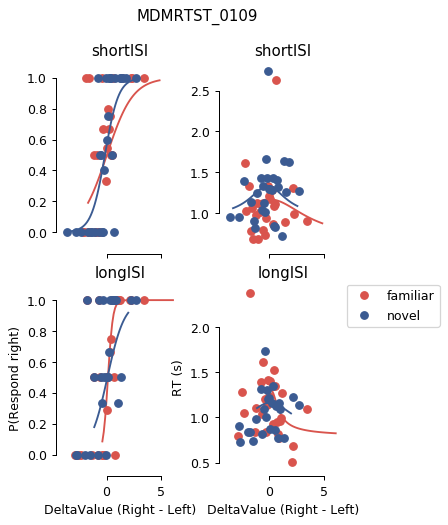

MDMRTST_0112
familiar shortISI thetafood: [ 2.9552474   0.50002416  0.02955136  0.13125594  0.70969647  0.13930649
 -0.07631324  0.          1.43761562]
familiar longISI thetafood: [ 0.82318963  0.5         1.27409331  0.29397478  0.64096667  0.09131821
 -0.2         0.          1.499     ]
novel shortISI thetafood: [1.05039468 0.50244427 0.0405872  0.43095527 0.71220456 0.19588682
 0.09617539 0.         0.87238382]
novel longISI thetafood: [1.60297559 0.62546498 0.00731702 1.03356243 0.61340946 0.09240393
 0.19994868 0.         0.81793586]


<Figure size 360x540 with 0 Axes>

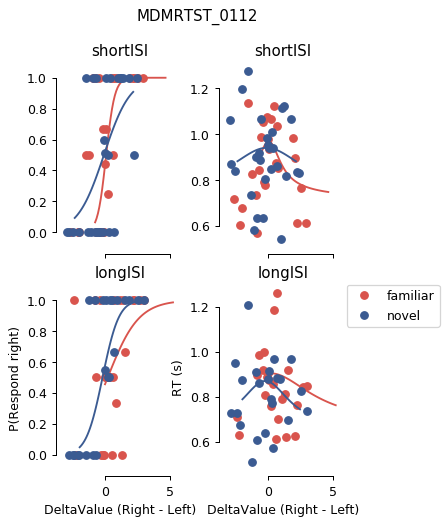

MDMRTST_0113
familiar shortISI thetafood: [1.07859091 0.84196834 0.74669009 0.57877734 0.79635341 0.11859815
 0.07149875 0.         0.85695678]
familiar longISI thetafood: [ 2.50921114  0.7757012   0.02312372  0.30768002  0.91227333  0.10323725
 -0.15970626  0.          0.63063001]
novel shortISI thetafood: [2.33023997 0.58414391 3.49234363 0.21130849 1.02954238 0.2
 0.02208824 0.         0.86027974]
novel longISI thetafood: [ 1.92088492  0.64932999  1.04710778  0.67805258  0.90076607  0.17517915
 -0.17178763  0.          0.87673352]


<Figure size 360x540 with 0 Axes>

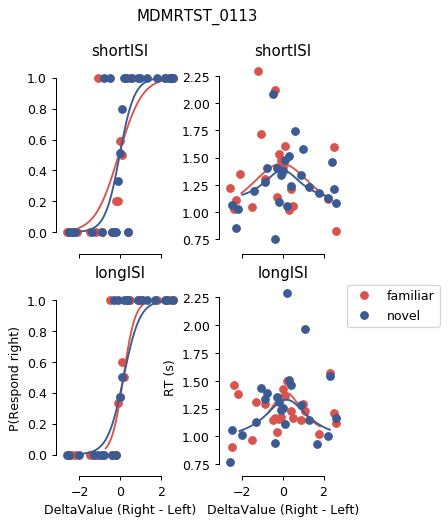

MDMRTST_0114
familiar shortISI thetafood: [2.00880658 0.63018861 3.40130299 0.59085451 0.67911539 0.15985737
 0.00377503 0.         0.67842548]
familiar longISI thetafood: [7.97083124e-01 7.08117268e-01 1.52560670e+00 1.92707405e-06
 5.56824804e-01 5.50608114e-02 9.10343775e-02 0.00000000e+00
 1.29809627e+00]
novel shortISI thetafood: [ 1.25824936  0.57516165  0.71143388  0.09035771  0.67463635  0.15278981
 -0.19850952  0.          1.43052563]
novel longISI thetafood: [ 2.31792218  0.59553312  1.60364779  0.1000894   0.61951826  0.14230038
 -0.06537055  0.          0.65032032]


<Figure size 360x540 with 0 Axes>

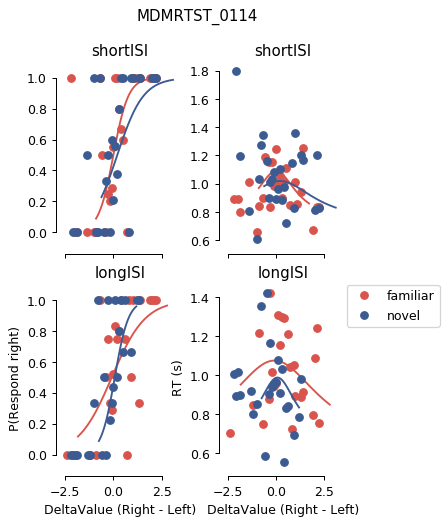

MDMRTST_0115
familiar shortISI thetafood: [ 1.8502959   0.56657317  1.37943825  0.02931763  0.89611751  0.15182207
 -0.04986741  0.          1.31143414]
familiar longISI thetafood: [1.25855013 0.76405218 0.50117415 2.75886903 0.72537985 0.1098634
 0.19452984 0.         0.83205487]
novel shortISI thetafood: [8.91909971e-01 7.53467885e-01 1.01054127e+00 1.88781631e+00
 7.04183877e-01 1.13963005e-03 1.83717432e-01 0.00000000e+00
 1.01821932e+00]
novel longISI thetafood: [8.05201182e-01 7.47197116e-01 1.12262420e+00 5.54873896e-02
 6.20000000e-01 5.26294253e-10 1.52390522e-01 0.00000000e+00
 8.82217171e-01]


<Figure size 360x540 with 0 Axes>

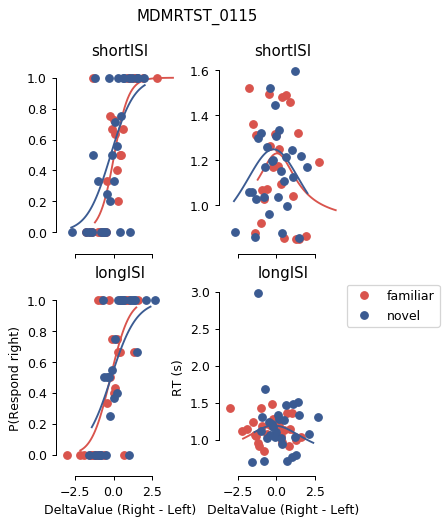

MDMRTST_0116
familiar shortISI thetafood: [ 1.68314323  0.55464326  0.22206165  0.17354354  0.84446718  0.1921752
 -0.19847712  0.          1.31502779]
familiar longISI thetafood: [ 0.90835942  1.28156924  0.00393575  0.94430297  0.39972209  0.01888166
 -0.06270054  0.          1.15853946]
novel shortISI thetafood: [ 1.09479438  0.71032386  0.38700484  0.00317319  0.64673188  0.14302622
 -0.19999894  0.          1.1293517 ]
novel longISI thetafood: [ 1.59668936  0.63520466  0.92400187  1.06513199  0.64404473  0.11882888
 -0.16886979  0.          0.71473631]


<Figure size 360x540 with 0 Axes>

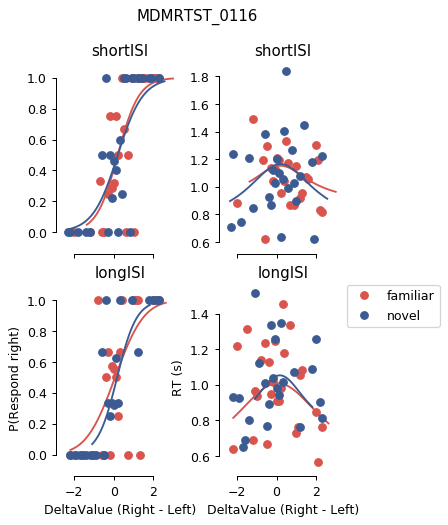

MDMRTST_0118
familiar shortISI thetafood: [0.84910032 1.05908347 0.43355932 0.44903691 0.63811322 0.01676637
 0.01752237 0.         1.06667427]
familiar longISI thetafood: [9.38007207e-01 1.09937015e+00 5.49058082e-01 6.20102325e-01
 6.02500000e-01 1.21144166e-09 1.81132814e-01 0.00000000e+00
 1.31757691e+00]
novel shortISI thetafood: [ 1.0460419   1.18465572  0.33925525  0.65235327  0.54826077  0.00782304
 -0.07654387  0.          0.60840605]
novel longISI thetafood: [1.18962747 1.02945085 1.27069599 0.81510658 0.64043408 0.00909989
 0.06277773 0.         0.71588923]


<Figure size 360x540 with 0 Axes>

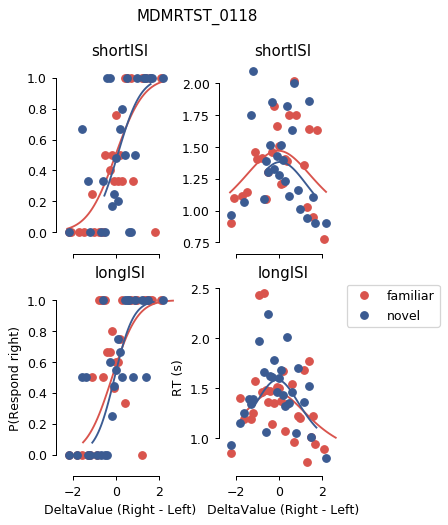

MDMRTST_0119
familiar shortISI thetafood: [0.82892169 1.25830411 0.78847256 1.16498446 0.67331645 0.01609169
 0.13421743 0.         1.02331475]
familiar longISI thetafood: [ 2.60065598  0.81319088  0.62536698  0.64965705  1.02280355  0.19970556
 -0.03202149  0.          1.02962637]
novel shortISI thetafood: [ 0.84753328  1.78970866  0.25320899  0.63917242  0.52009779  0.04885465
 -0.08952328  0.          0.8710953 ]
novel longISI thetafood: [ 1.93906049  3.53343939  0.0675938   1.12029737  0.56188195  0.17632593
 -0.10362917  0.          1.30779676]


<Figure size 360x540 with 0 Axes>

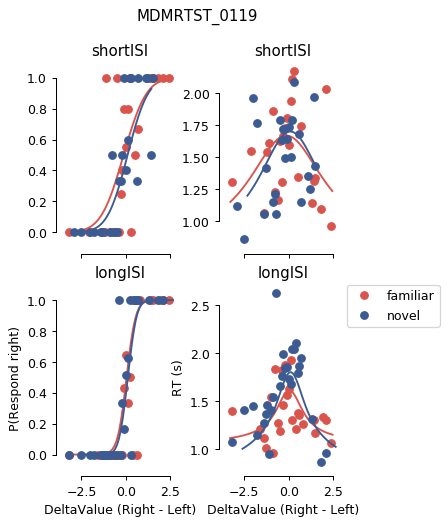

MDMRTST_0120
familiar shortISI thetafood: [ 0.79518628  1.81224956  0.22705248  0.73250364  0.63087953  0.15337666
 -0.19992769  0.          0.87772164]
familiar longISI thetafood: [ 0.90118098  0.76960712  0.63223473  2.96611446  1.09694182  0.1660189
 -0.0408327   0.          0.83629345]
novel shortISI thetafood: [0.53775112 1.08459718 0.38555449 0.54362486 0.94037487 0.16262879
 0.08796025 0.         1.04897055]
novel longISI thetafood: [ 0.9198679   0.71338988  0.64596064  0.85401622  1.11602581  0.17368271
 -0.19221243  0.          1.04214957]


<Figure size 360x540 with 0 Axes>

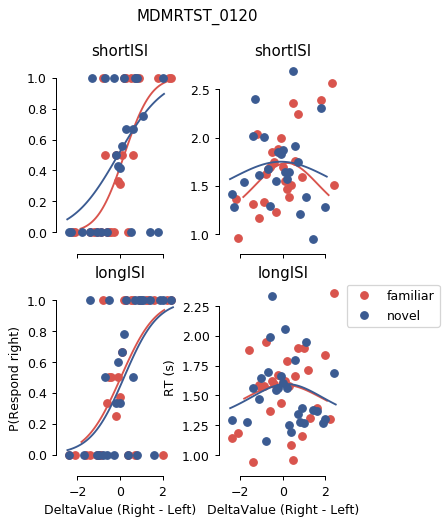

MDMRTST_0121
familiar shortISI thetafood: [1.01289354 0.72137025 1.78973258 0.78045135 0.56992939 0.0579376
 0.14581731 0.         1.38008358]
familiar longISI thetafood: [ 1.12896884  0.57770023  0.47261827  0.04748527  0.60674745  0.15345292
 -0.01707048  0.          1.34411805]
novel shortISI thetafood: [0.84087962 0.5998684  0.33551132 0.00480339 0.64027285 0.11578354
 0.09234887 0.         1.32116668]
novel longISI thetafood: [ 1.67672994e+00  5.26277347e-01  3.21200883e+00  2.24174482e-03
  6.16121310e-01  7.28856355e-02 -9.35597373e-02  0.00000000e+00
  1.37186911e+00]


<Figure size 360x540 with 0 Axes>

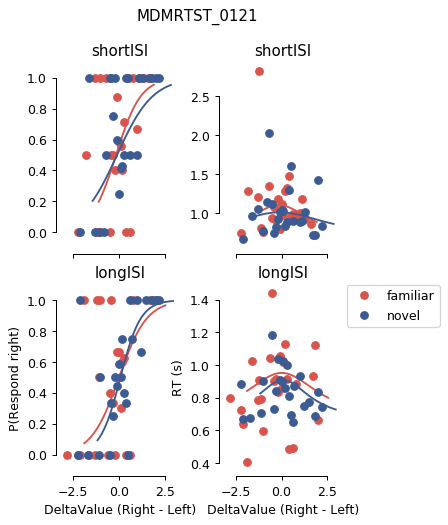

MDMRTST_0123
familiar shortISI thetafood: [ 1.37056097  1.00978934  0.45809391  1.3707753   0.76888846  0.11139705
 -0.00456667  0.          0.90172393]
familiar longISI thetafood: [3.02028164 0.62696464 0.14923736 0.5693287  1.04008318 0.18933579
 0.07176025 0.         0.70555679]
novel shortISI thetafood: [0.5021671  3.6356877  0.07164125 1.28261577 0.3401513  0.04019952
 0.17800684 0.         0.98431063]
novel longISI thetafood: [ 0.80388093  1.05405792  0.56026712  1.00031388  0.62984116  0.01397386
 -0.07336807  0.          1.36285224]


<Figure size 360x540 with 0 Axes>

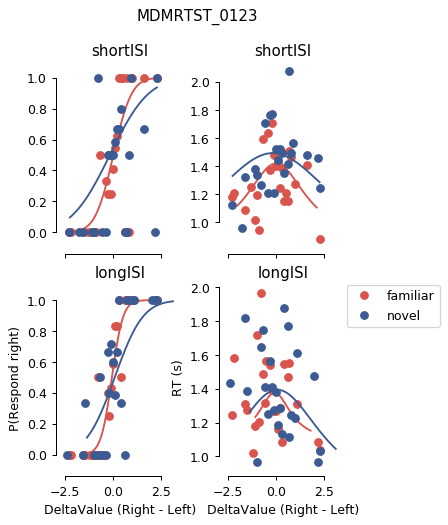

MDMRTST_0124
familiar shortISI thetafood: [ 0.92518514  0.50152459  1.32856052  2.99712227  0.92086963  0.19532795
 -0.0586403   0.          0.79667656]
familiar longISI thetafood: [1.01176739 0.87442919 0.4469991  2.65545554 0.61206732 0.01714268
 0.02539467 0.         1.34399933]
novel shortISI thetafood: [ 0.81306758  0.5         1.9778538   2.1876077   0.90869597  0.2
 -0.2         0.          0.72748296]
novel longISI thetafood: [0.95584421 3.17076165 0.05839731 2.41268034 0.41249607 0.13421774
 0.19807351 0.         1.31079632]


<Figure size 360x540 with 0 Axes>

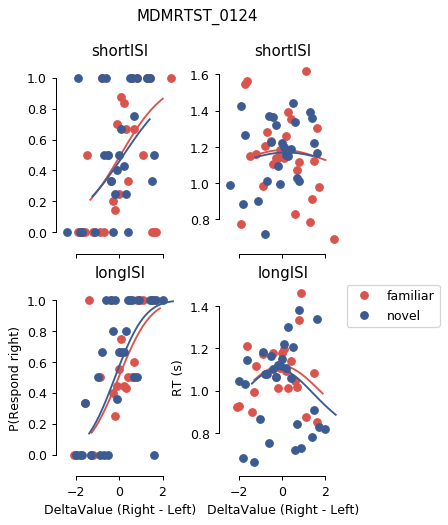

In [15]:
food = pd.read_csv('./output/food_zscoredratings.csv')
subjects = np.unique(food['subjid'])
outputDir = './output'
for subject in subjects:
    plotFoodsubDataWithFit(subject, bindata=True)

In [29]:
def plotFoodDataWithFit(bindata, dt=.0005):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 3) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    theta : 9 element list or array containing the fitted DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    bindata : if True, plots mean with std error bars; if False, plots raw data

    dt : float, temporal resolution, in seconds, to use when propagating
         the stimulus strengths to visualize (for plotting only)

    Returns
    -------

    """
    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors
    
    plt.rcParams['figure.dpi'] = 90
    plt.rcParams['figure.figsize'] = 4, 6
    fig = plt.figure()
    
    colors = {'familiar':'xkcd:pale red', 'novel':'xkcd:denim blue'}
    isiDuration = {'shortISI':0.0,'longISI':2.5}
    
    fig, axs=plt.subplots(2,2, sharey=False, sharex=True)
    
    for sceneStimulusStatus in ['familiar','novel']:
        for ISI in ['shortISI','longISI']:
            
            with open('./output/%s_%s_datafood.pickle'%(sceneStimulusStatus,ISI), 'rb') as handle:
                data = pickle.load(handle)
                
            with open('./output/%s_%s_thetafood.pickle'%(sceneStimulusStatus,ISI), 'rb') as handle:
                theta = pickle.load(handle)
                print sceneStimulusStatus, ISI, "thetafood:", theta
            
            food=pd.read_csv('./output/food_zscoredratings.csv')
            food['deltavalrnd'] = food['deltaval'].round(1)
            food=food.loc[food['sceneStimulusStatus']==sceneStimulusStatus]
            food=food.loc[food['ISI']==isiDuration[ISI]]
            data=np.column_stack([food['deltavalrnd'],food['RT'],food['choseright'],food['subjid'],food['deltaval']])
            
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
            stim_strengths, rt, ci, subj = data[:, 0], data[:, 1], data[:, 2], data[:, 3]

            stim_strengths = stim_strengths.astype("complex") ** plaw
            ustim_strengths = np.unique(stim_strengths)
            stim_strengths_to_propagate = np.linspace(
                np.min(ustim_strengths), np.max(ustim_strengths), 51)
            
            drifts, t, Bup, Blo, y, yinit = discretize(
                theta, stim_strengths_to_propagate, np.max(rt), dt)
            
            D = propagate(drifts, t, Bup, Blo, y, yinit)
            
            df=pd.DataFrame(data,columns=['stim_strength','rt','ci','subj','deltaval'])
            df['ci']=df['ci'].astype('bool')
            df['rt']=df['rt'].astype('float64')
            df['stim_strength']=stim_strengths

            dfsorted=df.sort_values('deltaval', ascending=True)

            #running mean of choices
            meanprop = pd.Series.rolling(dfsorted['ci'],10,min_periods=1).mean()

            # predicted proportions
            predprop = D['up']['p'][:]

            #chose right or chose left
            cr=dfsorted[dfsorted['ci']==1]
            cl=dfsorted[dfsorted['ci']==0]

            #running mean of rt
            meanrt_lo = pd.Series.rolling(cl['rt'],10,min_periods=1).mean()
            meanrt_up = pd.Series.rolling(cr['rt'],10,min_periods=1).mean()
            meanrt_both = pd.Series.rolling(dfsorted['rt'],10,min_periods=1).mean()

            predrt_up = D['up']['mean_t'][0] + tnd
            predrt_lo = D['lo']['mean_t'][0] + tnd
            predrt_both=D['both']['mean_t'][0] + tnd


            horz_index = {'shortISI':0,'longISI':1}
            vert_index = {'choices':0,'RT':1}
            
            h = horz_index[ISI]
            for plotType in vert_index.keys():
                v = vert_index[plotType]
                
                if plotType == 'choices':
                    if bindata:
                        datafoodpath='./output/%s_%s_datafood.pickle'%(sceneStimulusStatus,ISI)
                        meanbindata, stdbindata = get_binned_data(datafoodpath)
                        axs[h,v].plot(meanbindata['DeltaRnd'].values,meanbindata['Choice'].values,'o',color=colors[sceneStimulusStatus])
                    else: 
                        axs[h,v].add_line(
                            plt.Line2D(dfsorted['deltaval'], meanprop, color=colors[sceneStimulusStatus]))
                    axs[h,v].add_line(
                        plt.Line2D(stim_strengths_to_propagate, predprop, color=colors[sceneStimulusStatus]))
                    axs[h,v].set_ylim(-0.10, 1.10)
                    axs[h,v].set_title(ISI)
                else:
                    if bindata:
                        datafoodpath='./output/%s_%s_datafood.pickle'%(sceneStimulusStatus,ISI)
                        meanbindata, stdbindata = get_binned_data(datafoodpath)
                        axs[h,v].plot(meanbindata['DeltaRnd'].values,meanbindata['RT'].values,'o',color=colors[sceneStimulusStatus], label=sceneStimulusStatus)
                    else:
                        axs[h,v].add_line(
                        plt.Line2D(dfsorted['deltaval'], meanrt_both, color=colors[sceneStimulusStatus], label=sceneStimulusStatus))
                    axs[h,v].add_line(plt.Line2D(
                        stim_strengths_to_propagate, predrt_both,
                        color=colors[sceneStimulusStatus], marker='None'))
                    
                    axs[h,v].set_title(ISI)
    
    axs[1,0].set_ylabel('P(Respond right)')
    axs[1,0].set_xlabel('DeltaValue (Right - Left)')       
    axs[1,1].set_ylabel('RT (s)')
    axs[1,1].set_xlabel('DeltaValue (Right - Left)')
    
    sns.despine(offset=5, trim=True)
    fig.subplots_adjust(hspace=0.2,wspace=0.4)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)

    plt.show()

In [ ]:
plotFoodDataWithFit(bindata=False, dt=.0005)

## 2 way interaction

### Short ISI

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: choseright ~ deltaval * sceneStimulusStatus + (1 | subjid)
   Data: food

     AIC      BIC   logLik deviance df.resid 
 15144.1  15181.3  -7567.0  15134.1    12588 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-22.756  -0.933  -0.146   0.951  35.879 

Random effects:
 Groups Name        Variance Std.Dev.
 subjid (Intercept) 0.01567  0.1252  
Number of obs: 12593, groups:  subjid, 80

Fixed effects:
                                  Estimate Std. Error z value Pr(>|z|)    
(Intercept)                       -0.02390    0.03097  -0.772    0.440    
deltaval                           1.57469    0.06014  26.184   <2e-16 ***
sceneStimulusStatusnovel           0.01030    0.03896   0.264    0.791    
deltaval:sceneStimulusStatusnovel -0.09211    0.08302  -1.109    0.267    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correl

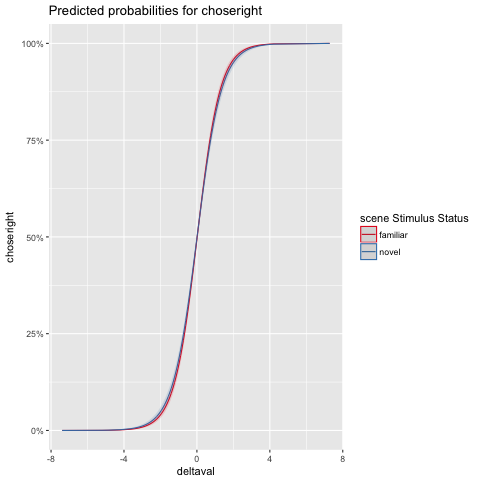

In [29]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/shortISI_food_zscoredratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)

foodchmod=glmer(choseright ~ deltaval * sceneStimulusStatus + (1|subjid), family='binomial', data=food)
print(summary(foodchmod))
plot_model(foodchmod,type='eff',show.ci=T, show.values=T,p.kr=FALSE, terms=c('deltaval','sceneStimulusStatus'))


Linear mixed model fit by REML ['lmerMod']
Formula: RT ~ absdeltaval * sceneStimulusStatus + (1 | subjid)
   Data: food

REML criterion at convergence: 184820.1

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.2208 -0.6557 -0.1516  0.4920  5.7530 

Random effects:
 Groups   Name        Variance Std.Dev.
 subjid   (Intercept)  45842   214.1   
 Residual             135335   367.9   
Number of obs: 12593, groups:  subjid, 80

Fixed effects:
                                     Estimate Std. Error t value
(Intercept)                          1296.070     24.625   52.63
absdeltaval                           -85.158      7.461  -11.41
sceneStimulusStatusnovel                3.616      8.179    0.44
absdeltaval:sceneStimulusStatusnovel   -5.445     10.544   -0.52

Correlation of Fixed Effects:
            (Intr) absdlt scnStS
absdeltaval -0.140              
scnStmlsStt -0.166  0.421       
absdltvl:SS  0.099 -0.707 -0.598


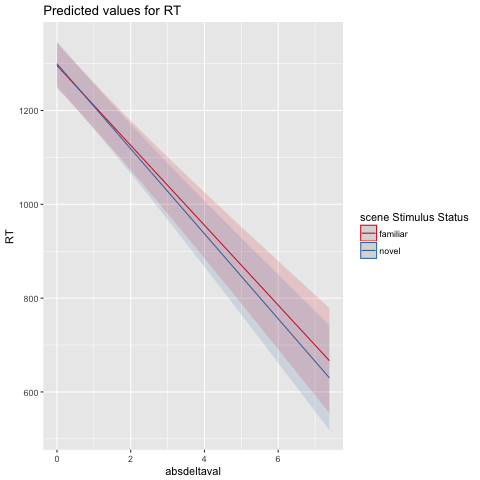

In [30]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/shortISI_food_zscoredratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)

foodrtmod=lmer(RT ~ absdeltaval * sceneStimulusStatus + (1|subjid), data=food)
print(summary(foodrtmod))
plot_model(foodrtmod,type='eff',show.ci=T, show.values=T,p.kr=FALSE,terms=c('absdeltaval','sceneStimulusStatus'))


In [31]:
food=pd.read_csv(_thisDir + '/output/shortISI_food_zscoredratings.csv')
# RT mixed effects linear model
food=food.assign(absdeltaval=food['deltaval'].abs())
food['choseright']=food['choseright'].values.astype('int')

foodmd = smf.mixedlm('RT ~ absdeltaval * sceneStimulusStatus', food, groups=food['subjid'])
foodmdf = foodmd.fit()
print(foodmdf.summary())

                           Mixed Linear Model Regression Results
Model:                        MixedLM            Dependent Variable:            RT         
No. Observations:             12593              Method:                        REML       
No. Groups:                   80                 Scale:                         135334.7330
Min. group size:              136                Likelihood:                    -92410.0536
Max. group size:              160                Converged:                     Yes        
Mean group size:              157.4                                                        
-------------------------------------------------------------------------------------------
                                           Coef.   Std.Err.    z    P>|z|  [0.025   0.975] 
-------------------------------------------------------------------------------------------
Intercept                                 1296.070   24.625  52.631 0.000 1247.805 1344.335
sceneStimulusSt

### Long ISI

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: choseright ~ deltaval * sceneStimulusStatus + (1 | subjid)
   Data: food

     AIC      BIC   logLik deviance df.resid 
 15127.7  15164.9  -7558.8  15117.7    12644 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-7.4346 -0.9398 -0.1224  0.9491  7.8336 

Random effects:
 Groups Name        Variance Std.Dev.
 subjid (Intercept) 0.01141  0.1068  
Number of obs: 12649, groups:  subjid, 80

Fixed effects:
                                   Estimate Std. Error z value Pr(>|z|)    
(Intercept)                       -0.012357   0.029994  -0.412    0.680    
deltaval                           1.549687   0.059213  26.171   <2e-16 ***
sceneStimulusStatusnovel          -0.007805   0.038985  -0.200    0.841    
deltaval:sceneStimulusStatusnovel  0.029094   0.084086   0.346    0.729    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

C

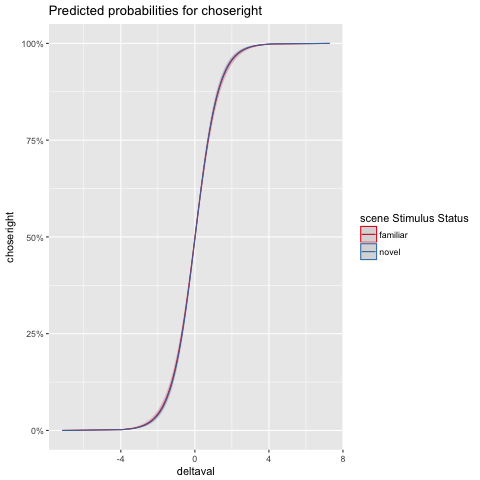

In [32]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/longISI_food_zscoredratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)

foodchmod=glmer(choseright ~ deltaval * sceneStimulusStatus + (1|subjid), family='binomial', data=food)
print(summary(foodchmod))
plot_model(foodchmod,type='eff',show.ci=T, show.values=T,p.kr=FALSE, terms=c('deltaval','sceneStimulusStatus'))


Linear mixed model fit by REML ['lmerMod']
Formula: RT ~ absdeltaval * sceneStimulusStatus + (1 | subjid)
   Data: food

REML criterion at convergence: 183769.2

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.9002 -0.6636 -0.1488  0.4896  5.7984 

Random effects:
 Groups   Name        Variance Std.Dev.
 subjid   (Intercept)  46699   216.1   
 Residual             116593   341.5   
Number of obs: 12649, groups:  subjid, 80

Fixed effects:
                                     Estimate Std. Error t value
(Intercept)                          1231.374     24.751   49.75
absdeltaval                           -90.456      6.963  -12.99
sceneStimulusStatusnovel                5.188      7.600    0.68
absdeltaval:sceneStimulusStatusnovel   -2.892      9.809   -0.29

Correlation of Fixed Effects:
            (Intr) absdlt scnStS
absdeltaval -0.130              
scnStmlsStt -0.153  0.424       
absdltvl:SS  0.093 -0.709 -0.601


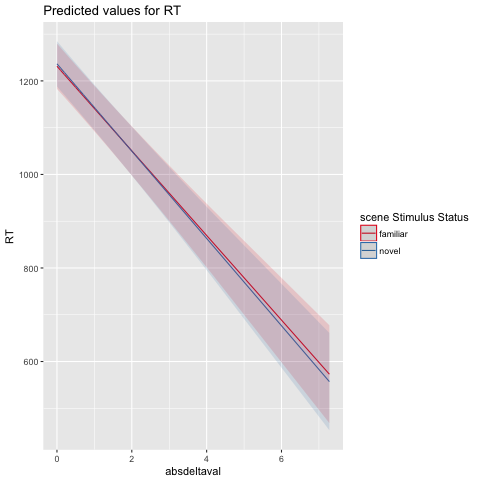

In [33]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/longISI_food_zscoredratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)

foodrtmod=lmer(RT ~ absdeltaval * sceneStimulusStatus + (1|subjid), data=food)
print(summary(foodrtmod))
plot_model(foodrtmod,type='eff',show.ci=T, show.values=T,p.kr=FALSE,terms=c('absdeltaval','sceneStimulusStatus'))


In [34]:
food=pd.read_csv(_thisDir + '/output/longISI_food_zscoredratings.csv')
# RT mixed effects linear model
food=food.assign(absdeltaval=food['deltaval'].abs())
food['choseright']=food['choseright'].values.astype('int')

foodmd = smf.mixedlm('RT ~ absdeltaval * sceneStimulusStatus', food, groups=food['subjid'])
foodmdf = foodmd.fit()
print(foodmdf.summary())

                           Mixed Linear Model Regression Results
Model:                        MixedLM            Dependent Variable:            RT         
No. Observations:             12649              Method:                        REML       
No. Groups:                   80                 Scale:                         116592.7479
Min. group size:              147                Likelihood:                    -91884.5792
Max. group size:              160                Converged:                     Yes        
Mean group size:              158.1                                                        
-------------------------------------------------------------------------------------------
                                           Coef.   Std.Err.    z    P>|z|  [0.025   0.975] 
-------------------------------------------------------------------------------------------
Intercept                                 1231.374   24.752  49.749 0.000 1182.862 1279.886
sceneStimulusSt

## 3 way interaction

### All trials

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: choseright ~ deltaval * sceneStimulusStatus * ISI + (1 | subjid)
   Data: food

     AIC      BIC   logLik deviance df.resid 
 30254.5  30327.7 -15118.2  30236.5    25233 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-22.609  -0.931  -0.133   0.946  36.153 

Random effects:
 Groups Name        Variance Std.Dev.
 subjid (Intercept) 0.01651  0.1285  
Number of obs: 25242, groups:  subjid, 80

Fixed effects:
                                       Estimate Std. Error z value Pr(>|z|)    
(Intercept)                           -0.024081   0.031146  -0.773    0.439    
deltaval                               1.574064   0.060081  26.199   <2e-16 ***
sceneStimulusStatusnovel               0.010540   0.038964   0.270    0.787    
ISI                                    0.004838   0.015602   0.310    0.756    
deltaval:sceneStimulusStatusnovel     -0.09

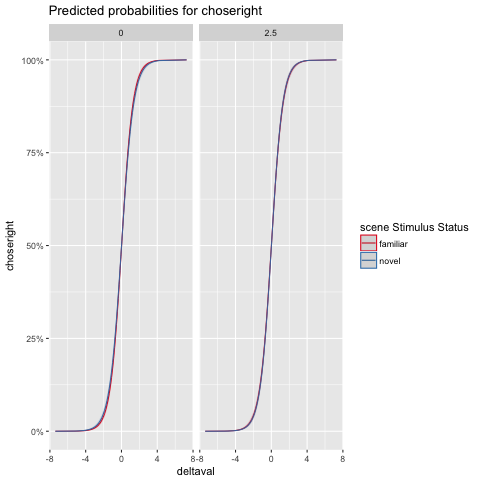

In [35]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/food_zscoredratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)

foodchmod=glmer(choseright ~ deltaval * sceneStimulusStatus * ISI + (1|subjid), family='binomial', data=food)
print(summary(foodchmod))
plot_model(foodchmod,type='eff',show.ci=T, show.values=T,p.kr=FALSE, terms=c('deltaval','sceneStimulusStatus','ISI'))


Linear mixed model fit by REML ['lmerMod']
Formula: RT ~ absdeltaval * sceneStimulusStatus * ISI + (1 | subjid)
   Data: food

REML criterion at convergence: 368526.6

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.0647 -0.6609 -0.1525  0.4905  6.1177 

Random effects:
 Groups   Name        Variance Std.Dev.
 subjid   (Intercept)  45560   213.4   
 Residual             126593   355.8   
Number of obs: 25242, groups:  subjid, 80

Fixed effects:
                                          Estimate Std. Error t value
(Intercept)                              1295.4897    24.5094   52.86
absdeltaval                               -84.8433     7.2136  -11.76
sceneStimulusStatusnovel                    3.8225     7.9107    0.48
ISI                                       -25.5270     3.1626   -8.07
absdeltaval:sceneStimulusStatusnovel       -5.6994    10.1974   -0.56
absdeltaval:ISI                            -2.3633     4.0905   -0.58
sceneStimulusStatusnovel:ISI                0.

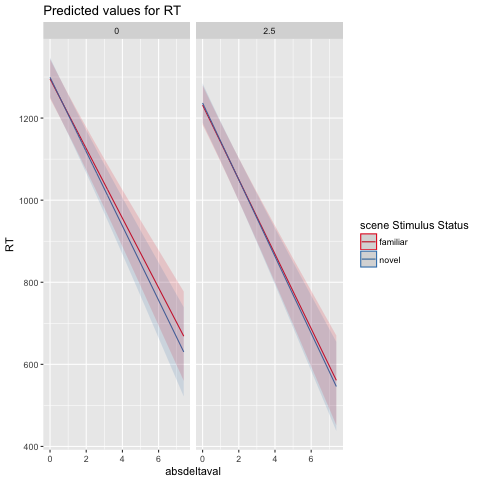

In [36]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/food_zscoredratings.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)

foodrtmod=lmer(RT ~ absdeltaval * sceneStimulusStatus * ISI + (1|subjid), data=food)
print(summary(foodrtmod))
plot_model(foodrtmod,type='eff',show.ci=T, show.values=T,p.kr=FALSE,terms=c('absdeltaval','sceneStimulusStatus','ISI'))


In [37]:
food=pd.read_csv(_thisDir + '/output/food_zscoredratings.csv')
# RT mixed effects linear model
food=food.assign(absdeltaval=food['deltaval'].abs())
food['choseright']=food['choseright'].values.astype('int')

foodmd = smf.mixedlm('RT ~ absdeltaval * sceneStimulusStatus * ISI', food, groups=food['subjid'])
foodmdf = foodmd.fit()
print(foodmdf.summary())

                             Mixed Linear Model Regression Results
Model:                         MixedLM             Dependent Variable:             RT          
No. Observations:              25560               Method:                         REML        
No. Groups:                    81                  Scale:                          127199.0163 
Min. group size:               284                 Likelihood:                     -186645.7721
Max. group size:               320                 Converged:                      Yes         
Mean group size:               315.6                                                           
-----------------------------------------------------------------------------------------------
                                               Coef.   Std.Err.    z    P>|z|  [0.025   0.975] 
-----------------------------------------------------------------------------------------------
Intercept                                     1299.667   24.357  53.3

### Trials where scene may not have been seen (page was out of focus) are excluded

Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: choseright ~ deltaval * sceneStimulusStatus * ISI + (1 | subjid)
   Data: food

     AIC      BIC   logLik deviance df.resid 
 30093.7  30166.9 -15037.8  30075.7    25108 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-23.008  -0.931  -0.133   0.947  36.849 

Random effects:
 Groups Name        Variance Std.Dev.
 subjid (Intercept) 0.01603  0.1266  
Number of obs: 25117, groups:  subjid, 80

Fixed effects:
                                       Estimate Std. Error z value Pr(>|z|)    
(Intercept)                           -0.025839   0.031121  -0.830    0.406    
deltaval                               1.573466   0.060222  26.128   <2e-16 ***
sceneStimulusStatusnovel               0.012648   0.039065   0.324    0.746    
ISI                                    0.004266   0.015642   0.273    0.785    
deltaval:sceneStimulusStatusnovel     -0.08

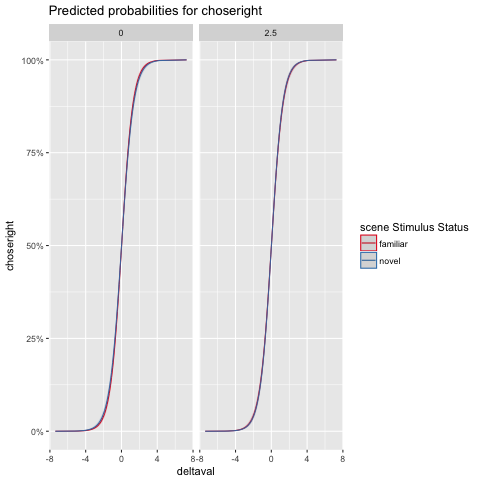

In [37]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/food_zscoredratings_withoutscene.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)

foodchmod=glmer(choseright ~ deltaval * sceneStimulusStatus * ISI + (1|subjid), family='binomial', data=food)
print(summary(foodchmod))
plot_model(foodchmod,type='eff',show.ci=T, show.values=T,p.kr=FALSE, terms=c('deltaval','sceneStimulusStatus','ISI'))


Linear mixed model fit by REML ['lmerMod']
Formula: RT ~ absdeltaval * sceneStimulusStatus * ISI + (1 | subjid)
   Data: food

REML criterion at convergence: 366524.9

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.0785 -0.6610 -0.1529  0.4917  6.1397 

Random effects:
 Groups   Name        Variance Std.Dev.
 subjid   (Intercept)  45546   213.4   
 Residual             125697   354.5   
Number of obs: 25117, groups:  subjid, 80

Fixed effects:
                                          Estimate Std. Error t value
(Intercept)                              1293.7477    24.5049   52.80
absdeltaval                               -84.2832     7.2035  -11.70
sceneStimulusStatusnovel                    4.1878     7.8997    0.53
ISI                                       -24.8399     3.1586   -7.86
absdeltaval:sceneStimulusStatusnovel       -5.9235    10.1808   -0.58
absdeltaval:ISI                            -2.3854     4.0832   -0.58
sceneStimulusStatusnovel:ISI                0.

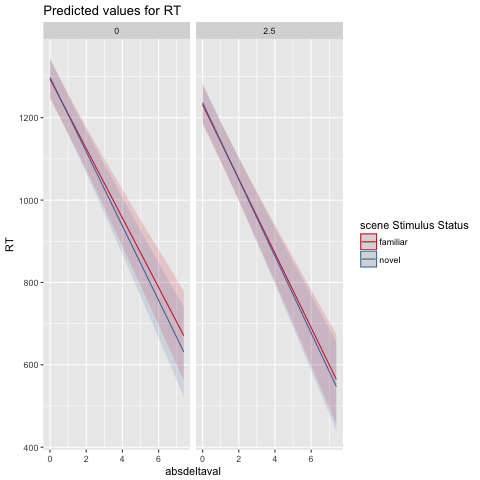

In [38]:
%%R 
library(readr)
library(lme4)
library(sjPlot)
thisDir=getwd()
outputDir <- paste(thisDir, '/output', sep='')
foodFileName <- paste(outputDir, '/food_zscoredratings_withoutscene.csv', sep='')

food=read.table(foodFileName,header=T,sep=",")
food$absdeltaval=abs(food$deltaval)

foodrtmod=lmer(RT ~ absdeltaval * sceneStimulusStatus * ISI + (1|subjid), data=food)
print(summary(foodrtmod))
plot_model(foodrtmod,type='eff',show.ci=T, show.values=T,p.kr=FALSE,terms=c('absdeltaval','sceneStimulusStatus','ISI'))


In [39]:
food=pd.read_csv(_thisDir + '/output/food_zscoredratings_withoutscene.csv')
# RT mixed effects linear model
food=food.assign(absdeltaval=food['deltaval'].abs())
food['choseright']=food['choseright'].values.astype('int')

foodmd = smf.mixedlm('RT ~ absdeltaval * sceneStimulusStatus * ISI', food, groups=food['subjid'])
foodmdf = foodmd.fit()
print(foodmdf.summary())

                             Mixed Linear Model Regression Results
Model:                         MixedLM             Dependent Variable:             RT          
No. Observations:              25117               Method:                         REML        
No. Groups:                    80                  Scale:                          125696.4082 
Min. group size:               231                 Likelihood:                     -183262.4510
Max. group size:               320                 Converged:                      Yes         
Mean group size:               314.0                                                           
-----------------------------------------------------------------------------------------------
                                               Coef.   Std.Err.    z    P>|z|  [0.025   0.975] 
-----------------------------------------------------------------------------------------------
Intercept                                     1293.748   24.521  52.7

## Dynamic trial analyses 

In [40]:
# probability of choosing item if context of last trial with this stim was familiar/novel 
# AND if current trial is familiar/novel AND if item was chosen on previous trial with this stim
food=pd.read_csv(_thisDir + '/output/food_zscoredratings.csv')
subs=np.unique(food['subjid'].values)
df_4dim=pd.DataFrame()

for sub in subs:
    # stimulus name is key, value is index of last trial in which the stimulus was show
    prevStimIndex = {}
    # stimulus name is key, value is boolean that is true if last time item was presented, it was on the right
    prevStimOnRight = {}
    
    subdf=food.loc[food['subjid']==sub]
    trialIndices=subdf.index.values # index in the food df, not actual trial numbers
    #print subdf

    for indexN in trialIndices:
        trial=subdf.loc[indexN,:]
        prevLeftImageIndex=-1
        prevRightImageIndex=-1
        # get trial index of last trial in which image left/right was presented
        if trial['ImageLeft'] in prevStimIndex.keys():
            prevLeftImageIndex = prevStimIndex[trial['ImageLeft']]
        if trial['ImageRight'] in prevStimIndex.keys():
            prevRightImageIndex = prevStimIndex[trial['ImageRight']]

        # check the sceneStimulusStatus of the last trial in which image left/right was presented
        for i in range(0,2):
            checkLeft = True
            prevImageIndex = prevLeftImageIndex
            if i == 1:
                checkLeft = False
                prevImageIndex = prevRightImageIndex
            
            # checking for ImageLeft
            if checkLeft and prevLeftImageIndex != -1:
                prevContext = subdf.loc[prevLeftImageIndex,'sceneStimulusStatus']
                choseItem = subdf.loc[indexN,'choseright'] == False
                choseRightOnPrevTrial = subdf.loc[prevLeftImageIndex,'choseright']
                if choseRightOnPrevTrial and prevStimOnRight[trial['ImageLeft']]: 
                    # chose right on prev trial and image was presented on right
                    choseItemOnPrevTrial = True
                elif not choseRightOnPrevTrial and not prevStimOnRight[trial['ImageLeft']]:
                    # chose left on prev trial and image was presented on left
                    choseItemOnPrevTrial = True
                else:
                    choseItemOnPrevTrial = False
                    
             # checking for ImageRight
            if not checkLeft and prevRightImageIndex != -1:
                prevContext = subdf.loc[prevRightImageIndex,'sceneStimulusStatus']
                choseItem = subdf.loc[indexN,'choseright'] == True
                if choseRightOnPrevTrial and prevStimOnRight[trial['ImageRight']]: 
                    # chose right on prev trial and image was presented on right
                    choseItemOnPrevTrial = True
                elif not choseRightOnPrevTrial and not prevStimOnRight[trial['ImageRight']]:
                    # chose left on prev trial and image was presented on left
                    choseItemOnPrevTrial = True
                else:
                    choseItemOnPrevTrial = False
            
            if prevImageIndex != -1:
                # store info in df_4dim dataframe
                prevDelta = subdf.loc[prevImageIndex,'deltaval']
                currDelta = subdf.loc[indexN,'deltaval']
                currRT = subdf.loc[indexN,'RT']
                trialData = {'subjid':sub,'Prev_context':prevContext, 'Curr_context':trial['sceneStimulusStatus'], 'Chose_item_on_prev_trial':choseItemOnPrevTrial, 'Chose_item_on_curr_trial':choseItem, 'Curr_RT':currRT, 'Prev_deltaval':prevDelta, 'Curr_deltaval':currDelta}
                df_4dim=df_4dim.append(trialData,ignore_index=True)
                

        # set prevStimIndex with value of current index for ImageLeft and ImageRight of current trial
        prevStimIndex[trial['ImageLeft']]=indexN
        prevStimIndex[trial['ImageRight']]=indexN
        
        prevStimOnRight[trial['ImageLeft']]=False
        prevStimOnRight[trial['ImageRight']]=True
        
df_4dim.to_csv(_thisDir + '/output/dynamic_trial_data.csv')

In [41]:
print df_4dim.columns

Index([u'Chose_item_on_curr_trial', u'Chose_item_on_prev_trial', u'Curr_RT',
       u'Curr_context', u'Curr_deltaval', u'Prev_context', u'Prev_deltaval',
       u'subjid'],
      dtype='object')


In [42]:
dynamic_trial_data = pd.read_csv(_thisDir + '/output/dynamic_trial_data.csv')

In [43]:
dynamic_trial_data.columns

Index([u'Unnamed: 0', u'Chose_item_on_curr_trial', u'Chose_item_on_prev_trial',
       u'Curr_RT', u'Curr_context', u'Curr_deltaval', u'Prev_context',
       u'Prev_deltaval', u'subjid'],
      dtype='object')

In [44]:
dynamic_trial_data.columns = ['Unnamed: 0', 'P(Choosing item)', 'Chose item on prev trial',
       'Curr RT', 'Curr context', 'Curr deltaval', 'Previous context',
       'Previous deltaval', 'subjid']

In [45]:
df_4dim = dynamic_trial_data

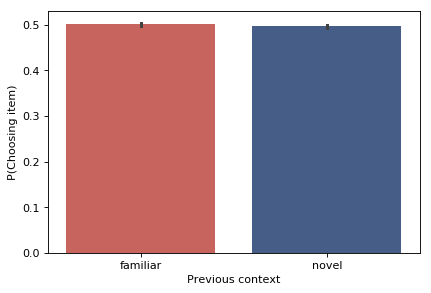

In [58]:
plt.rcParams['figure.figsize'] = 6, 4
plt.rcParams['figure.dpi'] = 80
fig = plt.figure()
colors=[sns.xkcd_rgb["pale red"],sns.xkcd_rgb["denim blue"]]
ax = sns.barplot(x="Previous context", y="P(Choosing item)", data=df_4dim, order=['familiar','novel'], palette=colors, ci=68)
#ax.set_title('')
plt.show()

In [59]:
print 'N trials:'
print df_4dim.groupby(['Previous context'])['P(Choosing item)'].count()

tmp=df_4dim.groupby(['subjid','Previous context'],as_index=False)['P(Choosing item)'].mean()

print tmp.groupby(['Previous context']).mean()
print tmp.groupby(['Previous context']).sem()

N trials:
Previous context
familiar    21983
novel       22101
Name: P(Choosing item), dtype: int64
                  P(Choosing item)
Previous context                  
familiar                  0.501814
novel                     0.497331
                  P(Choosing item)  subjid
Previous context                          
familiar                  0.002516     NaN
novel                     0.002373     NaN


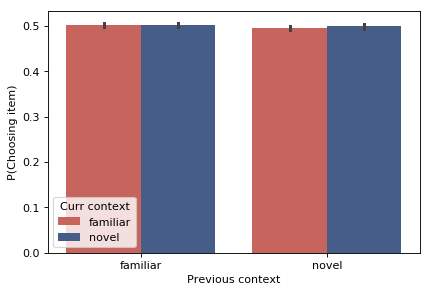

In [61]:
fig = plt.figure()
colors=[sns.xkcd_rgb["pale red"],sns.xkcd_rgb["denim blue"]]
ax = sns.barplot(x="Previous context", y="P(Choosing item)", order=['familiar','novel'], hue="Curr context", hue_order=['familiar','novel'], data=dynamic_trial_data, palette=colors, ci=68)
#ax.set_title('')
plt.show()

In [62]:
print 'N trials:'
print df_4dim.groupby(['Previous context','Curr context'])['P(Choosing item)'].count()

tmp=df_4dim.groupby(['subjid','Previous context','Curr context'],as_index=False)['P(Choosing item)'].mean()

print tmp.groupby(['Previous context','Curr context']).mean()
print tmp.groupby(['Previous context','Curr context']).sem()

N trials:
Previous context  Curr context
familiar          familiar        10972
                  novel           11011
novel             familiar        11112
                  novel           10989
Name: P(Choosing item), dtype: int64
                               P(Choosing item)
Previous context Curr context                  
familiar         familiar              0.501484
                 novel                 0.502006
novel            familiar              0.495838
                 novel                 0.498789
                               P(Choosing item)  subjid
Previous context Curr context                          
familiar         familiar              0.003770     NaN
                 novel                 0.003648     NaN
novel            familiar              0.003581     NaN
                 novel                 0.003795     NaN


<Figure size 480x320 with 0 Axes>

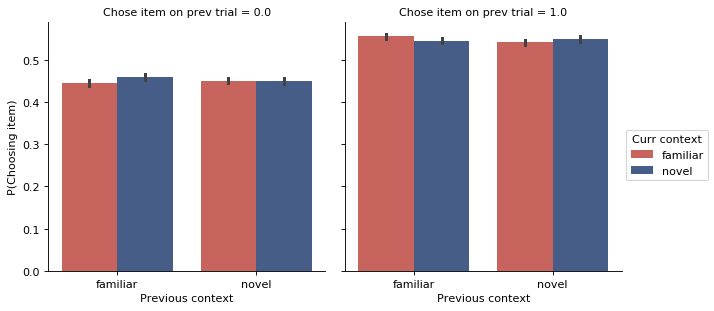

In [64]:
fig = plt.figure()
colors=[sns.xkcd_rgb["pale red"],sns.xkcd_rgb["denim blue"]]
ax = sns.factorplot(kind="bar", x="Previous context", y="P(Choosing item)", order=['familiar','novel'], hue="Curr context", hue_order=['familiar','novel'], col="Chose item on prev trial", data=dynamic_trial_data, palette=colors, ci=68)
#ax.set_title('')
plt.show()

In [65]:
print 'N trials:'
print df_4dim.groupby(['Previous context','Curr context','Chose item on prev trial'])['P(Choosing item)'].count()

tmp=df_4dim.groupby(['subjid','Previous context','Curr context','Chose item on prev trial'],as_index=False)['P(Choosing item)'].mean()

print tmp.groupby(['Previous context','Curr context','Chose item on prev trial']).mean()
print tmp.groupby(['Previous context','Curr context','Chose item on prev trial']).sem()

N trials:
Previous context  Curr context  Chose item on prev trial
familiar          familiar      0.0                         5426
                                1.0                         5546
                  novel         0.0                         5494
                                1.0                         5517
novel             familiar      0.0                         5597
                                1.0                         5515
                  novel         0.0                         5516
                                1.0                         5473
Name: P(Choosing item), dtype: int64
                                                        P(Choosing item)
Previous context Curr context Chose item on prev trial                  
familiar         familiar     0.0                               0.445376
                              1.0                               0.555866
                 novel        0.0                               0.458732
           

<Figure size 480x320 with 0 Axes>

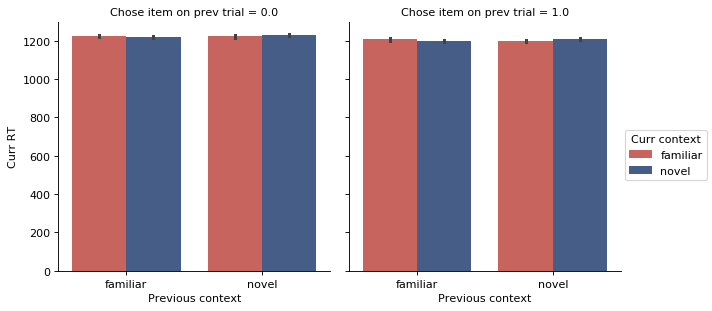

In [66]:
data = dynamic_trial_data.loc[dynamic_trial_data['P(Choosing item)']==1]
plt.rcParams['figure.dpi'] = 80
fig = plt.figure()
colors=[sns.xkcd_rgb["pale red"],sns.xkcd_rgb["denim blue"]]
ax = sns.factorplot(kind="bar", x="Previous context", y="Curr RT", order=['familiar','novel'], hue="Curr context", hue_order=['familiar','novel'], col="Chose item on prev trial", data=dynamic_trial_data, palette=colors, ci=68)
plt.show()

In [67]:
print 'N trials:'
print dynamic_trial_data.groupby(['Previous context','Curr context','Chose item on prev trial'])['Curr RT'].count()

tmp=dynamic_trial_data.groupby(['subjid','Previous context','Curr context','Chose item on prev trial'],as_index=False)['Curr RT'].mean()

print dynamic_trial_data.groupby(['Previous context','Curr context','Chose item on prev trial'])['Curr RT'].mean()
print dynamic_trial_data.groupby(['Previous context','Curr context','Chose item on prev trial'])['Curr RT'].sem()

N trials:
Previous context  Curr context  Chose item on prev trial
familiar          familiar      0.0                         5426
                                1.0                         5546
                  novel         0.0                         5494
                                1.0                         5517
novel             familiar      0.0                         5597
                                1.0                         5515
                  novel         0.0                         5516
                                1.0                         5473
Name: Curr RT, dtype: int64
Previous context  Curr context  Chose item on prev trial
familiar          familiar      0.0                         1223.592288
                                1.0                         1205.961566
                  novel         0.0                         1219.466451
                                1.0                         1199.050738
novel             familiar      0.0     

## Familiarity rating data

In [62]:
def getsubfamiliarityratingsdf(subjectId):
    subjectFolder = _dataDir + subjectId + '/'

    familiarityFile = subjectFolder + subjectId + familiarityRatingsFileEnd

    if os.path.exists(familiarityFile):
        df = pd.read_csv(familiarityFile)
        subdf = df[['subjectId','stimulus1','rating']]
        subdf.columns = ['subjid','food','rating']
        return subdf

def getfamiliarityratings(printFig):
    subjects = get_subjects_w_all_data()
    familiarity_ratings = pd.DataFrame()
    
    for subject in subjects:
        df = getsubfamiliarityratingsdf(subject)
        #df['rating'] = (df['rating'] - df['rating'].mean()) / df['rating'].std()
        familiarity_ratings = pd.concat([familiarity_ratings, df])
    familiarity_ratings.reset_index(inplace=True, drop=True)
    
    if printFig:
        allratings = familiarity_ratings.groupby('food',as_index=False).median()

        #ratingssem = ratings.groupby('food').sem()['rating'].values    
        #allratings['sem'] = ratingssem

        allratings.sort_values('rating', ascending=True, inplace=True)
        allratings.reset_index(inplace=True, drop=True)

        #print "Mean Rating:", allratings['rating'].mean(), "±", allratings['rating'].std()
        #print allratings

        plt.rcParams['figure.dpi'] = 140
        fig = plt.figure()

        ax = sns.barplot(x="food", y="rating", data=allratings, color='xkcd:denim blue')
        ax.set_title('Median Food Familiarity Rating')
        plt.xticks(rotation=90)
        ax.set_ylim(0,10)
        ax.tick_params(labelsize=5)
        plt.show()
    return familiarity_ratings
    

total number of people who accepted the HIT 124
82 subjects completed all the tasks.


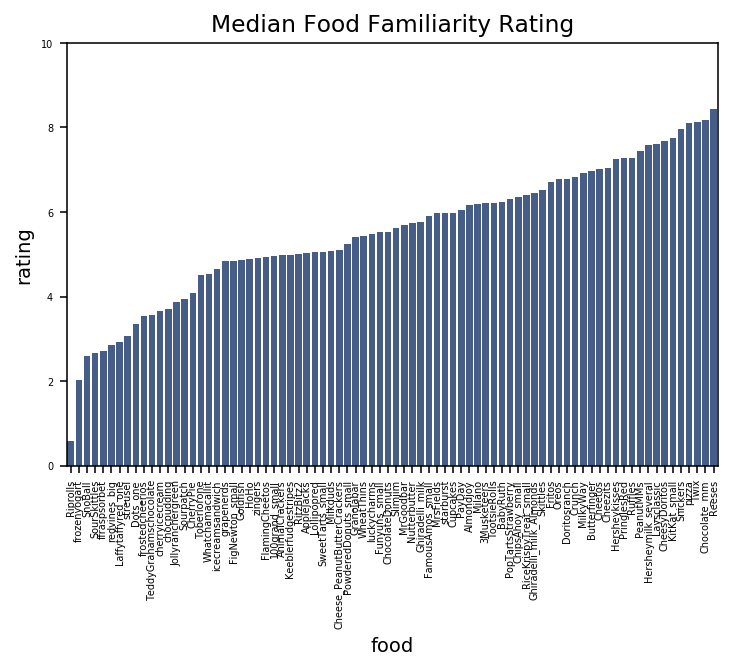

In [63]:
getfamiliarityratings(printFig=True);

In [81]:
def getsubauctionratingsdf(subjectId):
    subjectFolder = _dataDir + subjectId + '/'

    familiarityFile = subjectFolder + subjectId + auctionFileEnd

    if os.path.exists(familiarityFile):
        df = pd.read_csv(familiarityFile)
        subdf = df[['subjectId','stimulus1','rating']]
        subdf.columns = ['subjid','food','rating']
        return subdf

def getauctionratings(printFig):
    subjects = get_subjects_w_all_data()
    familiarity_ratings = pd.DataFrame()
    
    for subject in subjects:
        df = getsubauctionratingsdf(subject)
        #df['rating'] = (df['rating'] - df['rating'].mean()) / df['rating'].std()
        familiarity_ratings = pd.concat([familiarity_ratings, df])
    familiarity_ratings.reset_index(inplace=True, drop=True)
    
    if printFig:
        allratings = familiarity_ratings.groupby('food',as_index=False).median()

        #ratingssem = ratings.groupby('food').sem()['rating'].values    
        #allratings['sem'] = ratingssem

        allratings.sort_values('rating', ascending=True, inplace=True)
        allratings.reset_index(inplace=True, drop=True)

        #print "Mean Rating:", allratings['rating'].mean(), "±", allratings['rating'].std()
        #print allratings

        plt.rcParams['figure.dpi'] = 140
        fig = plt.figure()

        ax = sns.barplot(x="food", y="rating", data=allratings, color='xkcd:denim blue')
        ax.set_title('Median Food Auction Rating')
        plt.xticks(rotation=90)
        ax.set_ylim(0,10)
        ax.tick_params(labelsize=5)
        plt.show()
    return familiarity_ratings

total number of people who accepted the HIT 124
82 subjects completed all the tasks.


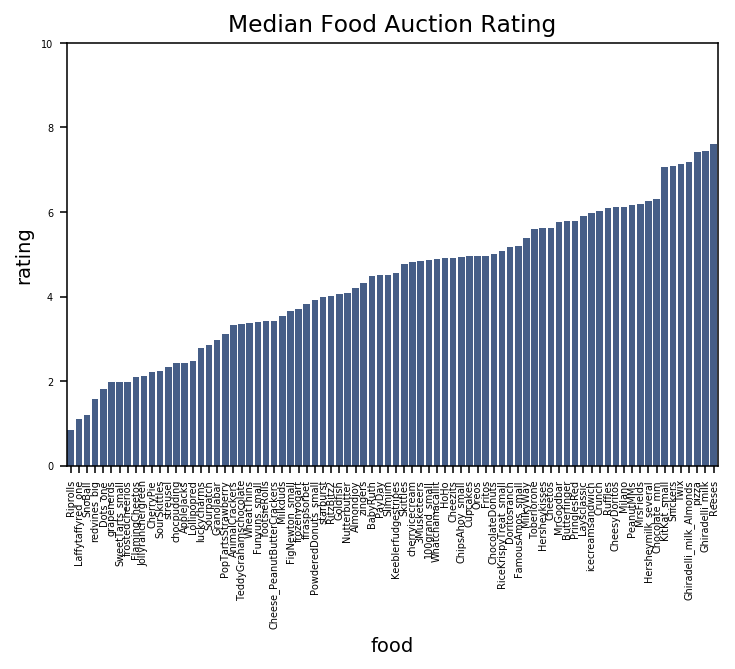

In [82]:
getauctionratings(printFig=True);